# Детекция типов **мусора**

**Заказчик**<br>
Renue – IT-компания из Екатеринбурга, разрабатывает на заказ высоконагруженные и отказоустойчивые решения для крупных российских заказчиков, для бизнеса и государства.

**Описание**<br>
В мире, где переработка отходов играет важную роль в защите окружающей среды, сортировка мусора является ключевым элементом в повышении эффективности перерабатывающих заводов. В рамках задачи необходимо разработать модель, способную автоматически определять различные типы мусора на сортировочном конвейере мусороперерабатывающего завода.

Набор данных содержит изображения, снятые с камер, установленных над сортировочным конвейером на перерабатывающем заводе.
Разнообразие типов отходов добавляет сложности, так как материалы могут выглядеть по-разному в зависимости от условий освещения и положения на конвейере.
Решение должно быть способным не только определять наличие мусора, но и классифицировать его по типам для дальнейшей сортировки.

**Файл предсказания**<br>
Для каждого изображения в тестовом датасете нужно определить все объекты.

* Для каждого объекта указать класс, `confidence score` и координаты в формате `xywh` (левый верхний угол, ширина, высота)
* Все предсказания для отдельного изображения собираются в список списков и указываются в одной ячейке `bbox`
* Если в изображении нет объектов, то поле `bbox` должно быть в виде пустого списка []


```
file_name,bbox
file_name,[[category_id, confidence, x_left, y_top,width, height],[category_id, confidence, x_left, y_top, width, height]]
file_name,[]
```

**Метрика**<br>
Для оценки качества модели используется среднее взвешенное по классам (weighted mean by class support) mAP.



## Описание данных


**Файлы**<br>

* **images**: Папка, содержащая 9000 изображений. Каждое изображение представляет кадр с конвейерной ленты, на котором видны отходы различных типов
* **train.csv**: CSV-файл, содержащий разметку для обучения модели. Каждая строка включает:
** `file_name`: имя файла
** `bbox`: рамка в формате [x_left, y_top, width, height]
** `category_id`: класс объекта, присутствующего на изображении
* **test.csv**: Файл, содержащий имена изображений для тестирования. Эти изображения необходимо классифицировать с помощью разработанных моделей
* **sample_submission.csv**: Пример файла для отправки решений:
** `file_name`: имя файла
** `bbox`: список списков, каждый объект в формате [class, confidence, x_left, y_top, width, height]<br><br>

**Классы объектов:**<br>
Набор данных включает 15 классов пластиковых отходов:
* 1 PET (transparent) (green)
* 2 PET (transparent) (brown)
* 3 PET (transparent) (blue)
* 4 PET (transparent)
* 5 PET (transparent) (dark blue)
* 6 PET (black)
* 7 PET (white)
* 8 PET (sticker)
* 9 PET (flacon)
* 10 PET (household chemicals)
* 11 PND (household chemicals)
* 12 PND packet
* 13 Other plastic
* 14 Other plastic (transparent)
* 15 Not plastic<br><br>

**Формат изображений:**<br>
* 9000 изображений в формате JPEG
* Изображения представляют вид с камеры над конвейером
* Размер изображения 2048x1486 пикселей

## Загрузка и обработка данных

Подключаем гугл драйв для скачивания исходных файлов

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [43]:
import os
import cv2
import gc
import ast
import torch
import yaml
import shutil
import glob
import random

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg

from tqdm import tqdm
from sklearn.model_selection import train_test_split
from IPython.display import Image, display

!pip install ultralytics
from ultralytics import YOLO

Копируем файлы в локуальную среду

In [4]:
source_path = '/content/drive/MyDrive/waste-detection/'
destination_path = '/content/waste-detection/'

shutil.copytree(source_path, destination_path)

print(f"Файл скопирован из {source_path} в {destination_path}.")

Файл скопирован из /content/drive/MyDrive/waste-detection/ в /content/waste-detection/.


Загрузка данных

In [5]:
train_csv_path = '/content/waste-detection/train.csv'
test_csv_path = '/content/waste-detection/test.csv'
images_dir = '/content/waste-detection/images'

Проверим данные в `train_df`

In [6]:
train_df = pd.read_csv(train_csv_path)

In [7]:
missing_bboxes = train_df['bbox'].isnull().sum()
print(f"Количество пропущенных значений в 'bbox': {missing_bboxes}")

Количество пропущенных значений в 'bbox': 117


Преобразуем данные `bbox` в списки

In [8]:
def safe_literal_eval(val):
    try:
        return ast.literal_eval(val)
    except (ValueError, SyntaxError):
        print(f"Некорректное значение bbox: {val}")
        return None

train_df['bbox'] = train_df['bbox'].apply(safe_literal_eval)

Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некорректное значение bbox: nan
Некоррек

В ходе работе над задачей был проверено две стратегии обработки пропусков:<br>
* 1. оставить пустые списки
* 2. удалить данные с пропусками.<br>

Второй вариант показал лучшие результаты.

In [9]:
train_df = train_df.dropna(subset=['bbox'])
missing_bboxes = train_df['bbox'].isnull().sum()
print(f"Количество пропущенных значений в 'bbox': {missing_bboxes}")

Количество пропущенных значений в 'bbox': 0


Обработка значений в `categoru_id`

In [10]:
# Преобразование 'category_id' в числовой тип
train_df['category_id'] = pd.to_numeric(train_df['category_id'], errors='coerce')

# Удаление строк с некорректными 'category_id'
train_df = train_df.dropna(subset=['category_id'])
train_df['category_id'] = train_df['category_id'].astype(int)

Загрузка имен файлов для тестирования

In [11]:
test_df = pd.read_csv(test_csv_path)

In [12]:
print("Первые строки train.csv:")
print(train_df.head())

print("\nПервые строки test.csv:")
print(test_df.head())

Первые строки train.csv:
    file_name                                        bbox  category_id
0  000001.jpg                  [840.0, 0.0, 176.0, 124.0]            4
1  000001.jpg                [612.0, 306.0, 383.0, 397.0]            2
2  000001.jpg  [990.92, 551.0, 105.00000000000011, 186.0]            4
3  000002.jpg                [1000.0, 614.0, 98.0, 178.0]            4
4  000002.jpg                [605.0, 358.0, 402.0, 409.0]            2

Первые строки test.csv:
    file_name
0  000003.jpg
1  000006.jpg
2  000013.jpg
3  000016.jpg
4  000019.jpg


Выведем примеры изображений с разметкой

In [13]:
def show_image_with_annotations(file_name, annotations_df, images_dir):
    img_path = os.path.join(images_dir, file_name)
    image = cv2.imread(img_path)

    # Проверка успешности чтения изображения
    if image is None:
        print(f"Не удалось загрузить изображение {img_path}")
        return

    # OpenCV читает изображение в формате BGR, преобразуем в RGB для корректного отображения
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Получение аннотаций для данного изображения
    annotations = annotations_df[annotations_df['file_name'] == file_name]

    # Создание фигуры и оси для отображения
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)
    ax.axis('off')  # Отключаем оси

    # Проходим по всем аннотациям и рисуем ограничивающие рамки
    for idx, row in annotations.iterrows():
        bbox = row['bbox']
        category_id = int(row['category_id'])

        # Извлечение координат ограничивающей рамки
        if bbox != []:
            x_left, y_top, width, height = bbox

            # Создание прямоугольника
            rect = patches.Rectangle(
                (x_left, y_top), width, height,
                linewidth=2, edgecolor='r', facecolor='none'
            )

            # Добавление прямоугольника на график
            ax.add_patch(rect)

            # Добавление текста с категорией (опционально)
            ax.text(
                x_left, y_top - 5,
                f"Class: {category_id}",
                fontsize=12, color='red',
                backgroundcolor='white'
            )

    plt.show()

In [14]:
unique_files = train_df['file_name'].unique()

# Выбор 5 изображений для визуализации
N = 5
sample_files = np.random.choice(unique_files, N, replace=False)

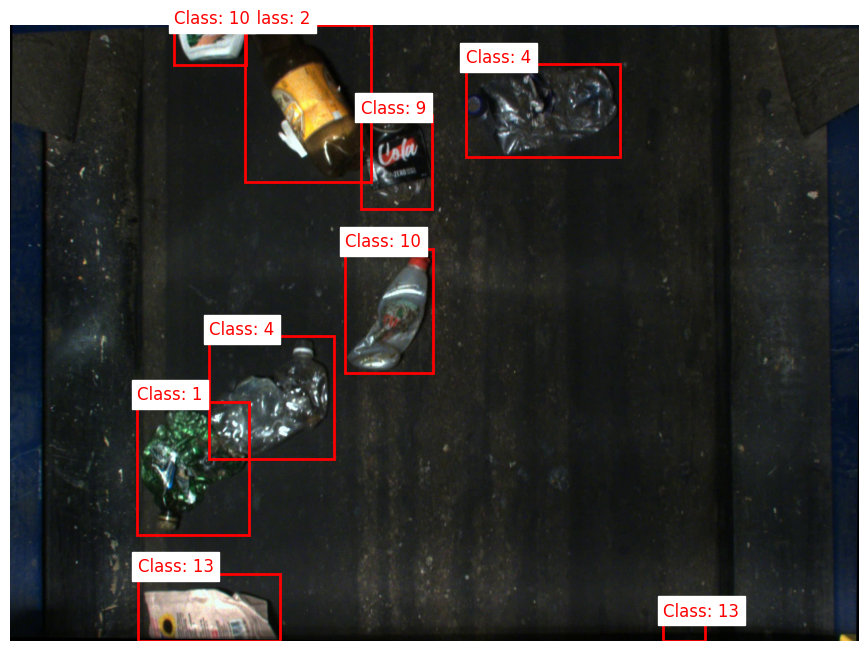

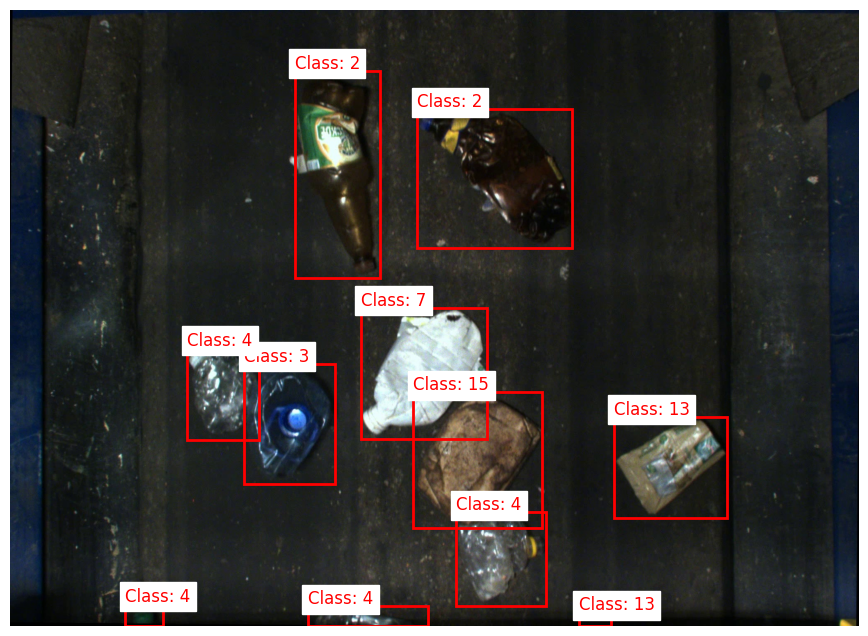

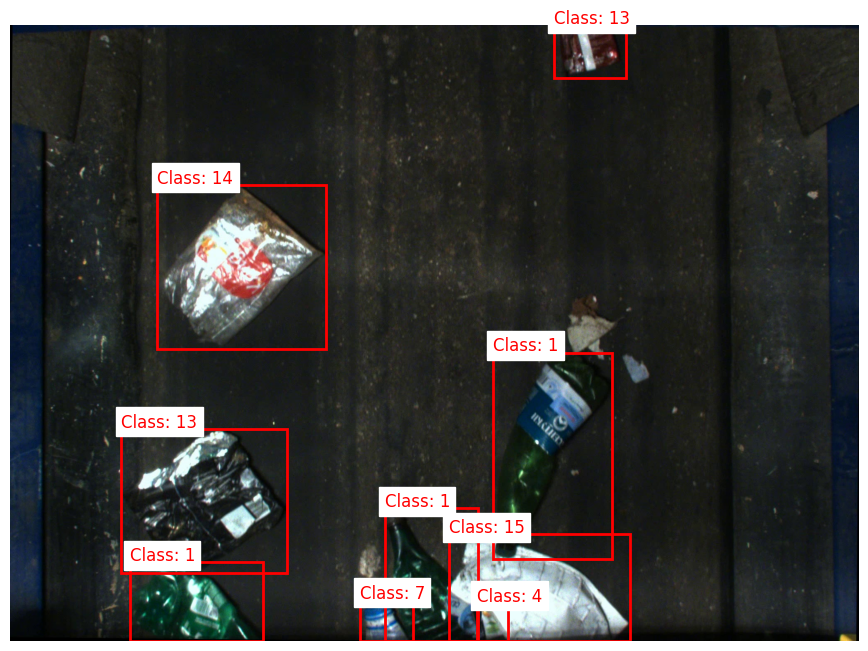

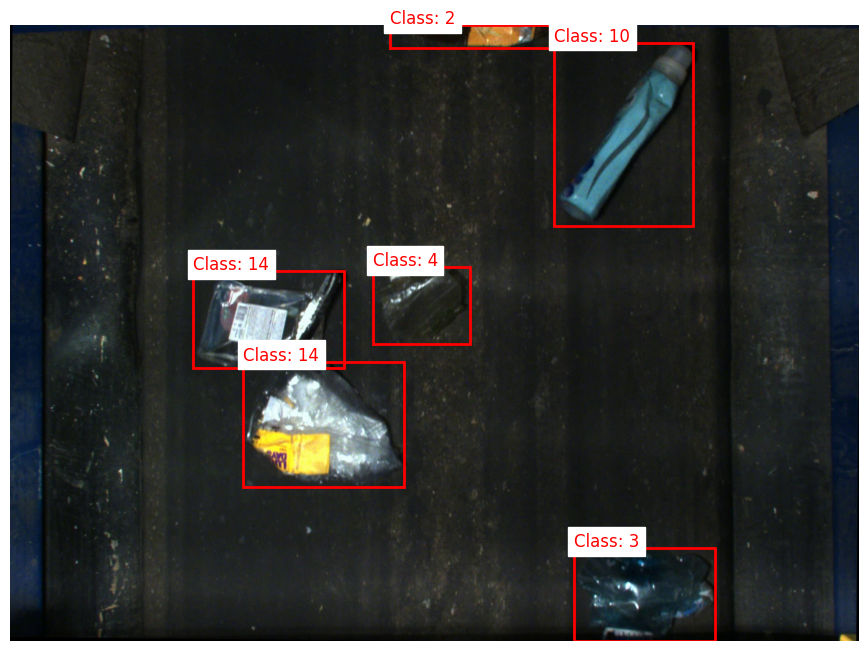

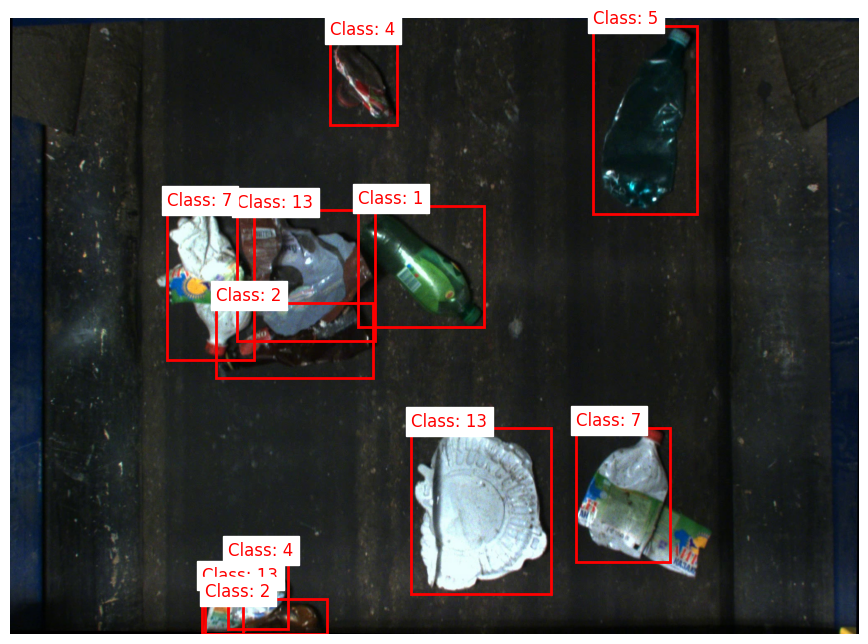

In [15]:
for file_name in sample_files:
    show_image_with_annotations(file_name, train_df, images_dir)

## Подготовка данных для обучения

In [16]:
# Получение уникальных имен файлов из тренировочного датасета
image_files = train_df['file_name'].unique()

# Разделение данных на обучающую и валидационную выборки
train_files, val_files = train_test_split(image_files, test_size=0.2, random_state=42)

In [17]:
# Создание директорий для датасета в формате YOLO
os.makedirs('/content/dataset/images/train', exist_ok=True)
os.makedirs('/content/dataset/images/val', exist_ok=True)
os.makedirs('/content/dataset/labels/train', exist_ok=True)
os.makedirs('/content/dataset/labels/val', exist_ok=True)

In [18]:
# Функция для преобразования bbox в формат YOLO
def convert_bbox_to_yolo(bbox, img_width, img_height):
    x_left, y_top, width, height = bbox
    x_center = x_left + width / 2
    y_center = y_top + height / 2
    x_center /= img_width
    y_center /= img_height
    width /= img_width
    height /= img_height
    return [x_center, y_center, width, height]

In [19]:
# Параметры изображений
img_width = 2048
img_height = 1486

In [20]:
def process_dataset(file_names, annotations_df, images_dir, output_dir, img_width, img_height, subset_name):
    """
    Args:
        file_names (list): Список имён файлов выборки.
        annotations_df (pd.DataFrame): DataFrame с аннотациями.
        images_dir (str): Путь к исходным изображениям.
        output_dir (str): Путь для сохранения обработанных данных.
        img_width (int): Ширина изображений.
        img_height (int): Высота изображений.
        subset_name (str): Название подвыборки ('train' или 'val').
    """
    # Создание директорий для изображений и меток
    images_output_dir = os.path.join(output_dir, f"images/{subset_name}")
    labels_output_dir = os.path.join(output_dir, f"labels/{subset_name}")
    os.makedirs(images_output_dir, exist_ok=True)
    os.makedirs(labels_output_dir, exist_ok=True)

    for file_name in tqdm(file_names, desc=f"Обработка {subset_name} выборки"):
        # Копирование изображений
        src_img_path = os.path.join(images_dir, file_name)
        dst_img_path = os.path.join(images_output_dir, file_name)
        if not os.path.exists(dst_img_path):
            os.symlink(os.path.abspath(src_img_path), dst_img_path)

        # Получение аннотаций для текущего изображения
        annotations = annotations_df[annotations_df['file_name'] == file_name]

        # Создание файла разметки
        label_file_name = os.path.splitext(file_name)[0] + '.txt'
        label_file_path = os.path.join(labels_output_dir, label_file_name)

        with open(label_file_path, 'w') as f:
            for idx, row in annotations.iterrows():
                if row['category_id'] == -1 or row['bbox'] == []:
                    continue
                bbox = row['bbox']
                category_id = int(row['category_id']) - 1
                yolo_bbox = convert_bbox_to_yolo(bbox, img_width, img_height)
                f.write(f"{category_id} {' '.join(map(str, yolo_bbox))}\n")

# Применение функции к обучающей и валидационной выборкам
output_dir = '/content/dataset'
process_dataset(train_files, train_df, images_dir, output_dir, img_width, img_height, 'train')
process_dataset(val_files, train_df, images_dir, output_dir, img_width, img_height, 'val')

Обработка val выборки: 100%|██████████| 1177/1177 [00:04<00:00, 292.30it/s]


## Определение baseline

In [21]:
#Создание файла yaml для YOLO

data_yaml_baseline = """
train: /content/dataset/images/train
val: /content/dataset/images/val

nc: 15
names: ['PET (transparent) (green)', 'PET (transparent) (brown)', 'PET (transparent) (blue)', 'PET (transparent)', 'PET (transparent) (dark blue)', 'PET (black)', 'PET (white)', 'PET (sticker)', 'PET (flacon)', 'PET (household chemicals)', 'PND (household chemicals)', 'PND packet', 'Other plastic', 'Other plastic (transparent)', 'Not plastic']

"""

with open('data_baseline.yaml', 'w') as f:
    f.write(data_yaml_baseline)

In [22]:
model_baseline = YOLO('yolo11n.pt')

100%|██████████| 5.35M/5.35M [00:00<00:00, 178MB/s]


In [26]:
results_baseline = model_baseline.val(data='data_baseline.yaml', split='val', conf=0.001)

Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/dataset/labels/val.cache... 1177 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1177/1177 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:09<00:00,  7.57it/s]


                   all       1177       6191     0.0403      0.153     0.0272     0.0195
                person        666        913     0.0511      0.687     0.0652     0.0459
               bicycle        809       1433      0.275     0.0858      0.156      0.111
                   car        153        160     0.0272      0.237     0.0228     0.0183
            motorcycle        530        724     0.0721      0.181     0.0452     0.0308
              airplane        148        160     0.0201     0.0875     0.0133    0.00955
                   bus         92         95     0.0107     0.0211     0.0058    0.00464
                 train        410        496    0.00476    0.00806     0.0024    0.00186
                 truck         68         71    0.00287     0.0141    0.00147    0.00132
                  boat        110        125     0.0118       0.04    0.00657    0.00591
         traffic light        353        438     0.0489      0.244     0.0332     0.0248
          fire hydran

In [27]:
print(f"Baseline mAP@0.5: {results_baseline.box.map50}")
print(f"Baseline mAP@0.5:0.95: {results_baseline.box.map}")

Baseline mAP@0.5: 0.027215105423130583
Baseline mAP@0.5:0.95: 0.019511388145269305


In [28]:
# Предсказания на валидационной выборке
predictions = model_baseline.predict(source='/content/dataset/images/val', data='data_baseline.yaml', save=True, conf=0.001)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1177 /content/dataset/images/val/000011.jpg: 480x640 2 persons, 1 train, 1 bench, 2 umbrellas, 3 snowboards, 1 baseball bat, 1 bottle, 7 knifes, 2 chairs, 1 oven, 1 sink, 2 refrigerators, 10 scissorss, 1 toothbrush, 12.6ms
image 2/1177 /content/dataset/images/val/000017.jpg: 480x640 3 persons, 1 bench, 1 bird, 2 umbrellas, 7 bottles, 1 cup, 2 knifes, 2 chairs, 1 oven, 1 toothbrush, 9.5ms
image 3/1177 /content/dataset/images/val/000020.jpg: 480x

In [29]:
print("Результаты сохранены в папке:", predictions[0].save_dir)

Результаты сохранены в папке: runs/detect/predict


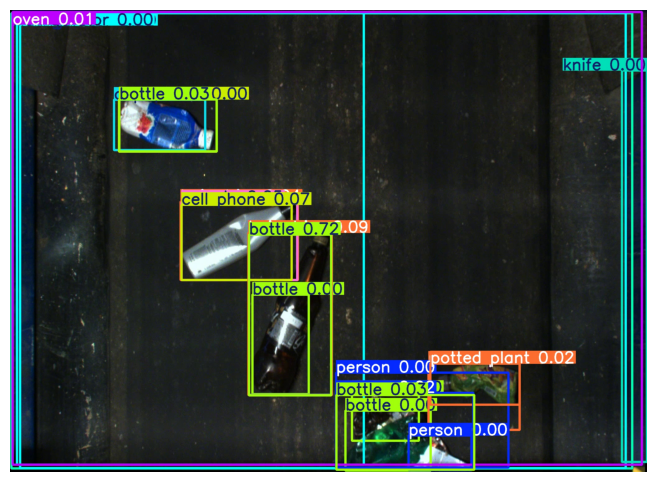

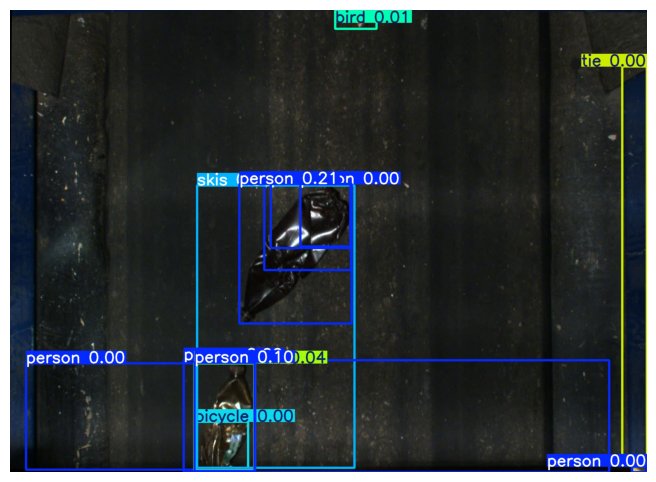

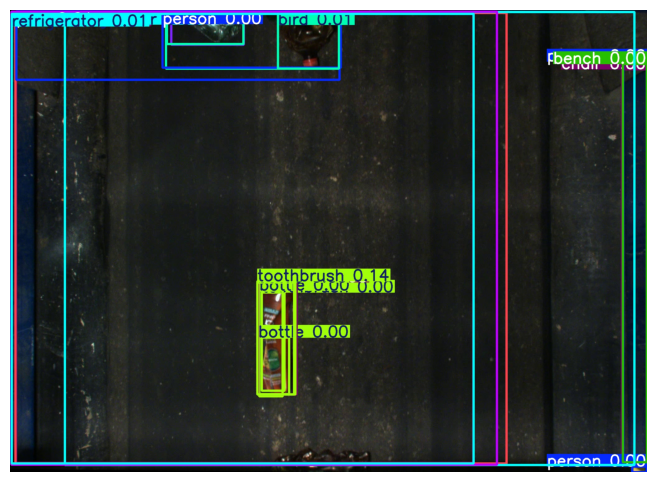

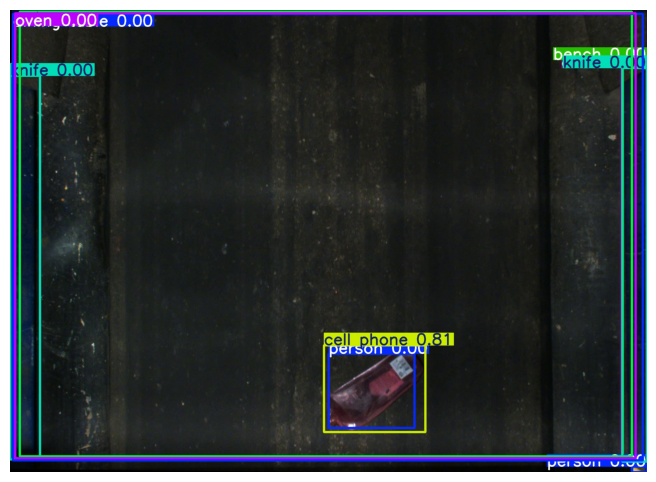

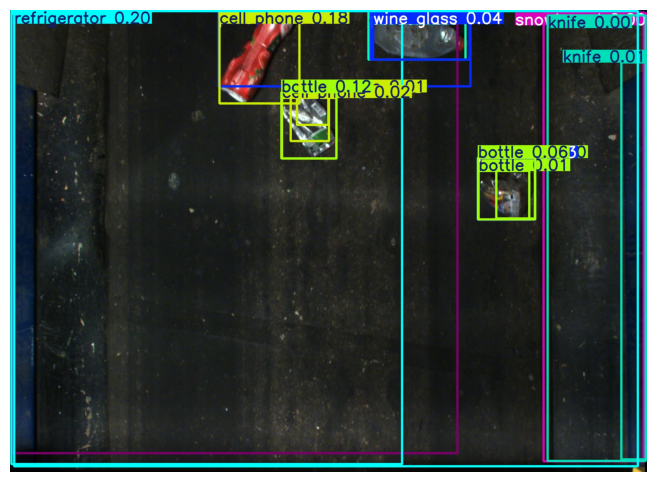

In [30]:
results_dir = predictions[0].save_dir

# Получение списка файлов
image_files = [os.path.join(results_dir, f) for f in os.listdir(results_dir) if f.endswith('.jpg')]

# Функция для отображения изображения
def show_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Преобразование в RGB
    plt.figure(figsize=(10, 6))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Вывод первых 5 изображений
for image_path in image_files[:5]:
    show_image(image_path)

## Подбор гиперпараметров

В рамках исследования работа проводилась с моделями YOLOv8, YOLO11n, YOLOn, сначала гиперпараметры подбирались вручную, в том числе были проверены разные варианты аугментации, размеры батча (8, 16, 32, 64 и 128) и image size (640 и 800). Результаты были ниже лучшей модели, которая оставлена в данной тетради. Далее был пременен метод tune для yolo11n для поисков лучших гиперпараметров. В соответсвии с документаций yolo рекомендуемы параметры train - 30 эпох и 300 итераций. В результате было сделано 100 итераций, т.к. это оказалось очень ресурсо емко - на A100 GPU вычесления заняли 12 часов.

In [31]:
model = YOLO('yolo11n.pt')  # Используем предобученную модель yolo11

In [ ]:
# код для поиска лучших гиперпараметров

#model.tune(data='/content/data.yaml', epochs=30, iterations=300, batch=128, plots=False, save=False, val=False)

В результате поиска лучших гиперпараметров на 79ой итерации были определены следующие параметры:
<br>
* lr0: 0.00909<br>
* lrf: 0.0077<br>
* momentum: 0.92086<br>
* weight_decay: 0.00029<br>
* warmup_epochs: 4.12656<br>
* warmup_momentum: 0.37529<br>
* box: 9.44297<br>
* cls: 0.44787<br>
* dfl: 1.63055<br>
* hsv_h: 0.01667<br>
* hsv_s: 0.86189<br>
* hsv_v: 0.38791<br>
* degrees: 0.0<br>
* translate: 0.06124<br>
* scale: 0.35021<br>
* shear: 0.0<br>
* perspective: 0.0<br>
* flipud: 0.0<br>
* fliplr: 0.30873<br>
* bgr: 0.0<br>
* mosaic: 0.97113<br>
* mixup: 0.0<br>
* copy_paste: 0.0<br>

Результаты подбора гиперпараметров

In [32]:
def show_image(image_path):
  image = mpimg.imread(image_path)

  # Вычисление размеров в дюймах для сохранения оригинального масштаба
  dpi = 100  # Разрешение экрана (по умолчанию 100 dpi)
  height, width = image.shape[:2]
  figsize = (width / dpi, height / dpi)

  # Отображение изображения в оригинальном размере
  plt.figure(figsize=figsize)
  plt.imshow(image)
  plt.axis('off')  # Отключаем оси
  plt.show()

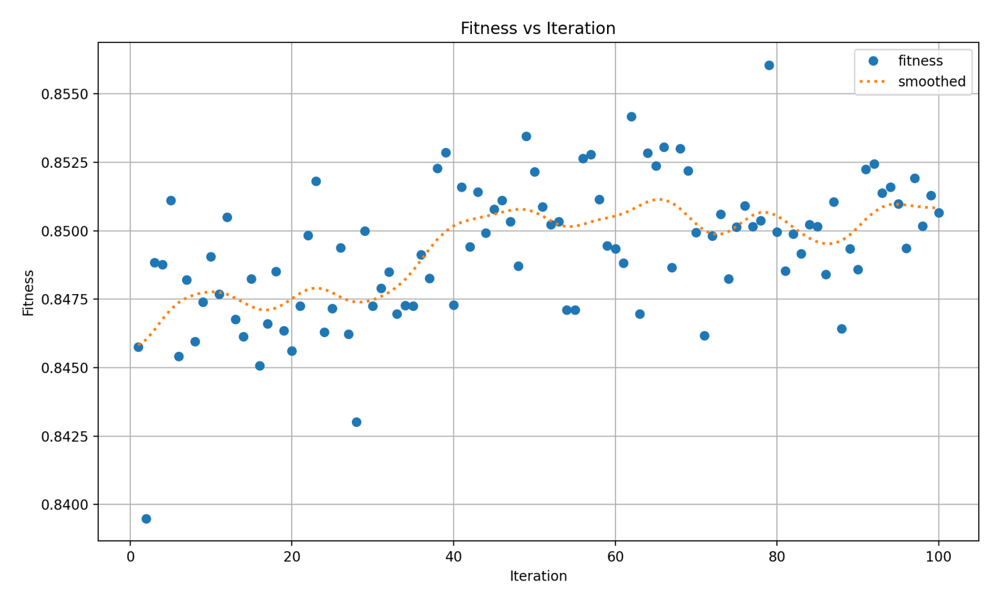

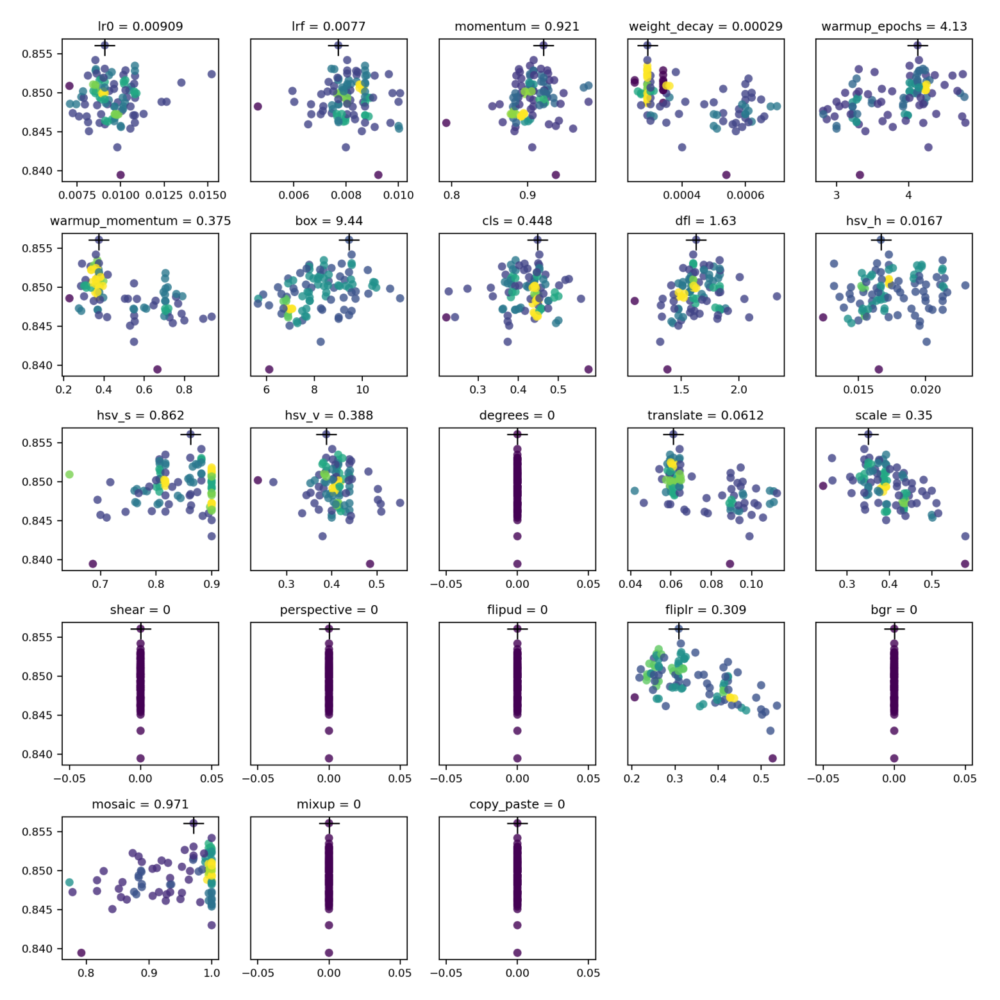

In [ ]:
show_image('/content/tune_fitness.png') #  здесь нужно указать путь к файлу tune_fitnes из репозитория
show_image('/content/tune_scatter_plots.png') #  здесь нужно указать путь к файлу tune_scatter_plots из репозитория

**Вывод**<br>
Автоматический подбор гиперпараметров в данном случае не дал значительного скачка в метрике, а лишь вывел систему на некоторый стабильный уровень качества. Лучшие метрики была определены на шаге 79. Для дальнейшего прогресса потребуется либо пересмотр стратегии оптимизации, либо включение дополнительных факторов (новые гиперпараметры, другая модельная архитектура, улучшение качества данных и т.д.).

## Обучение модели

Используем гиперпараметры, найденые с помощью tune, эксперементальным путем было установлено, что необходимо 150 эпох, чтобы предотвратить переобученние модели.

In [33]:
data_yaml = """
train: /content/dataset/images/train
val: /content/dataset/images/val

nc: 15
names: ['PET (transparent) (green)', 'PET (transparent) (brown)', 'PET (transparent) (blue)', 'PET (transparent)', 'PET (transparent) (dark blue)', 'PET (black)', 'PET (white)', 'PET (sticker)', 'PET (flacon)', 'PET (household chemicals)', 'PND (household chemicals)', 'PND packet', 'Other plastic', 'Other plastic (transparent)', 'Not plastic']

lr0: 0.00909
lrf: 0.0077
momentum: 0.92086
weight_decay: 0.00029
warmup_epochs: 4.12656
warmup_momentum: 0.37529
box: 9.44297
cls: 0.44787
dfl: 1.63055
hsv_h: 0.01667
hsv_s: 0.86189
hsv_v: 0.38791
degrees: 0.0
translate: 0.06124
scale: 0.35021
shear: 0.0
perspective: 0.0
flipud: 0.0
fliplr: 0.30873
bgr: 0.0
mosaic: 0.97113
mixup: 0.0
copy_paste: 0.0


"""

with open('data.yaml', 'w') as f:
    f.write(data_yaml)

In [34]:
model = YOLO('yolo11n.pt')

In [ ]:
model.train(data='/content/data.yaml', epochs=150,
            imgsz=800, patience=20, batch=128,
            name='plastic_waste_detector')

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/data.yaml, epochs=150, time=None, patience=20, batch=128, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=plastic_waste_detector4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

train: Scanning /content/dataset/labels/train... 5669 images, 99 backgrounds, 0 corrupt: 100%|██████████| 5669/5669 [00:05<00:00, 1034.55it/s]


train: New cache created: /content/dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset/labels/val... 2064 images, 18 backgrounds, 0 corrupt: 100%|██████████| 2064/2064 [00:02<00:00, 921.22it/s]


val: New cache created: /content/dataset/labels/val.cache
Plotting labels to runs/detect/plastic_waste_detector4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.001), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 800 train, 800 val
Using 8 dataloader workers
Logging results to runs/detect/plastic_waste_detector4
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      29.1G     0.9419       3.62      1.058        272        800: 100%|██████████| 45/45 [00:33<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.31s/it]

                   all       2064      10863     0.0431      0.785      0.119     0.0964



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      28.8G     0.8818      2.057      1.051        318        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.36s/it]


                   all       2064      10863      0.797      0.133      0.276      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      28.9G     0.8115      1.491      1.001        312        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:13<00:00,  1.53s/it]


                   all       2064      10863      0.485      0.467      0.498      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150        29G      0.788      1.256     0.9895        420        800: 100%|██████████| 45/45 [00:31<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:14<00:00,  1.57s/it]


                   all       2064      10863      0.676      0.538      0.608        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150        29G     0.7596      1.095     0.9757        319        800: 100%|██████████| 45/45 [00:31<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.39s/it]


                   all       2064      10863      0.694      0.596      0.651      0.544

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      28.8G     0.7469     0.9846     0.9681        341        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


                   all       2064      10863      0.695      0.602      0.682      0.561

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      28.8G     0.7284     0.8759     0.9599        347        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.41s/it]


                   all       2064      10863      0.786      0.738      0.813      0.688

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      28.9G     0.7154     0.8252     0.9572        340        800: 100%|██████████| 45/45 [00:31<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.36s/it]


                   all       2064      10863      0.842      0.742       0.84      0.708

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      29.1G      0.714     0.7709     0.9596        364        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.14s/it]


                   all       2064      10863      0.862      0.795      0.866      0.733

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      29.1G     0.6986     0.7234     0.9525        389        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.26s/it]


                   all       2064      10863      0.878      0.783      0.878      0.744

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      30.1G     0.6927     0.6916     0.9516        242        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


                   all       2064      10863      0.883      0.783      0.869      0.743

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      29.1G     0.6777     0.6561     0.9451        364        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


                   all       2064      10863      0.891      0.761      0.876       0.75

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      28.8G     0.6773     0.6436     0.9479        323        800: 100%|██████████| 45/45 [00:29<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.39s/it]


                   all       2064      10863      0.892      0.792      0.876      0.739

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      28.9G     0.6673     0.6132     0.9424        382        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.42s/it]


                   all       2064      10863      0.928      0.841      0.916       0.79

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150        29G     0.6683     0.6035     0.9462        339        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.08s/it]


                   all       2064      10863      0.909      0.849      0.922      0.797

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      29.1G      0.657     0.5836     0.9404        331        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.20s/it]


                   all       2064      10863        0.9      0.844      0.917      0.794

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      29.1G     0.6581     0.5772     0.9408        390        800: 100%|██████████| 45/45 [00:31<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.42s/it]


                   all       2064      10863       0.91      0.822      0.911      0.779

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      30.1G     0.6481     0.5592     0.9376        328        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.14s/it]


                   all       2064      10863       0.93      0.837      0.919      0.789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150        29G     0.6434     0.5498     0.9381        405        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.17s/it]


                   all       2064      10863       0.95      0.859      0.933      0.812

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150        29G     0.6375     0.5392     0.9377        332        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.25s/it]


                   all       2064      10863       0.96      0.874      0.937       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      29.1G     0.6358     0.5359     0.9348        447        800: 100%|██████████| 45/45 [00:30<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]


                   all       2064      10863      0.941      0.855      0.931      0.809

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      30.1G     0.6276     0.5257      0.936        382        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


                   all       2064      10863      0.956      0.867      0.934      0.809

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      28.9G     0.6249     0.5112     0.9336        323        800: 100%|██████████| 45/45 [00:31<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.28s/it]


                   all       2064      10863      0.959      0.891      0.946       0.83

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      29.1G     0.6175     0.5009     0.9304        283        800: 100%|██████████| 45/45 [00:30<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.30s/it]


                   all       2064      10863      0.953      0.897      0.943      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150        29G      0.617     0.5007     0.9297        329        800: 100%|██████████| 45/45 [00:33<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


                   all       2064      10863      0.953      0.872      0.942       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150        29G     0.6109     0.4909     0.9272        352        800: 100%|██████████| 45/45 [00:30<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.31s/it]


                   all       2064      10863      0.962      0.883      0.946      0.828

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      28.8G     0.6062     0.4838     0.9252        360        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.28s/it]


                   all       2064      10863       0.97        0.9      0.949      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      28.8G     0.6054     0.4799     0.9285        306        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.22s/it]


                   all       2064      10863      0.967      0.907       0.95       0.84

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150        30G     0.6053     0.4757     0.9289        368        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.38s/it]


                   all       2064      10863      0.974      0.904      0.952      0.843

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      29.1G     0.6019     0.4712     0.9269        329        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.12s/it]


                   all       2064      10863      0.972      0.904      0.953      0.842

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      29.1G      0.599     0.4694      0.928        339        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.25s/it]


                   all       2064      10863      0.965      0.897      0.949      0.836

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      28.9G     0.5953     0.4624      0.925        369        800: 100%|██████████| 45/45 [00:31<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.43s/it]


                   all       2064      10863      0.973      0.906      0.954      0.849

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      28.8G     0.5924     0.4576     0.9244        358        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]


                   all       2064      10863      0.968      0.898       0.95      0.837

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      29.1G     0.5896     0.4529     0.9241        392        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.14s/it]


                   all       2064      10863      0.973      0.922      0.956       0.85

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150        29G     0.5922     0.4523     0.9236        356        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


                   all       2064      10863      0.975      0.922      0.957       0.85

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      28.9G     0.5796     0.4423     0.9196        316        800: 100%|██████████| 45/45 [00:31<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


                   all       2064      10863      0.981      0.918      0.956      0.853

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      28.7G     0.5838     0.4401     0.9224        291        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


                   all       2064      10863      0.985      0.923      0.957      0.857

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      28.9G     0.5814     0.4396     0.9228        330        800: 100%|██████████| 45/45 [00:33<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.13s/it]


                   all       2064      10863      0.981      0.918      0.956      0.855

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150        30G     0.5793     0.4359     0.9216        352        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.38s/it]


                   all       2064      10863      0.977      0.914      0.957       0.85

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150        29G     0.5749     0.4361     0.9215        287        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.19s/it]


                   all       2064      10863      0.981      0.923      0.959      0.859

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150        29G     0.5714     0.4306     0.9185        303        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.28s/it]


                   all       2064      10863      0.981      0.926      0.959      0.857

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      29.1G     0.5714     0.4273     0.9195        431        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.25s/it]


                   all       2064      10863      0.983      0.923      0.957      0.859

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150        29G     0.5697     0.4287     0.9181        325        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all       2064      10863      0.981      0.927      0.961      0.863

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150        29G     0.5669      0.425     0.9181        388        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.39s/it]


                   all       2064      10863      0.961      0.885      0.948      0.844

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      28.8G     0.5639     0.4169     0.9141        381        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.22s/it]


                   all       2064      10863      0.978      0.926      0.959      0.861

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150        29G     0.5576     0.4171     0.9119        369        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


                   all       2064      10863      0.988      0.925      0.963      0.868

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      28.9G     0.5601     0.4176     0.9142        340        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.32s/it]


                   all       2064      10863      0.979       0.93      0.963      0.865

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150        29G     0.5593     0.4103     0.9115        294        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.19s/it]


                   all       2064      10863      0.981      0.928      0.961      0.866

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      29.1G     0.5557     0.4067     0.9111        336        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


                   all       2064      10863       0.98      0.939      0.964      0.869

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      28.9G     0.5497     0.4027     0.9102        317        800: 100%|██████████| 45/45 [00:33<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.06s/it]


                   all       2064      10863      0.984      0.934      0.962      0.869

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      28.8G     0.5528     0.4064      0.913        341        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]


                   all       2064      10863      0.987      0.933      0.963      0.872

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      28.9G     0.5513     0.4028     0.9118        337        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.33s/it]


                   all       2064      10863      0.984      0.929      0.963      0.873

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      28.9G     0.5491     0.3998     0.9101        397        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


                   all       2064      10863      0.975       0.92       0.96      0.864

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      28.9G     0.5481     0.4016     0.9107        338        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.39s/it]


                   all       2064      10863      0.987      0.932      0.964      0.871

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      29.1G     0.5444     0.3999     0.9106        342        800: 100%|██████████| 45/45 [00:30<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.26s/it]


                   all       2064      10863      0.985      0.937      0.964      0.871

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      28.9G     0.5441     0.3961     0.9101        337        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.24s/it]


                   all       2064      10863      0.988      0.936      0.965      0.877

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      28.9G     0.5439     0.3955     0.9094        410        800: 100%|██████████| 45/45 [00:31<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.20s/it]


                   all       2064      10863      0.989      0.939      0.965      0.879

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      28.7G     0.5385     0.3914     0.9075        261        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.13s/it]


                   all       2064      10863      0.985      0.938      0.966       0.88

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      28.7G     0.5401     0.3898     0.9081        343        800: 100%|██████████| 45/45 [00:33<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]


                   all       2064      10863      0.989      0.933      0.965      0.878

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      28.7G     0.5367      0.388      0.906        340        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.20s/it]


                   all       2064      10863       0.99      0.939      0.966      0.875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      28.9G      0.533     0.3846     0.9056        347        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


                   all       2064      10863      0.991      0.937      0.966      0.879

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      28.9G     0.5357     0.3857     0.9066        310        800: 100%|██████████| 45/45 [00:33<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all       2064      10863      0.989      0.939      0.965      0.876

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      29.1G     0.5332     0.3826     0.9058        340        800: 100%|██████████| 45/45 [00:31<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.34s/it]


                   all       2064      10863      0.988      0.939      0.966      0.881

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      28.8G     0.5321     0.3809     0.9059        383        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.16s/it]


                   all       2064      10863       0.99      0.941      0.966      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150        29G       0.53     0.3802     0.9045        380        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.16s/it]


                   all       2064      10863      0.987      0.945      0.967      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      28.9G     0.5257     0.3753     0.9027        331        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.24s/it]


                   all       2064      10863      0.987      0.942      0.967      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      29.1G     0.5254     0.3741     0.9032        333        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.35s/it]

                   all       2064      10863       0.99      0.944      0.967      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      28.9G     0.5211     0.3728     0.9001        312        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all       2064      10863      0.989      0.945      0.968      0.885

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      29.1G     0.5232     0.3739     0.9019        390        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


                   all       2064      10863       0.99       0.94      0.966      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      29.9G     0.5223     0.3728     0.9039        301        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all       2064      10863      0.991      0.941      0.967      0.885

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150        30G     0.5181     0.3683     0.8989        337        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.19s/it]


                   all       2064      10863       0.99      0.941      0.967      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150        29G     0.5177     0.3649     0.9001        330        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.28s/it]


                   all       2064      10863      0.995      0.944      0.968      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      29.2G     0.5148     0.3646      0.899        305        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.23s/it]


                   all       2064      10863      0.989      0.943      0.968      0.886

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      29.1G     0.5156     0.3653     0.8989        399        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.42s/it]


                   all       2064      10863       0.99      0.945      0.968       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      28.8G      0.516     0.3653     0.9015        324        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.17s/it]


                   all       2064      10863       0.99      0.941      0.968      0.886

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      28.9G     0.5113     0.3637     0.8996        385        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.23s/it]


                   all       2064      10863       0.99      0.944      0.969      0.889

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      30.1G       0.51     0.3637     0.8981        356        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.13s/it]


                   all       2064      10863      0.991      0.941      0.967      0.887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      30.1G     0.5094     0.3569     0.8959        339        800: 100%|██████████| 45/45 [00:33<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all       2064      10863      0.989      0.946      0.969      0.887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150        29G     0.5072     0.3583     0.8959        380        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.32s/it]


                   all       2064      10863       0.99      0.944       0.97      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150        29G     0.5067     0.3549     0.8971        320        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.19s/it]


                   all       2064      10863      0.991      0.947       0.97      0.895

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150        29G     0.5064     0.3549     0.8967        388        800: 100%|██████████| 45/45 [00:31<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:13<00:00,  1.48s/it]


                   all       2064      10863      0.992      0.943      0.968       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150        29G     0.5035     0.3518     0.8946        374        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.22s/it]


                   all       2064      10863       0.99      0.947      0.969      0.892

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150        29G      0.506     0.3528     0.8958        320        800: 100%|██████████| 45/45 [00:30<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


                   all       2064      10863       0.99      0.946       0.97      0.893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      29.1G     0.5032     0.3514     0.8943        351        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.25s/it]


                   all       2064      10863      0.989      0.947       0.97       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150        30G     0.4976     0.3482     0.8925        354        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all       2064      10863      0.992      0.947       0.97      0.893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      28.9G      0.504     0.3537     0.8947        371        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.26s/it]

                   all       2064      10863      0.992      0.947      0.968      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150        29G      0.503     0.3511     0.8957        283        800: 100%|██████████| 45/45 [00:33<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.14s/it]


                   all       2064      10863      0.995      0.944      0.969      0.897

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150        29G     0.4952     0.3466     0.8919        294        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.17s/it]


                   all       2064      10863      0.992      0.947      0.971      0.895

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      28.7G     0.4963     0.3475     0.8907        286        800: 100%|██████████| 45/45 [00:32<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.30s/it]


                   all       2064      10863      0.993       0.95      0.971      0.897

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      30.1G     0.5012     0.3457     0.8955        299        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.23s/it]


                   all       2064      10863      0.992      0.947      0.972      0.897

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      29.1G     0.4948     0.3467     0.8921        366        800: 100%|██████████| 45/45 [00:33<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.12s/it]

                   all       2064      10863      0.988      0.951      0.971      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      28.9G     0.4948     0.3472     0.8914        392        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all       2064      10863      0.995      0.944       0.97      0.898

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150        29G     0.4925     0.3441      0.891        340        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


                   all       2064      10863      0.992      0.951      0.971      0.899

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      28.8G     0.4884     0.3394     0.8881        372        800: 100%|██████████| 45/45 [00:31<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]


                   all       2064      10863      0.992      0.951      0.972        0.9

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      30.1G     0.4871     0.3381     0.8885        398        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.17s/it]


                   all       2064      10863      0.995      0.947      0.971        0.9

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150        29G     0.4868     0.3393     0.8898        318        800: 100%|██████████| 45/45 [00:32<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


                   all       2064      10863      0.993      0.948      0.972        0.9

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150        29G     0.4832     0.3375     0.8872        360        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.28s/it]


                   all       2064      10863      0.993      0.948      0.971      0.899

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150        29G     0.4881     0.3391     0.8896        430        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.17s/it]


                   all       2064      10863       0.99      0.951      0.973      0.903

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      28.9G     0.4876     0.3371     0.8898        318        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.14s/it]


                   all       2064      10863      0.992      0.949      0.973        0.9

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      29.1G     0.4841      0.335     0.8908        349        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.28s/it]


                   all       2064      10863      0.994      0.948      0.972      0.902

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      28.9G     0.4825     0.3347     0.8869        305        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.10s/it]


                   all       2064      10863      0.992      0.951      0.972      0.904

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      29.1G     0.4823     0.3337     0.8893        318        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


                   all       2064      10863      0.993      0.948      0.972      0.905

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150        29G      0.477     0.3307      0.887        377        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


                   all       2064      10863      0.989      0.953      0.973      0.902

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150        29G     0.4798     0.3316     0.8862        319        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.24s/it]


                   all       2064      10863      0.993       0.95      0.974      0.905

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      29.1G     0.4769     0.3284     0.8842        322        800: 100%|██████████| 45/45 [00:30<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.37s/it]


                   all       2064      10863      0.994       0.95      0.974      0.907

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150        29G     0.4743     0.3274     0.8839        362        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.27s/it]


                   all       2064      10863      0.993       0.95      0.974      0.907

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150        29G     0.4738     0.3268     0.8845        356        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.17s/it]


                   all       2064      10863       0.99      0.953      0.973      0.899

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      29.1G     0.4743     0.3269     0.8859        308        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.23s/it]


                   all       2064      10863      0.992      0.952      0.974      0.905

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      28.9G     0.4724     0.3277     0.8835        328        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.24s/it]


                   all       2064      10863      0.994      0.951      0.974      0.906

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150        29G     0.4705     0.3236     0.8852        308        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.10s/it]


                   all       2064      10863      0.994      0.951      0.974      0.904

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      28.9G     0.4732     0.3249     0.8826        362        800: 100%|██████████| 45/45 [00:33<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.26s/it]


                   all       2064      10863      0.995       0.95      0.974      0.907

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      30.4G      0.468      0.321     0.8806        350        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.24s/it]


                   all       2064      10863      0.992      0.953      0.975       0.91

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      28.9G     0.4711     0.3232     0.8835        370        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.20s/it]


                   all       2064      10863      0.994      0.953      0.975       0.91

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      29.8G     0.4682     0.3244     0.8835        256        800: 100%|██████████| 45/45 [00:31<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.28s/it]


                   all       2064      10863      0.995       0.95      0.975      0.908

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150        29G     0.4667     0.3204     0.8821        317        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.20s/it]


                   all       2064      10863      0.995      0.951      0.975      0.905

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      29.1G     0.4666     0.3193     0.8816        355        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.23s/it]


                   all       2064      10863      0.994      0.951      0.974      0.905

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      30.3G     0.4633     0.3178     0.8799        305        800: 100%|██████████| 45/45 [00:31<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]


                   all       2064      10863      0.992      0.953      0.975      0.909

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      30.1G     0.4656     0.3176     0.8824        364        800: 100%|██████████| 45/45 [00:32<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.43s/it]


                   all       2064      10863      0.994       0.95      0.975       0.91

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      28.9G     0.4649     0.3187     0.8831        361        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.13s/it]


                   all       2064      10863      0.994      0.951      0.975       0.91

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      28.9G     0.4654      0.318     0.8811        349        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.19s/it]


                   all       2064      10863      0.992      0.954      0.976      0.911

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      28.8G     0.4612     0.3142     0.8792        359        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.24s/it]


                   all       2064      10863      0.992      0.953      0.976      0.911

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150        29G     0.4579     0.3144     0.8795        323        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all       2064      10863      0.992      0.953      0.976      0.912

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      28.8G     0.4598     0.3153     0.8791        383        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.14s/it]


                   all       2064      10863      0.994      0.952      0.977      0.913

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      29.1G     0.4586     0.3133     0.8807        346        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


                   all       2064      10863      0.994      0.952      0.977      0.912

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      29.1G       0.46     0.3155     0.8817        353        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.20s/it]


                   all       2064      10863      0.992      0.952      0.977      0.911

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      28.8G     0.4575      0.311     0.8794        360        800: 100%|██████████| 45/45 [00:33<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.18s/it]


                   all       2064      10863      0.992      0.954      0.977      0.911

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      29.1G     0.4558     0.3104     0.8791        338        800: 100%|██████████| 45/45 [00:30<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.34s/it]


                   all       2064      10863      0.993      0.952      0.977      0.913

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      28.8G      0.453     0.3082     0.8805        248        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.14s/it]


                   all       2064      10863      0.989      0.955      0.977      0.911

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      29.2G     0.4522     0.3097     0.8765        342        800: 100%|██████████| 45/45 [00:31<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


                   all       2064      10863      0.991      0.956      0.977      0.914

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150        29G     0.4538     0.3105     0.8789        402        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.16s/it]


                   all       2064      10863      0.991      0.955      0.977      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150        29G     0.4496     0.3074     0.8761        370        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.19s/it]


                   all       2064      10863      0.991      0.955      0.977      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150        29G     0.4473     0.3061     0.8758        387        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.15s/it]


                   all       2064      10863      0.992      0.954      0.977      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      28.9G     0.4496     0.3068     0.8763        295        800: 100%|██████████| 45/45 [00:32<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]

                   all       2064      10863      0.994      0.954      0.978      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      29.1G     0.4485     0.3067     0.8771        369        800: 100%|██████████| 45/45 [00:33<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.17s/it]


                   all       2064      10863      0.993      0.954      0.978      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      28.9G     0.4478     0.3042      0.876        348        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.25s/it]


                   all       2064      10863      0.993      0.955      0.978      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      29.9G     0.4482     0.3086     0.8759        400        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]


                   all       2064      10863      0.992      0.956      0.978      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      28.9G     0.4486     0.3067     0.8763        304        800: 100%|██████████| 45/45 [00:31<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.12s/it]


                   all       2064      10863      0.994      0.953      0.978      0.916

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150        29G     0.4419     0.3024     0.8736        342        800: 100%|██████████| 45/45 [00:31<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.29s/it]


                   all       2064      10863      0.992      0.954      0.978      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      29.1G      0.443     0.3013     0.8749        313        800: 100%|██████████| 45/45 [00:32<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.21s/it]


                   all       2064      10863      0.993      0.955      0.979      0.914

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      28.8G     0.4407      0.301     0.8749        302        800: 100%|██████████| 45/45 [00:32<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:12<00:00,  1.39s/it]


                   all       2064      10863      0.991      0.958      0.979      0.916
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      30.2G     0.4086     0.2693     0.8452        193        800: 100%|██████████| 45/45 [00:43<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.17s/it]


                   all       2064      10863      0.988      0.956      0.977      0.916

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      30.2G     0.3788     0.2429     0.8345        200        800: 100%|██████████| 45/45 [00:30<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.12s/it]


                   all       2064      10863      0.991      0.954      0.978      0.914

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      30.2G     0.3722      0.239     0.8328        205        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.13s/it]


                   all       2064      10863       0.99      0.954      0.978      0.914

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150        30G     0.3698     0.2362     0.8318        199        800: 100%|██████████| 45/45 [00:31<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.20s/it]


                   all       2064      10863       0.99      0.954      0.978      0.915

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      29.6G     0.3669     0.2364     0.8308        194        800: 100%|██████████| 45/45 [00:31<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.11s/it]


                   all       2064      10863      0.993      0.953      0.979      0.916

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      29.6G     0.3669     0.2348     0.8316        177        800: 100%|██████████| 45/45 [00:29<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.26s/it]


                   all       2064      10863       0.99      0.955      0.979      0.916

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      30.2G     0.3651     0.2347     0.8306        206        800: 100%|██████████| 45/45 [00:30<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:13<00:00,  1.46s/it]


                   all       2064      10863      0.993      0.953      0.979      0.917

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      30.1G     0.3638     0.2335     0.8304        185        800: 100%|██████████| 45/45 [00:30<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:10<00:00,  1.20s/it]


                   all       2064      10863      0.994      0.952      0.979      0.917

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      30.1G     0.3618     0.2328      0.832        174        800: 100%|██████████| 45/45 [00:30<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.25s/it]


                   all       2064      10863      0.994      0.953      0.979      0.917

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      30.2G     0.3611     0.2307     0.8304        158        800: 100%|██████████| 45/45 [00:29<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.26s/it]


                   all       2064      10863      0.994      0.953      0.979      0.917

150 epochs completed in 1.873 hours.
Optimizer stripped from runs/detect/plastic_waste_detector4/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/plastic_waste_detector4/weights/best.pt, 5.5MB

Validating runs/detect/plastic_waste_detector4/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:19<00:00,  2.19s/it]


                   all       2064      10863      0.994      0.953      0.979      0.918
PET (transparent) (green)       1167       1597      0.995      0.962      0.982      0.925
PET (transparent) (brown)       1365       2447      0.995       0.96      0.987      0.928
PET (transparent) (blue)        275        287      0.996      0.963      0.988      0.926
     PET (transparent)        929       1275      0.989       0.95      0.981      0.907
PET (transparent) (dark blue)        289        312      0.997      0.939      0.968      0.913
           PET (black)        169        176      0.995      0.949      0.982       0.92
           PET (white)        720        860      0.993      0.948      0.971       0.92
         PET (sticker)        111        118      0.993      0.975      0.993      0.919
          PET (flacon)        196        218          1      0.944      0.962      0.902
PET (household chemicals)        609        757      0.994      0.955       0.98      0.935
PND

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x790499ba2a70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

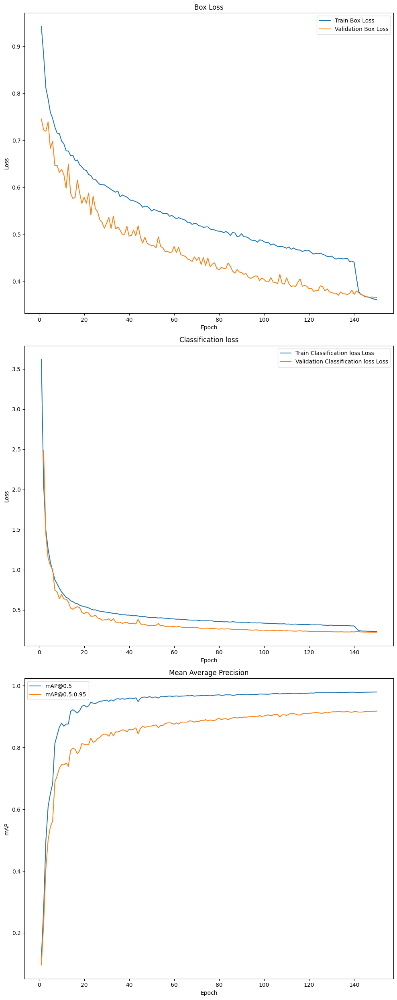

In [11]:
log_path = '/content/results.csv' # здесь нужно указать путь к файлу results.csv из репозитория

# Загрузка данных
df = pd.read_csv(log_path)

# Построение графиков
plt.figure(figsize=(10, 25))

# Loss графики box
plt.subplot(3, 1, 1)
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss')
plt.plot(df['epoch'], df['val/box_loss'], label='Validation Box Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Box Loss')
plt.legend()

# Loss графики cls
plt.subplot(3, 1, 2)
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Classification loss Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Validation Classification loss Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Classification loss')
plt.legend()

# mAP графики
plt.subplot(3, 1, 3)
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@0.5')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Mean Average Precision')
plt.legend()

plt.tight_layout()
plt.show()

Используем обученые веса для проверки обучения на валидационной выборке

In [35]:
model = YOLO('/content/best.pt') # указывается путь к файлу best.pt из репозитория

In [36]:
# Валидация модели на валидационном наборе
metrics = model.val(conf=0.001, data='/content/data.yaml',
            name='plastic_waste_detector_val', plots=True, save=True)


Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/dataset/labels/val.cache... 1177 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1177/1177 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:13<00:00,  5.62it/s]


                   all       1177       6191      0.994       0.95      0.977      0.916
PET (transparent) (green)        666        913      0.999      0.951      0.979      0.923
PET (transparent) (brown)        809       1433      0.996      0.962      0.988       0.93
PET (transparent) (blue)        153        160      0.997      0.956      0.983      0.913
     PET (transparent)        530        724      0.994      0.941      0.978      0.902
PET (transparent) (dark blue)        148        160      0.993      0.927      0.961      0.906
           PET (black)         92         95      0.994      0.947       0.98      0.915
           PET (white)        410        496      0.994      0.946       0.97      0.916
         PET (sticker)         68         71      0.993      0.972      0.986      0.921
          PET (flacon)        110        125      0.998      0.968      0.976      0.921
PET (household chemicals)        353        438      0.995      0.947      0.975      0.928
PND

In [37]:
print("mAP@0.5:0.95:", metrics.box.map)
print("mAP@0.5:", metrics.box.map50)

mAP@0.5:0.95: 0.9156537377943126
mAP@0.5: 0.9767396553229896


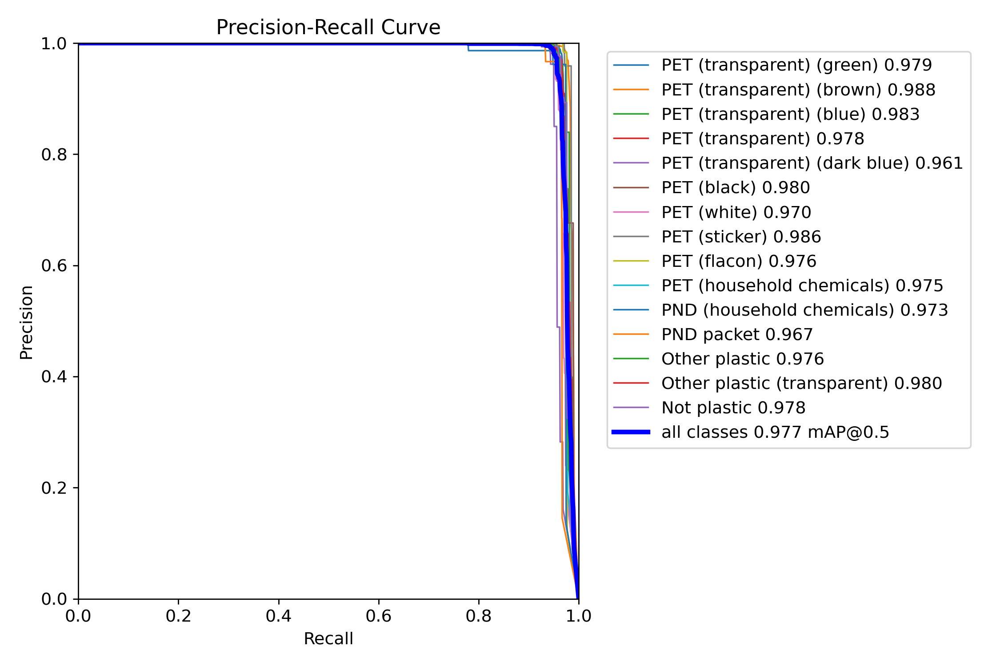

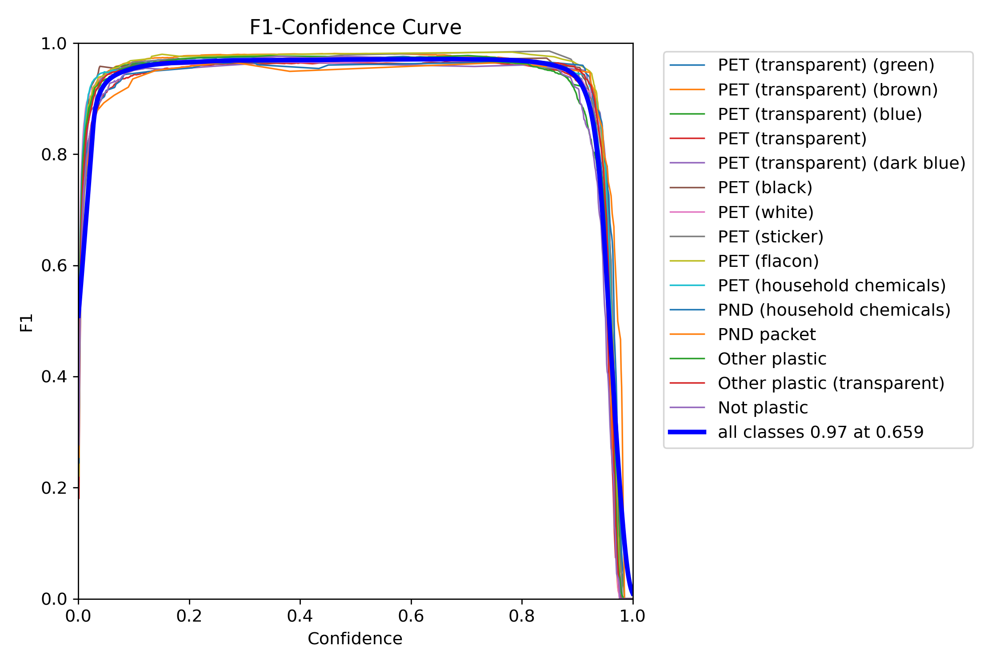

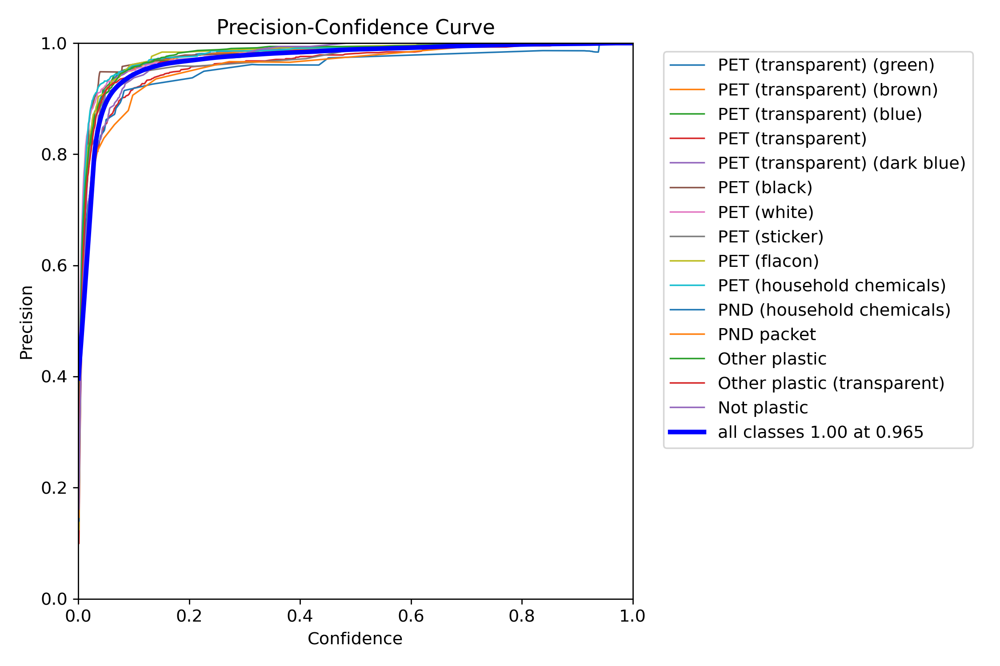

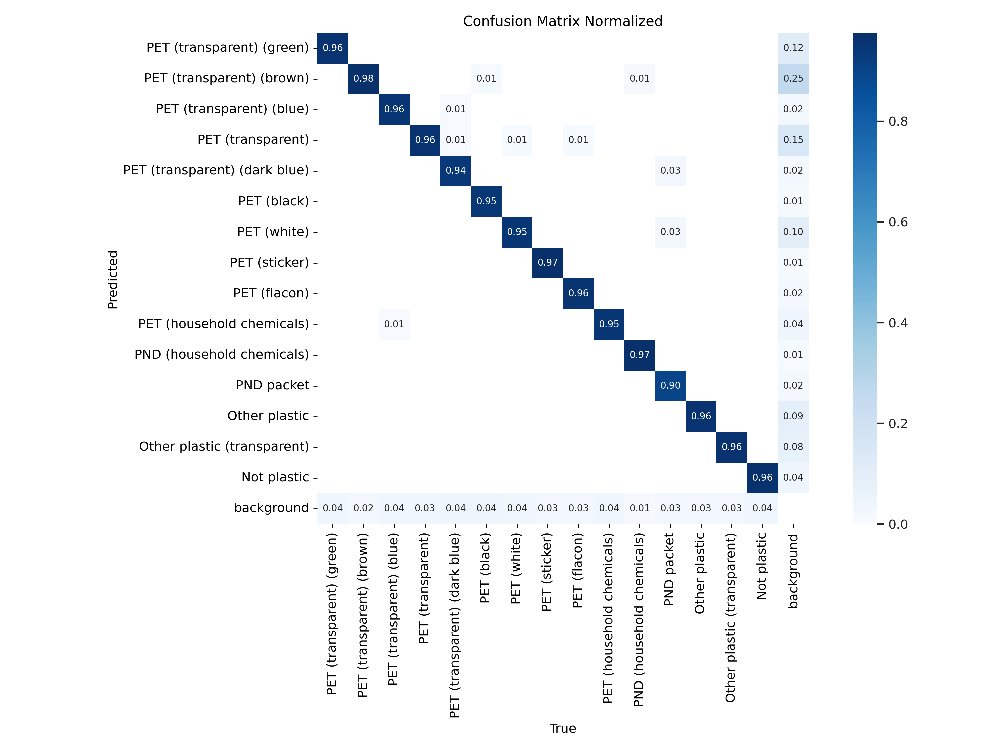

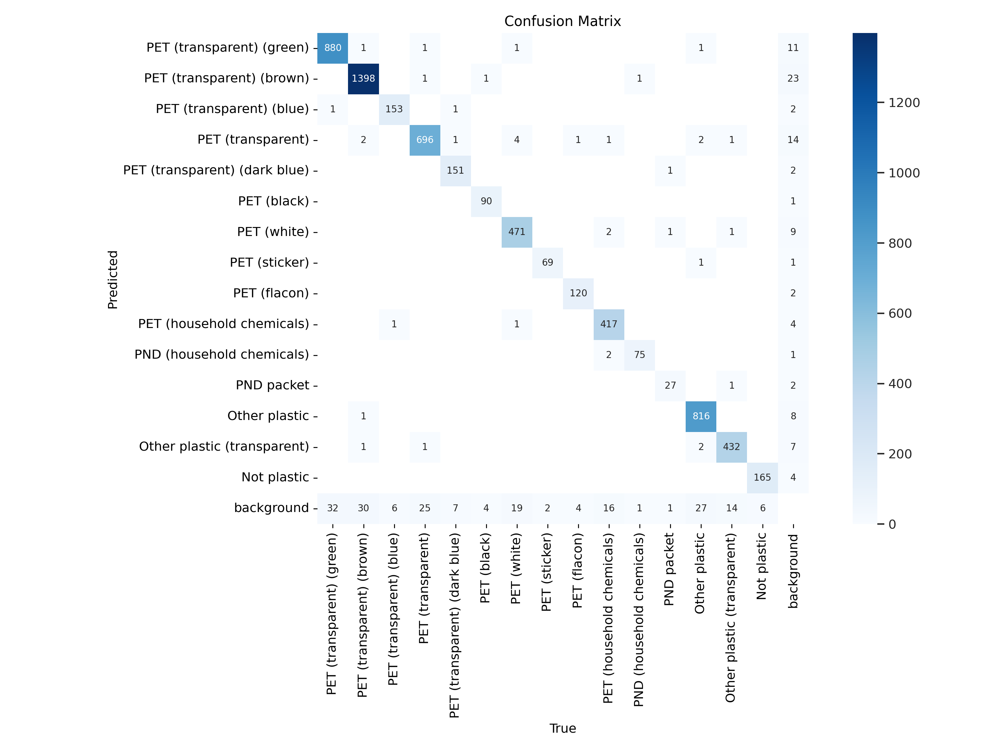

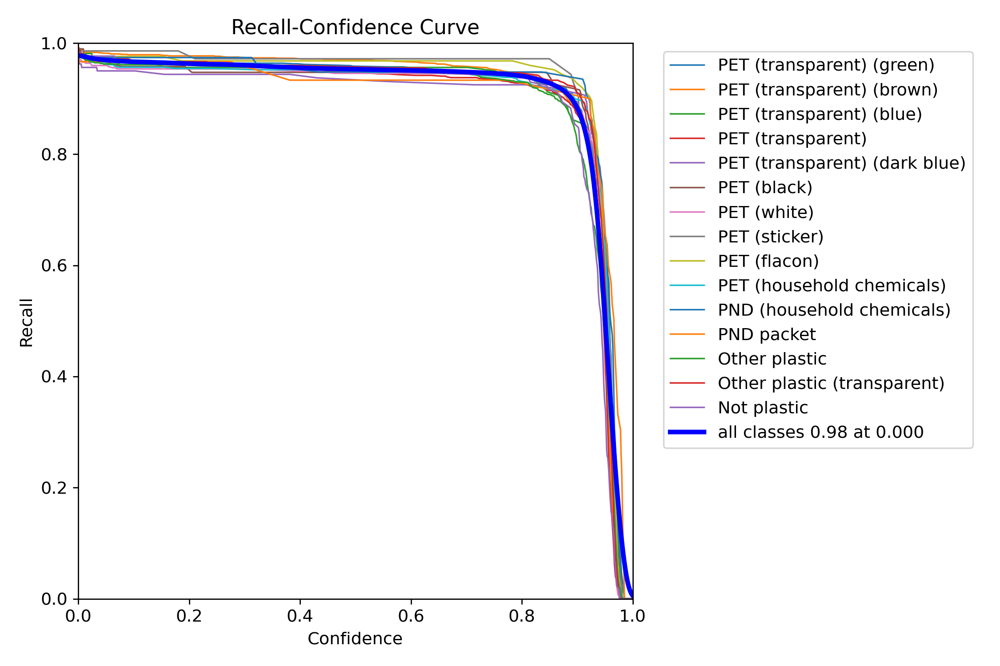

In [38]:
image_paths = glob.glob('/content/runs/detect/plastic_waste_detector_val/*.png')
for img_path in image_paths:
    display(Image(filename=img_path))

**Вывод**<br>
Модель демонстрирует очень хорошие результаты по точности, полноте и стабильности классификации для всех рассматриваемых классов. Такой высокий уровень качества указывает на то, что модель хорошо адаптирована к набору данных и адекватно справляется с классификацией и детекцией различных типов пластиковых отходов.

## Тестирование модели

In [39]:
batch_size = 16

test_image_paths = [os.path.join(images_dir, file_name) for file_name in test_df['file_name']]

submission = []

# Проходим по тестовым изображениям батчами
for i in tqdm(range(0, len(test_image_paths), batch_size), desc='Формирование предсказаний'):
    batch_paths = test_image_paths[i:i+batch_size]
    batch_files = test_df['file_name'].iloc[i:i+batch_size].tolist()

    # Запуск предсказаний на текущем батче
    results = model.predict(batch_paths, imgsz=800, conf=0.0001, save=True, save_txt=True)

    # Обработка результатов предсказаний
    for j, result in enumerate(results):
        file_name = batch_files[j]
        bboxes = []

        if result.boxes is not None and len(result.boxes) > 0:
            for box in result.boxes:
                x1, y1, x2, y2 = box.xyxy[0].tolist()
                confidence = float(box.conf[0])
                category_id = int(box.cls[0]) + 1

                x_left = x1
                y_top = y1
                width = x2 - x1
                height = y2 - y1
                bbox = [category_id, confidence, x_left, y_top, width, height]
                bboxes.append(bbox)
        else:
            bboxes = []

        submission.append({'file_name': file_name, 'bbox': bboxes})

    # Очищаем память после обработки батча
    del results
    gc.collect()


submission_df = pd.DataFrame(submission)
submission_df.to_csv('submission.csv', index=False)
print("Файл submission.csv успешно создан.")

Формирование предсказаний:   0%|          | 0/188 [00:00<?, ?it/s]


0: 608x800 19 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 34 PET (transparent)s, 15 PET (white)s, 4 PET (household chemicals)s, 49 Other plastics, 1 Other plastic (transparent), 5.5ms
1: 608x800 10 PET (transparent) (green)s, 1 PET (transparent) (brown), 29 PET (transparent)s, 35 PET (white)s, 6 PET (household chemicals)s, 33 Other plastics, 5.5ms
2: 608x800 19 PET (transparent) (green)s, 1 PET (transparent) (brown), 45 PET (transparent)s, 1 PET (transparent) (dark blue), 26 PET (white)s, 2 PET (household chemicals)s, 19 Other plastics, 5.5ms
3: 608x800 6 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 53 PET (transparent)s, 4 PET (white)s, 7 PET (household chemicals)s, 15 Other plastics, 5.5ms
4: 608x800 23 PET (transparent) (green)s, 41 PET (transparent) (brown)s, 4 PET (transparent)s, 1 PET (transparent) (dark blue), 7 PET (white)s, 11 PET (household chemicals)s, 20 Other plastics, 5.5ms
5: 608x800 4 PET (transparent) (green)s, 36 PET (transparent) (brown)s,

Формирование предсказаний:   1%|          | 1/188 [00:04<12:50,  4.12s/it]


0: 608x800 16 PET (transparent) (green)s, 66 PET (transparent) (brown)s, 7 PET (transparent)s, 2 PET (household chemicals)s, 12 Other plastics, 5.4ms
1: 608x800 25 PET (transparent) (brown)s, 26 PET (transparent)s, 13 PET (transparent) (dark blue)s, 3 PET (white)s, 22 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 28 PET (transparent) (brown)s, 59 PET (transparent)s, 8 PET (white)s, 7 Other plastics, 5.4ms
3: 608x800 2 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 67 PET (transparent)s, 1 PET (white), 2 Other plastics, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 99 PET (transparent)s, 1 PET (white), 2 Other plastics, 5.4ms
5: 608x800 1 PET (transparent) (green), 14 PET (transparent) (brown)s, 64 PET (transparent)s, 1 PET (transparent) (dark blue), 10 PET (white)s, 6 Other plastics, 5.4ms
6: 608x800 7 PET (transparent) (brown)s, 12 PET (transparent)s, 5 PET (white)s, 53 Other plastics, 5.4ms
7: 608x800 23 PET (transparent) (green)s, 5 PET 

Формирование предсказаний:   1%|          | 2/188 [00:07<11:31,  3.72s/it]


0: 608x800 15 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 21 PET (white)s, 21 PET (flacon)s, 13 PET (household chemicals)s, 6 Other plastics, 10 Other plastic (transparent)s, 8 Not plastics, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 57 PET (transparent)s, 3 PET (white)s, 22 PET (flacon)s, 33 Other plastics, 2 Other plastic (transparent)s, 9 Not plastics, 5.4ms
2: 608x800 2 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 30 PET (transparent)s, 2 PET (white)s, 46 PET (flacon)s, 1 PET (household chemicals), 12 Other plastics, 1 Other plastic (transparent), 6 Not plastics, 5.4ms
3: 608x800 3 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 17 PET (transparent)s, 68 PET (flacon)s, 3 Other plastics, 27 Other plastic (transparent)s, 10 Not plastics, 5.4ms
4: 608x800 6 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 10 PET (transparent)s, 1 PET (white), 34 PET (flacon)s, 1 PND (household chemicals), 7 Other plast

Формирование предсказаний:   2%|▏         | 3/188 [00:11<11:36,  3.77s/it]


0: 608x800 1 PET (transparent) (green), 60 PET (transparent)s, 23 PET (white)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 7 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 1 PET (transparent) (green), 41 PET (transparent)s, 1 PET (transparent) (dark blue), 33 PET (white)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 12 Other plastics, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 55 PET (transparent)s, 1 PET (transparent) (dark blue), 18 PET (white)s, 3 PET (household chemicals)s, 1 PND (household chemicals), 14 Other plastics, 1 Other plastic (transparent), 3 Not plastics, 5.4ms
3: 608x800 12 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 26 PET (transparent)s, 6 PET (transparent) (dark blue)s, 15 PET (white)s, 1 PET (household chemicals), 17 Other plastics, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 46 PET (transparent)s, 1 PET (transparent) (da

Формирование предсказаний:   2%|▏         | 4/188 [00:14<11:04,  3.61s/it]


0: 608x800 4 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 69 PET (transparent)s, 34 PET (white)s, 8 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 7 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 39 PET (transparent)s, 1 PET (transparent) (dark blue), 32 PET (white)s, 17 Other plastics, 5.4ms
2: 608x800 21 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 15 PET (transparent)s, 1 PET (transparent) (dark blue), 15 PET (white)s, 27 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 28 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 17 PET (transparent)s, 11 PET (white)s, 2 PET (flacon)s, 12 PET (household chemicals)s, 18 Other plastics, 5.4ms
4: 608x800 23 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 1 PET (transparent) (blue), 27 PET (transparent)s, 10 PET (white)s, 4 PET (household chemicals)s, 17 Other plastics, 5.4ms
5: 608x800 18 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 41 PET (transparent)s, 3 P

Формирование предсказаний:   3%|▎         | 5/188 [00:17<10:33,  3.46s/it]


0: 608x800 22 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 23 PET (transparent)s, 2 PET (transparent) (dark blue)s, 17 PET (white)s, 1 PET (household chemicals), 2 Other plastics, 14 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 13 PET (transparent) (green)s, 49 PET (transparent) (brown)s, 9 PET (transparent)s, 2 PET (transparent) (dark blue)s, 14 PET (white)s, 15 Other plastics, 5.4ms
2: 608x800 1 PET (transparent) (green), 1 PET (transparent) (brown), 11 PET (transparent)s, 1 PET (transparent) (dark blue), 72 PET (white)s, 10 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 15 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 39 PET (transparent)s, 28 PET (white)s, 1 PET (household chemicals), 24 Other plastics, 5.4ms
4: 608x800 14 PET (transparent) (green)s, 77 PET (transparent) (brown)s, 6 PET (transparent)s, 20 PET (white)s, 15 Other plastics, 5.4ms
5: 608x800 33 PET (transparent) (green)s, 71 PET 

Формирование предсказаний:   3%|▎         | 6/188 [00:21<10:43,  3.54s/it]


0: 608x800 41 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 20 PET (transparent) (blue)s, 15 PET (transparent)s, 36 PET (white)s, 1 PET (household chemicals), 8 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 37 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 5 PET (transparent)s, 32 PET (white)s, 1 PET (household chemicals), 13 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 35 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 1 PET (transparent), 41 PET (white)s, 2 PET (household chemicals)s, 7 Other plastics, 5.4ms
3: 608x800 6 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 1 PET (transparent) (blue), 2 PET (transparent)s, 1 PET (transparent) (dark blue), 84 PET (white)s, 2 PET (household chemicals)s, 3 Other plastics, 5.4ms
4: 608x800 6 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 15 PET (transparent)s, 2 PET (transparent) (dark blue)s, 34 PET (white)s, 2 PET (household chemicals)s, 

Формирование предсказаний:   4%|▎         | 7/188 [00:24<10:22,  3.44s/it]


0: 608x800 14 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 16 PET (white)s, 3 PET (sticker)s, 1 PET (flacon), 8 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 23 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 3 PET (transparent)s, 8 PET (white)s, 1 PET (flacon), 3 PET (household chemicals)s, 5 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 12 PET (white)s, 1 PET (flacon), 1 PET (household chemicals), 9 Other plastics, 1 Other plastic (transparent), 3 Not plastics, 5.4ms
3: 608x800 4 PET (transparent) (green)s, 42 PET (transparent) (brown)s, 3 PET (transparent)s, 8 PET (white)s, 2 PET (flacon)s, 2 Other plastics, 5 Not plastics, 5.4ms
4: 608x800 5 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 3 PET (transparent)s, 6 PET (white)s, 1 PET (flacon), 2 Other plastics, 1 Other plastic (transparent), 42 Not plastics, 5.4ms
5: 608x800 8 PET (transparent) (green)s, 

Формирование предсказаний:   4%|▍         | 8/188 [00:28<10:11,  3.40s/it]


0: 608x800 14 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 19 PET (transparent)s, 7 PET (white)s, 9 PET (flacon)s, 1 PET (household chemicals), 17 Other plastics, 25 Other plastic (transparent)s, 5.4ms
1: 608x800 27 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 19 PET (transparent)s, 11 PET (white)s, 9 PET (flacon)s, 1 PET (household chemicals), 24 Other plastics, 17 Other plastic (transparent)s, 5.4ms
2: 608x800 9 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 3 PET (transparent)s, 35 PET (white)s, 18 PET (flacon)s, 1 PET (household chemicals), 10 Other plastics, 25 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 34 PET (transparent) (green)s, 34 PET (transparent) (brown)s, 16 PET (transparent)s, 1 PET (transparent) (dark blue), 3 PET (black)s, 1 PET (white), 22 PET (flacon)s, 9 Other plastics, 21 Other plastic (transparent)s, 1 Not plastic, 5.4ms
4: 608x800 9 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 19 PET (transp

Формирование предсказаний:   5%|▍         | 9/188 [00:31<10:23,  3.48s/it]


0: 608x800 37 PET (transparent) (green)s, 24 PET (transparent) (brown)s, 5 PET (transparent)s, 1 PET (black), 22 PET (white)s, 1 PET (household chemicals), 17 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
1: 608x800 27 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 9 PET (transparent)s, 2 PET (transparent) (dark blue)s, 1 PET (black), 33 PET (white)s, 2 PET (household chemicals)s, 12 Other plastics, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 13 PET (transparent)s, 77 PET (white)s, 1 PET (flacon), 2 PET (household chemicals)s, 10 Other plastics, 5.4ms
3: 608x800 1 PET (transparent) (green), 11 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 40 PET (transparent)s, 2 PET (white)s, 24 PET (household chemicals)s, 8 Other plastics, 3 Other plastic (transparent)s, 6 Not plastics, 5.4ms
4: 608x800 4 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 6 PET (transparent)s, 56 PET (

Формирование предсказаний:   5%|▌         | 10/188 [00:35<10:09,  3.42s/it]


0: 608x800 29 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (transparent) (dark blue), 1 PET (black), 13 PET (white)s, 29 PET (household chemicals)s, 1 PND packet, 11 Other plastics, 4 Not plastics, 5.4ms
1: 608x800 21 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 1 PET (transparent), 2 PET (black)s, 12 PET (white)s, 40 PET (household chemicals)s, 12 Other plastics, 3 Not plastics, 5.4ms
2: 608x800 17 PET (transparent) (green)s, 43 PET (transparent) (brown)s, 2 PET (transparent)s, 14 PET (white)s, 18 PET (household chemicals)s, 18 Other plastics, 2 Other plastic (transparent)s, 2 Not plastics, 5.4ms
3: 608x800 12 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 14 PET (transparent)s, 2 PET (transparent) (dark blue)s, 19 PET (white)s, 5 PET (household chemicals)s, 40 Other plastics, 6 Not plastics, 5.4ms
4: 608x800 29 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 16 PET (transparent)s, 4 PET (white)s, 8 PET (hou

Формирование предсказаний:   6%|▌         | 11/188 [00:38<10:21,  3.51s/it]


0: 608x800 42 PET (transparent) (green)s, 3 PET (transparent)s, 1 PET (black), 1 PET (white), 1 PND (household chemicals), 21 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 40 PET (transparent) (green)s, 1 PND (household chemicals), 7 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 84 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 2 PET (transparent)s, 3 PET (white)s, 1 PET (sticker), 2 PET (household chemicals)s, 3 PND (household chemicals)s, 6 Other plastics, 5.4ms
3: 608x800 92 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 1 PET (transparent), 2 PET (white)s, 1 PND (household chemicals), 9 Other plastics, 5.4ms
4: 608x800 44 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 1 PET (transparent), 3 PET (white)s, 1 PET (household chemicals), 5 PND (household chemicals)s, 12 Other plastics, 5.4ms
5: 608x800 1 PET (transparent) (green), 7 PET (transparent) (brown)s, 26 PET (transparent)s, 25 PET (white)s, 1 PND (household chemicals), 15 Other plastics,

Формирование предсказаний:   6%|▋         | 12/188 [00:42<10:04,  3.43s/it]


0: 608x800 23 PET (transparent) (green)s, 52 PET (transparent) (brown)s, 4 PET (transparent)s, 2 PET (transparent) (dark blue)s, 1 PET (black), 12 PET (white)s, 1 PET (household chemicals), 1 PND (household chemicals), 26 Other plastics, 5.4ms
1: 608x800 11 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (transparent) (dark blue), 1 PET (black), 38 PET (white)s, 13 Other plastics, 5.4ms
2: 608x800 10 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 2 PET (transparent)s, 1 PET (transparent) (dark blue), 41 PET (white)s, 6 PET (household chemicals)s, 7 Other plastics, 5.4ms
3: 608x800 16 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 32 PET (transparent)s, 3 PET (transparent) (dark blue)s, 25 PET (white)s, 2 PET (household chemicals)s, 28 Other plastics, 5.4ms
4: 608x800 13 PET (transparent) (green)s, 1 PET (transparent) (brown), 30 PET (transparent)s, 5 PET (transparent) (dark blue)s, 15 PET (white)s, 3 PET (household chemicals

Формирование предсказаний:   7%|▋         | 13/188 [00:45<09:59,  3.42s/it]


0: 608x800 4 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 12 PET (transparent)s, 2 PET (white)s, 89 PET (flacon)s, 2 PET (household chemicals)s, 21 Other plastics, 10 Not plastics, 5.4ms
1: 608x800 3 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 12 PET (transparent)s, 1 PET (transparent) (dark blue), 68 PET (flacon)s, 5 PET (household chemicals)s, 18 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 5 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 7 PET (transparent)s, 10 PET (white)s, 10 PET (flacon)s, 20 PET (household chemicals)s, 2 PND (household chemicals)s, 29 Other plastics, 5.4ms
3: 608x800 2 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 1 PET (transparent) (dark blue), 3 PET (flacon)s, 66 PET (household chemicals)s, 1 PND (household chemicals), 21 Other plastics, 5.4ms
4: 608x800 1 PET (transparent) (green), 4 PET (transparent) (brown)s, 3 PET (transparent)s, 16 PET (white)s, 3 PET (flacon)s, 44 PET (household chemicals)s, 1 PND

Формирование предсказаний:   7%|▋         | 14/188 [00:49<10:07,  3.49s/it]


0: 608x800 23 PET (transparent) (green)s, 72 PET (transparent) (brown)s, 1 PET (transparent), 25 PET (white)s, 22 Other plastics, 4 Not plastics, 5.4ms
1: 608x800 21 PET (transparent) (green)s, 59 PET (transparent) (brown)s, 2 PET (transparent)s, 23 PET (white)s, 1 PET (household chemicals), 21 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 20 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 66 PET (transparent)s, 3 PET (transparent) (dark blue)s, 1 PET (white), 1 PET (household chemicals), 18 Other plastics, 2 Not plastics, 5.4ms
3: 608x800 2 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 36 PET (transparent)s, 1 PET (transparent) (dark blue), 27 PET (white)s, 1 PET (household chemicals), 27 Other plastics, 5.4ms
4: 608x800 1 PET (transparent) (green), 29 PET (transparent) (brown)s, 20 PET (transparent)s, 4 PET (transparent) (dark blue)s, 33 PET (white)s, 1 PET (household chemicals), 2 PND (household chemicals)s, 18 O

Формирование предсказаний:   8%|▊         | 15/188 [00:52<09:49,  3.41s/it]


0: 608x800 2 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (black), 14 PET (white)s, 20 PET (household chemicals)s, 14 Other plastics, 10 Not plastics, 5.4ms
1: 608x800 18 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (black), 1 PET (white), 3 PET (sticker)s, 5 PET (flacon)s, 26 PET (household chemicals)s, 15 Other plastics, 14 Not plastics, 5.4ms
2: 608x800 9 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 8 PET (transparent)s, 21 PET (black)s, 2 PET (white)s, 10 PET (flacon)s, 24 PET (household chemicals)s, 31 Other plastics, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 2 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 4 PET (transparent)s, 40 PET (black)s, 2 PET (white)s, 1 PET (flacon), 16 PET (household chemicals)s, 9 Other plastics, 10 Other plastic (transparent)s, 34 Not plastics, 5.4ms
4: 608x800 9 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 2 PET (transparent)

Формирование предсказаний:   9%|▊         | 16/188 [00:55<09:36,  3.35s/it]


0: 608x800 31 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 5 PET (transparent)s, 3 PET (household chemicals)s, 2 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 8 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 1 PET (transparent) (blue), 3 PET (transparent)s, 3 PET (white)s, 1 PET (household chemicals), 2 Other plastics, 18 Not plastics, 5.4ms
2: 608x800 12 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 3 PET (transparent)s, 1 PET (black), 1 PET (white), 2 PET (flacon)s, 5 Other plastics, 13 Not plastics, 5.4ms
3: 608x800 10 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 5 PET (transparent) (blue)s, 6 PET (transparent)s, 1 PET (transparent) (dark blue), 2 PET (black)s, 2 PET (household chemicals)s, 9 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 80 PET (transparent) (brown)s, 1 PET (transparent) (blue), 10 PET (tra

Формирование предсказаний:   9%|▉         | 17/188 [00:58<09:24,  3.30s/it]


0: 608x800 35 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 4 PET (transparent)s, 1 PET (white), 5 PET (household chemicals)s, 10 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 34 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 1 PET (transparent) (blue), 4 PET (transparent)s, 2 PET (white)s, 3 PET (household chemicals)s, 21 Other plastics, 1 Other plastic (transparent), 3 Not plastics, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 2 PET (transparent)s, 17 PET (white)s, 1 PET (household chemicals), 1 PND packet, 33 Other plastics, 12 Not plastics, 5.4ms
3: 608x800 19 PET (transparent) (brown)s, 3 PET (transparent)s, 13 PET (white)s, 5 PET (household chemicals)s, 45 Other plastics, 25 Not plastics, 5.4ms
4: 608x800 3 PET (transparent) (green)s, 61 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (white), 8 PET (household chemicals)s, 11 Other plastics, 1 Not plastic, 5.4ms
5: 608x800 48 PET (transparent) (brown)s, 2 PET (tran

Формирование предсказаний:  10%|▉         | 18/188 [01:01<09:10,  3.24s/it]


0: 608x800 40 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 18 PET (transparent) (blue)s, 6 PET (white)s, 5 PET (household chemicals)s, 8 Other plastics, 5.4ms
1: 608x800 18 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 29 PET (transparent) (blue)s, 16 PET (transparent)s, 17 PET (white)s, 3 PET (household chemicals)s, 13 Other plastics, 5.4ms
2: 608x800 11 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 7 PET (transparent)s, 41 PET (white)s, 12 Other plastics, 5.4ms
3: 608x800 2 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 6 PET (transparent)s, 27 PET (white)s, 4 PET (flacon)s, 7 PET (household chemicals)s, 35 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 23 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 32 PET (transparent)s, 14 PET (white)s, 5 PET (sticker)s, 18 PET (flacon)s, 1 PET (household chemicals), 13 Other plastics, 5.4ms
5: 608x800 26 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 19

Формирование предсказаний:  10%|█         | 19/188 [01:05<09:21,  3.32s/it]


0: 608x800 58 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 14 PET (transparent)s, 7 PET (black)s, 7 PET (white)s, 3 PET (sticker)s, 16 Other plastics, 4 Other plastic (transparent)s, 5.4ms
1: 608x800 35 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 16 PET (transparent)s, 13 PET (white)s, 5 PET (sticker)s, 29 Other plastics, 19 Other plastic (transparent)s, 5.4ms
2: 608x800 39 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 29 PET (transparent)s, 1 PET (white), 2 PET (sticker)s, 2 PET (household chemicals)s, 19 Other plastics, 6 Other plastic (transparent)s, 5.4ms
3: 608x800 54 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 9 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (white), 2 PET (sticker)s, 9 PET (household chemicals)s, 14 Other plastics, 5.4ms
4: 608x800 49 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 8 PET (transparent)s, 4 PET (white)s, 3 PET 

Формирование предсказаний:  11%|█         | 20/188 [01:08<09:22,  3.35s/it]


0: 608x800 31 PET (transparent) (green)s, 66 PET (transparent) (brown)s, 1 PET (transparent) (blue), 13 PET (transparent)s, 1 PET (transparent) (dark blue), 4 PET (black)s, 16 PET (white)s, 2 PET (flacon)s, 4 PET (household chemicals)s, 24 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
1: 608x800 54 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (transparent) (dark blue), 1 PET (black), 4 PET (white)s, 2 PET (household chemicals)s, 33 Other plastics, 5.4ms
2: 608x800 21 PET (transparent) (green)s, 56 PET (transparent) (brown)s, 1 PET (transparent) (dark blue), 3 PET (household chemicals)s, 1 PND packet, 14 Other plastics, 1 Not plastic, 5.4ms
3: 608x800 16 PET (transparent) (green)s, 65 PET (transparent) (brown)s, 1 PET (transparent) (blue), 8 PET (transparent) (dark blue)s, 3 PET (black)s, 4 PET (household chemicals)s, 29 Other plastics, 6 Not plastics, 5.4ms
4: 608x800 2 PET (transparent) (green)s, 62 PET (transparent) (bro

Формирование предсказаний:  11%|█         | 21/188 [01:12<09:28,  3.41s/it]


0: 608x800 20 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 30 PET (transparent)s, 13 PET (white)s, 2 PET (sticker)s, 5 PET (household chemicals)s, 15 Other plastics, 5.4ms
1: 608x800 24 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 22 PET (transparent)s, 3 PET (transparent) (dark blue)s, 2 PET (black)s, 18 PET (white)s, 4 PET (sticker)s, 1 PET (flacon), 1 PET (household chemicals), 15 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 25 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 20 PET (transparent)s, 5 PET (transparent) (dark blue)s, 4 PET (black)s, 12 PET (white)s, 2 PET (sticker)s, 8 PET (flacon)s, 9 Other plastics, 5.4ms
3: 608x800 8 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 19 PET (transparent)s, 1 PET (transparent) (dark blue), 10 PET (white)s, 3 PET (household chemicals)s, 9 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 12 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 26 PET 

Формирование предсказаний:  12%|█▏        | 22/188 [01:15<09:29,  3.43s/it]


0: 608x800 31 PET (transparent) (green)s, 35 PET (transparent) (brown)s, 4 PET (transparent)s, 5 Other plastics, 5.4ms
1: 608x800 43 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 2 PET (transparent)s, 14 PET (white)s, 23 Other plastics, 5.4ms
2: 608x800 16 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 17 PET (transparent)s, 13 PET (white)s, 54 Other plastics, 5.4ms
3: 608x800 4 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 34 PET (transparent)s, 3 PET (white)s, 42 Other plastics, 5.4ms
4: 608x800 21 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 15 PET (transparent)s, 2 PET (white)s, 15 Other plastics, 5.4ms
5: 608x800 22 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 14 PET (transparent)s, 1 PET (black), 8 PET (white)s, 1 PET (household chemicals), 16 Other plastics, 5.4ms
6: 608x800 21 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 13 PET (transparent)s, 3 PET (black)s, 2 PET (white

Формирование предсказаний:  12%|█▏        | 23/188 [01:19<09:14,  3.36s/it]


0: 608x800 14 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 26 PET (transparent)s, 45 PET (white)s, 18 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 12 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 26 PET (transparent)s, 33 PET (white)s, 17 Other plastics, 5.4ms
2: 608x800 6 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 35 PET (transparent)s, 28 PET (white)s, 14 Other plastics, 5.4ms
3: 608x800 3 PET (transparent) (green)s, 36 PET (transparent) (brown)s, 22 PET (transparent)s, 39 PET (white)s, 1 PET (household chemicals), 13 Other plastics, 2 Not plastics, 5.4ms
4: 608x800 22 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 35 PET (transparent)s, 21 PET (white)s, 10 Other plastics, 3 Not plastics, 5.4ms
5: 608x800 24 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 31 PET (transparent)s, 15 PET (white)s, 2 PET (household chemicals)s, 19 Other plastics, 2 Not plastics, 5.4ms
6: 608x800 37 PET (transparent) (gree

Формирование предсказаний:  13%|█▎        | 24/188 [01:22<09:10,  3.36s/it]


0: 608x800 28 PET (transparent) (green)s, 41 PET (transparent) (brown)s, 15 PET (transparent) (blue)s, 22 PET (transparent)s, 1 PET (white), 1 PET (household chemicals), 7 Other plastics, 2 Other plastic (transparent)s, 5.4ms
1: 608x800 3 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 1 PET (transparent) (blue), 49 PET (transparent)s, 28 PET (white)s, 1 PET (household chemicals), 8 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 1 PET (transparent) (brown), 48 PET (transparent)s, 22 PET (white)s, 26 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 10 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 61 PET (transparent)s, 9 PET (white)s, 17 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 4 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 55 PET (transparent)s, 1 PET (transparent) (dark blue), 21 PET (white)s, 29 Other plastics, 3 Other plastic (transp

Формирование предсказаний:  13%|█▎        | 25/188 [01:25<09:13,  3.39s/it]


0: 608x800 68 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 9 PET (transparent)s, 5 PET (white)s, 20 Other plastics, 5.4ms
1: 608x800 12 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 1 PET (transparent) (blue), 14 PET (transparent)s, 1 PET (transparent) (dark blue), 21 PET (white)s, 3 PND (household chemicals)s, 25 Other plastics, 1 Other plastic (transparent), 8 Not plastics, 5.4ms
2: 608x800 3 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 49 PET (transparent)s, 27 PET (white)s, 2 PET (household chemicals)s, 4 PND (household chemicals)s, 23 Other plastics, 5.4ms
3: 608x800 7 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 38 PET (transparent)s, 24 PET (white)s, 1 PET (household chemicals), 21 Other plastics, 5.4ms
4: 608x800 13 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 1 PET (transparent) (blue), 50 PET (transparent)s, 1 PET (black), 19 PET (white)s, 1 PET (sticker), 1 PET (household chemic

Формирование предсказаний:  14%|█▍        | 26/188 [01:29<09:27,  3.50s/it]


0: 608x800 6 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 21 PET (white)s, 4 PET (household chemicals)s, 43 Other plastics, 29 Other plastic (transparent)s, 47 Not plastics, 5.4ms
1: 608x800 39 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 15 PET (transparent)s, 7 PET (white)s, 1 PET (sticker), 5 Other plastics, 36 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 49 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 18 PET (transparent) (blue)s, 4 PET (transparent)s, 1 PET (transparent) (dark blue), 6 PET (white)s, 5 PET (household chemicals)s, 25 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 54 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 1 PET (transparent) (blue), 18 PET (transparent)s, 9 PET (transparent) (dark blue)s, 3 PET (white)s, 19 Other plastics, 10 Other plastic (transparent)s, 4 Not plastics, 5.4ms
4: 608x800 57 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 1 PET (tr

Формирование предсказаний:  14%|█▍        | 27/188 [01:33<09:42,  3.62s/it]


0: 608x800 38 PET (transparent) (green)s, 43 PET (transparent) (brown)s, 1 PET (transparent) (dark blue), 2 PET (flacon)s, 3 PET (household chemicals)s, 1 PND (household chemicals), 7 Other plastics, 5.4ms
1: 608x800 49 PET (transparent) (green)s, 75 PET (transparent) (brown)s, 5 PET (transparent)s, 2 PET (transparent) (dark blue)s, 1 PET (white), 2 PET (flacon)s, 8 PET (household chemicals)s, 2 PND (household chemicals)s, 4 Other plastics, 5.4ms
2: 608x800 48 PET (transparent) (green)s, 50 PET (transparent) (brown)s, 3 PET (transparent)s, 1 PET (transparent) (dark blue), 6 PET (white)s, 3 PET (flacon)s, 1 PET (household chemicals), 2 PND (household chemicals)s, 4 Other plastics, 5.4ms
3: 608x800 67 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 2 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (flacon), 2 PND (household chemicals)s, 3 Other plastics, 13 Other plastic (transparent)s, 5.4ms
4: 608x800 47 PET (transparent) (green)s, 47 PET (transparent) (brown)s, 

Формирование предсказаний:  15%|█▍        | 28/188 [01:37<09:46,  3.67s/it]


0: 608x800 3 PET (transparent) (green)s, 1 PET (transparent) (brown), 37 PET (transparent)s, 2 PET (black)s, 23 PET (white)s, 1 PET (household chemicals), 13 Other plastics, 5.4ms
1: 608x800 3 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 34 PET (transparent)s, 23 PET (white)s, 2 Other plastics, 5.4ms
2: 608x800 3 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 44 PET (transparent)s, 12 PET (white)s, 2 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 13 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 21 PET (transparent) (blue)s, 42 PET (transparent)s, 1 PET (white), 9 Other plastics, 5.4ms
4: 608x800 13 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 6 PET (transparent) (blue)s, 17 PET (transparent)s, 2 PET (white)s, 1 PET (household chemicals), 23 Other plastics, 35 Other plastic (transparent)s, 5.4ms
5: 608x800 61 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 24 PET (transparent)s, 1 PET (black), 2 PET (white)s,

Формирование предсказаний:  15%|█▌        | 29/188 [01:40<09:14,  3.49s/it]


0: 608x800 17 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 1 PET (black), 4 PET (white)s, 6 PET (household chemicals)s, 22 Other plastics, 16 Not plastics, 5.4ms
1: 608x800 19 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 1 PET (black), 1 PET (white), 14 PET (household chemicals)s, 1 PND (household chemicals), 8 Other plastics, 6 Other plastic (transparent)s, 24 Not plastics, 5.4ms
2: 608x800 33 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 1 PET (transparent) (blue), 5 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 4 PET (flacon)s, 10 PET (household chemicals)s, 1 PND (household chemicals), 21 Other plastics, 1 Other plastic (transparent), 2 Not plastics, 5.4ms
3: 608x800 52 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 36 PET (transparent)s, 15 PET (black)s, 2 PET (white)s, 6 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 32 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 22 PET (tra

Формирование предсказаний:  16%|█▌        | 30/188 [01:43<09:11,  3.49s/it]


0: 608x800 30 PET (transparent) (green)s, 73 PET (transparent) (brown)s, 3 PET (transparent)s, 8 Other plastics, 5.4ms
1: 608x800 27 PET (transparent) (green)s, 121 PET (transparent) (brown)s, 2 PET (transparent)s, 1 PET (transparent) (dark blue), 3 PET (white)s, 6 Other plastics, 5.4ms
2: 608x800 35 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 1 PET (transparent), 10 PET (white)s, 1 PET (household chemicals), 6 Other plastics, 5.4ms
3: 608x800 33 PET (transparent) (green)s, 54 PET (transparent) (brown)s, 10 PET (transparent)s, 10 PET (white)s, 3 PET (household chemicals)s, 12 Other plastics, 5.4ms
4: 608x800 36 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 11 PET (transparent)s, 12 PET (white)s, 3 PET (household chemicals)s, 2 Other plastics, 5.4ms
5: 608x800 11 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 68 PET (transparent)s, 7 PET (white)s, 3 PET (household chemicals)s, 9 Other plastics, 1 Not plastic, 5.4ms
6: 608x800 17 PET (transparent) 

Формирование предсказаний:  16%|█▋        | 31/188 [01:47<09:07,  3.49s/it]


0: 608x800 35 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 15 PET (transparent)s, 11 PET (white)s, 1 PET (household chemicals), 43 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 44 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 8 PET (white)s, 16 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 40 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 8 PET (transparent)s, 3 PET (transparent) (dark blue)s, 1 PET (black), 7 PET (white)s, 1 PET (household chemicals), 8 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 20 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 2 PET (transparent)s, 6 PET (black)s, 10 PET (white)s, 8 PET (household chemicals)s, 5 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 17 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 2 PET (transparent)s, 13 PET (white)s, 20 Other plastics, 7 Other plastic (transpar

Формирование предсказаний:  17%|█▋        | 32/188 [01:50<08:43,  3.36s/it]


0: 608x800 20 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 44 PET (transparent)s, 2 PET (transparent) (dark blue)s, 12 PET (white)s, 3 PET (household chemicals)s, 34 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 22 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 47 PET (transparent)s, 1 PET (transparent) (dark blue), 19 PET (white)s, 1 PET (flacon), 3 PET (household chemicals)s, 26 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 34 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 21 PET (transparent)s, 9 PET (transparent) (dark blue)s, 7 PET (white)s, 1 PET (flacon), 4 PET (household chemicals)s, 18 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 17 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 22 PET (transparent)s, 14 PET (white)s, 1 PET (household chemicals), 40 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 2 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 5 PET (transparent)s

Формирование предсказаний:  18%|█▊        | 33/188 [01:53<08:38,  3.34s/it]


0: 608x800 8 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 1 PET (transparent) (blue), 46 PET (transparent)s, 2 PET (white)s, 1 PET (household chemicals), 23 Other plastics, 2 Other plastic (transparent)s, 3 Not plastics, 5.4ms
1: 608x800 34 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 59 PET (transparent)s, 2 PET (transparent) (dark blue)s, 3 PET (white)s, 1 PET (household chemicals), 5 Other plastics, 3 Other plastic (transparent)s, 5.4ms
2: 608x800 9 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 59 PET (transparent)s, 17 PET (white)s, 2 PET (household chemicals)s, 12 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 9 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 1 PET (transparent) (blue), 67 PET (transparent)s, 1 PET (transparent) (dark blue), 12 PET (white)s, 1 PET (household chemicals), 4 Other plastics, 5.4ms
4: 608x800 26 PET (transparent) (green)s, 4 PET (transparent) (

Формирование предсказаний:  18%|█▊        | 34/188 [01:56<08:29,  3.31s/it]


0: 608x800 47 PET (transparent) (green)s, 14 PET (transparent)s, 1 PET (transparent) (dark blue), 46 PET (white)s, 2 PET (household chemicals)s, 4 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 9 PET (transparent) (green)s, 1 PET (transparent) (brown), 40 PET (transparent)s, 2 PET (transparent) (dark blue)s, 20 PET (white)s, 2 PET (household chemicals)s, 27 Other plastics, 5.4ms
2: 608x800 14 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 38 PET (transparent)s, 2 PET (black)s, 30 PET (white)s, 2 PET (household chemicals)s, 25 Other plastics, 5.4ms
3: 608x800 7 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 26 PET (transparent)s, 24 PET (white)s, 1 PET (flacon), 2 PET (household chemicals)s, 26 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 13 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 32 PET (transparent)s, 34 PET (white)s, 1 PET (household chemicals), 37 Other plastics, 5.4ms
5: 608x800 1 PET (transparent) (green)

Формирование предсказаний:  19%|█▊        | 35/188 [02:00<08:33,  3.36s/it]


0: 608x800 2 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 17 PET (transparent)s, 18 PET (white)s, 1 PET (flacon), 3 PET (household chemicals)s, 9 Other plastics, 4 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 6 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 44 PET (transparent)s, 1 PET (transparent) (dark blue), 10 PET (white)s, 1 PET (household chemicals), 14 Other plastics, 4 Other plastic (transparent)s, 3 Not plastics, 5.4ms
2: 608x800 19 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 33 PET (transparent)s, 4 PET (white)s, 28 Other plastics, 5.4ms
3: 608x800 11 PET (transparent) (green)s, 1 PET (transparent) (brown), 31 PET (transparent)s, 2 PET (transparent) (dark blue)s, 13 PET (white)s, 2 PET (household chemicals)s, 29 Other plastics, 5.4ms
4: 608x800 17 PET (transparent) (green)s, 12 PET (transparent)s, 16 PET (white)s, 2 PET (household chemicals)s, 34 Other plastics, 5.4ms
5: 608x800 20 PET (transparent) (green)s, 3 PET (t

Формирование предсказаний:  19%|█▉        | 36/188 [02:03<08:27,  3.34s/it]


0: 608x800 40 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 30 PET (transparent)s, 11 PET (white)s, 1 PET (household chemicals), 15 Other plastics, 5.4ms
1: 608x800 17 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 32 PET (transparent)s, 3 PET (transparent) (dark blue)s, 26 PET (white)s, 18 PET (household chemicals)s, 32 Other plastics, 5.4ms
2: 608x800 31 PET (transparent) (green)s, 35 PET (transparent)s, 1 PET (transparent) (dark blue), 19 PET (white)s, 5 PET (household chemicals)s, 16 Other plastics, 5.4ms
3: 608x800 16 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 13 PET (transparent)s, 30 PET (white)s, 2 PET (household chemicals)s, 28 Other plastics, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 15 PET (transparent)s, 25 PET (white)s, 2 PET (household chemicals)s, 18 Other plastics, 5.4ms
5: 608x800 5 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 10 PET (transparent)s, 46 PET (white)s, 4 PET (househol

Формирование предсказаний:  20%|█▉        | 37/188 [02:06<08:08,  3.23s/it]


0: 608x800 3 PET (transparent) (green)s, 44 PET (transparent) (brown)s, 22 PET (transparent)s, 5 PET (white)s, 9 PET (flacon)s, 15 PND (household chemicals)s, 4 Other plastics, 1 Other plastic (transparent), 2 Not plastics, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 40 PET (transparent)s, 32 PET (white)s, 5 PET (flacon)s, 1 PET (household chemicals), 5 PND packets, 16 Other plastics, 5.4ms
2: 608x800 8 PET (transparent) (green)s, 50 PET (transparent)s, 5 PET (white)s, 13 PND packets, 16 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 8 PET (transparent) (green)s, 1 PET (transparent) (brown), 15 PET (transparent)s, 38 PET (white)s, 3 PET (flacon)s, 8 PND packets, 31 Other plastics, 5.4ms
4: 608x800 5 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 29 PET (transparent)s, 26 PET (white)s, 2 PET (flacon)s, 2 PET (household chemicals)s, 6 PND (household chemicals)s, 7 PND packets, 9 Other plastics, 5.4ms
5: 608x800 11 PET (transp

Формирование предсказаний:  20%|██        | 38/188 [02:09<08:09,  3.27s/it]


0: 608x800 16 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 20 PET (transparent)s, 21 PET (white)s, 1 PET (sticker), 3 PET (household chemicals)s, 34 Other plastics, 5.4ms
1: 608x800 11 PET (transparent) (green)s, 1 PET (transparent) (brown), 2 PET (transparent)s, 2 PET (transparent) (dark blue)s, 41 PET (white)s, 1 PET (household chemicals), 31 Other plastics, 5.4ms
2: 608x800 9 PET (transparent) (green)s, 35 PET (transparent)s, 22 PET (white)s, 2 PET (household chemicals)s, 22 Other plastics, 5.4ms
3: 608x800 14 PET (transparent) (green)s, 27 PET (transparent)s, 2 PET (transparent) (dark blue)s, 30 PET (white)s, 2 PET (household chemicals)s, 19 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 11 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 42 PET (transparent)s, 15 PET (white)s, 3 PET (household chemicals)s, 20 Other plastics, 2 Other plastic (transparent)s, 5.4ms
5: 608x800 10 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 49 PET (transparent)s, 2

Формирование предсказаний:  21%|██        | 39/188 [02:13<08:04,  3.25s/it]


0: 608x800 30 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 32 PET (transparent)s, 9 PET (white)s, 1 PET (sticker), 1 PET (household chemicals), 5 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 54 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 26 PET (transparent)s, 3 PET (white)s, 1 PET (sticker), 1 PET (household chemicals), 5 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
2: 608x800 23 PET (transparent) (green)s, 49 PET (transparent) (brown)s, 6 PET (transparent)s, 5 PET (white)s, 1 PET (sticker), 1 PET (household chemicals), 7 Other plastics, 5.4ms
3: 608x800 20 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 1 PET (transparent), 5 PET (sticker)s, 2 PET (flacon)s, 19 Other plastics, 2 Not plastics, 5.4ms
4: 608x800 24 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 1 PET (transparent) (blue), 27 PET (transparent)s, 1 PET (transparent) (dark blue), 2 PET (white)s, 1 PET (sticker), 2 PET (household c

Формирование предсказаний:  21%|██▏       | 40/188 [02:16<08:10,  3.31s/it]


0: 608x800 33 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 38 PET (transparent)s, 3 PET (transparent) (dark blue)s, 17 PET (white)s, 14 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 9 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 38 PET (transparent)s, 27 PET (white)s, 1 PET (household chemicals), 22 Other plastics, 5.4ms
2: 608x800 25 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 34 PET (transparent)s, 27 PET (white)s, 1 PET (household chemicals), 13 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 16 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 55 PET (transparent)s, 11 PET (white)s, 9 Other plastics, 5.4ms
4: 608x800 13 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 47 PET (transparent)s, 10 PET (white)s, 23 Other plastics, 5.4ms
5: 608x800 4 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 37 PET (transparent)s, 26 PET (white)s, 1 PET (household chemicals), 17 Other plastics, 1 N

Формирование предсказаний:  22%|██▏       | 41/188 [02:19<08:03,  3.29s/it]


0: 608x800 1 PET (transparent) (green), 6 PET (transparent) (brown)s, 76 PET (transparent)s, 6 PET (white)s, 2 PET (household chemicals)s, 16 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 6 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 63 PET (transparent)s, 2 PET (household chemicals)s, 2 Other plastics, 5.4ms
2: 608x800 19 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 28 PET (transparent)s, 1 PET (white), 1 PET (sticker), 2 PET (household chemicals)s, 8 Other plastics, 10 Other plastic (transparent)s, 5.4ms
3: 608x800 30 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 1 PET (transparent) (blue), 37 PET (transparent)s, 2 PET (white)s, 17 PET (household chemicals)s, 11 Other plastics, 4 Other plastic (transparent)s, 4 Not plastics, 5.4ms
4: 608x800 57 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 12 PET (transparent) (blue)s, 14 PET (transparent)s, 1 PET (white), 7 PET (household chemicals)s,

Формирование предсказаний:  22%|██▏       | 42/188 [02:23<07:52,  3.23s/it]


0: 608x800 3 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 48 PET (transparent)s, 27 PET (white)s, 15 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 5 PET (transparent) (green)s, 1 PET (transparent) (brown), 18 PET (transparent)s, 39 PET (white)s, 31 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
2: 608x800 26 PET (transparent) (green)s, 1 PET (transparent) (brown), 21 PET (transparent)s, 26 PET (white)s, 24 Other plastics, 1 Other plastic (transparent), 2 Not plastics, 5.4ms
3: 608x800 17 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 27 PET (transparent)s, 15 PET (white)s, 1 PET (household chemicals), 63 Other plastics, 3 Other plastic (transparent)s, 5.4ms
4: 608x800 25 PET (transparent) (green)s, 1 PET (transparent) (brown), 4 PET (transparent) (blue)s, 23 PET (transparent)s, 8 PET (white)s, 26 Other plastics, 4 Other plastic (transparent)s, 3 Not plastics, 5.4ms
5: 608x800 11 PET (transparent) (green)s, 2 PET (transpare

Формирование предсказаний:  23%|██▎       | 43/188 [02:26<07:47,  3.23s/it]


0: 608x800 26 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 25 PET (transparent)s, 17 PET (white)s, 1 PET (household chemicals), 49 Other plastics, 9 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 32 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 23 PET (transparent)s, 12 PET (white)s, 4 PET (household chemicals)s, 51 Other plastics, 3 Other plastic (transparent)s, 3 Not plastics, 5.4ms
2: 608x800 10 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 27 PET (transparent)s, 3 PET (white)s, 3 PET (flacon)s, 43 PET (household chemicals)s, 12 Other plastics, 2 Other plastic (transparent)s, 5.4ms
3: 608x800 30 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 1 PET (transparent) (blue), 53 PET (transparent)s, 15 PET (white)s, 11 PET (household chemicals)s, 17 Other plastics, 4 Other plastic (transparent)s, 5.4ms
4: 608x800 4 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 1 PET (transparent) (blue), 25 PET (transparent)s, 21 P

Формирование предсказаний:  23%|██▎       | 44/188 [02:29<07:58,  3.32s/it]


0: 608x800 7 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 1 PET (transparent) (blue), 55 PET (transparent)s, 2 PET (transparent) (dark blue)s, 14 PET (white)s, 22 Other plastics, 5.4ms
1: 608x800 19 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 1 PET (transparent) (blue), 21 PET (transparent)s, 1 PET (transparent) (dark blue), 19 PET (white)s, 32 Other plastics, 5.4ms
2: 608x800 25 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 1 PET (transparent) (blue), 19 PET (transparent)s, 1 PET (transparent) (dark blue), 8 PET (white)s, 30 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 44 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 19 PET (transparent)s, 1 PET (transparent) (dark blue), 13 PET (white)s, 19 Other plastics, 9 Other plastic (transparent)s, 1 Not plastic, 5.4ms
4: 608x800 18 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 46 PET (transparent) (blue)s, 25 PET (

Формирование предсказаний:  24%|██▍       | 45/188 [02:33<08:03,  3.38s/it]


0: 608x800 13 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 54 PET (transparent)s, 16 PET (white)s, 1 PET (flacon), 2 PET (household chemicals)s, 34 Other plastics, 1 Other plastic (transparent), 3 Not plastics, 5.4ms
1: 608x800 6 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 25 PET (transparent)s, 30 PET (white)s, 2 PET (flacon)s, 3 PET (household chemicals)s, 45 Other plastics, 6 Other plastic (transparent)s, 7 Not plastics, 5.4ms
2: 608x800 1 PET (transparent) (green), 17 PET (transparent) (brown)s, 13 PET (transparent)s, 1 PET (transparent) (dark blue), 9 PET (white)s, 3 PET (flacon)s, 2 PET (household chemicals)s, 61 Other plastics, 1 Other plastic (transparent), 20 Not plastics, 5.4ms
3: 608x800 1 PET (transparent) (green), 22 PET (transparent) (brown)s, 13 PET (transparent)s, 20 PET (white)s, 1 PET (flacon), 5 PET (household chemicals)s, 38 Other plastics, 5 Other plastic (transparent)s, 26 Not plastics, 5.4ms
4: 608x800 3 PET (transparent) (green)s, 15 

Формирование предсказаний:  24%|██▍       | 46/188 [02:36<08:01,  3.39s/it]


0: 608x800 26 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (white), 35 Other plastics, 1 Other plastic (transparent), 45 Not plastics, 5.4ms
1: 608x800 6 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 20 PET (transparent)s, 1 PET (transparent) (dark blue), 11 PET (white)s, 13 Other plastics, 7 Not plastics, 5.4ms
2: 608x800 25 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 1 PET (transparent) (blue), 55 PET (transparent)s, 14 PET (white)s, 8 Other plastics, 1 Not plastic, 5.4ms
3: 608x800 6 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 1 PET (transparent) (blue), 50 PET (transparent)s, 1 PET (transparent) (dark blue), 11 PET (white)s, 2 PET (household chemicals)s, 1 PND packet, 12 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 2 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 1 PET (transparent) (blue), 62 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 13 PET (white)s, 1 PET 

Формирование предсказаний:  25%|██▌       | 47/188 [02:40<08:20,  3.55s/it]


0: 608x800 12 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 6 PET (transparent) (blue)s, 47 PET (transparent)s, 1 PET (transparent) (dark blue), 4 PET (white)s, 1 PET (household chemicals), 13 Other plastics, 32 Other plastic (transparent)s, 5.4ms
1: 608x800 23 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 5 PET (transparent) (blue)s, 18 PET (transparent)s, 14 PET (white)s, 3 PET (household chemicals)s, 35 Other plastics, 43 Other plastic (transparent)s, 4 Not plastics, 5.4ms
2: 608x800 51 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 5 PET (transparent)s, 3 PET (white)s, 1 PET (household chemicals), 5 Other plastics, 48 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 64 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 4 PET (transparent)s, 16 PET (white)s, 1 PET (sticker), 3 PET (flacon)s, 1 PET (household chemicals), 11 Other plastics, 7 Other plastic (transparent)s,

Формирование предсказаний:  26%|██▌       | 48/188 [02:44<08:36,  3.69s/it]


0: 608x800 17 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 18 PET (transparent)s, 5 PET (transparent) (dark blue)s, 12 PET (white)s, 2 PND (household chemicals)s, 1 PND packet, 7 Other plastics, 5.4ms
1: 608x800 13 PET (transparent) (green)s, 78 PET (transparent) (brown)s, 2 PET (transparent)s, 3 PET (black)s, 2 PET (white)s, 1 PET (household chemicals), 7 Other plastics, 5.4ms
2: 608x800 6 PET (transparent) (green)s, 51 PET (transparent) (brown)s, 15 PET (transparent)s, 3 PET (flacon)s, 1 PET (household chemicals), 7 Other plastics, 1 Not plastic, 5.4ms
3: 608x800 27 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 1 PET (transparent), 2 PET (black)s, 6 PET (white)s, 2 PET (sticker)s, 13 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
4: 608x800 23 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 33 PET (transparent)s, 1 PET (black), 1 PET (flacon), 6 Other plastics, 5.4ms
5: 608x800 21 PET (transparent) (green)s, 3 PET (transpare

Формирование предсказаний:  26%|██▌       | 49/188 [02:47<08:12,  3.54s/it]


0: 608x800 26 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 3 PET (transparent) (dark blue)s, 15 PET (white)s, 9 PET (household chemicals)s, 29 Other plastics, 5.4ms
1: 608x800 10 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 6 PET (transparent)s, 7 PET (transparent) (dark blue)s, 25 PET (white)s, 7 PET (household chemicals)s, 29 Other plastics, 3 Not plastics, 5.4ms
2: 608x800 8 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 1 PET (transparent) (blue), 5 PET (transparent)s, 3 PET (transparent) (dark blue)s, 31 PET (white)s, 8 PET (household chemicals)s, 29 Other plastics, 5 Not plastics, 5.4ms
3: 608x800 28 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 16 PET (transparent)s, 29 PET (white)s, 4 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 24 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 22 PET (transparent)s, 37 PET (white)s, 5 Other plastics, 3 Not plastics, 5.4ms
5: 608x800 15 PET (transp

Формирование предсказаний:  27%|██▋       | 50/188 [02:51<08:05,  3.52s/it]


0: 608x800 26 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 32 PET (transparent)s, 1 PET (transparent) (dark blue), 12 PET (white)s, 2 PET (household chemicals)s, 21 Other plastics, 5.4ms
1: 608x800 22 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 16 PET (transparent)s, 1 PET (black), 19 PET (white)s, 2 PET (household chemicals)s, 15 Other plastics, 4 Other plastic (transparent)s, 5.4ms
2: 608x800 23 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 31 PET (transparent)s, 19 PET (white)s, 1 PET (household chemicals), 15 Other plastics, 2 Other plastic (transparent)s, 5.4ms
3: 608x800 4 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 35 PET (transparent)s, 2 PET (transparent) (dark blue)s, 39 PET (white)s, 1 PET (household chemicals), 25 Other plastics, 4 Other plastic (transparent)s, 5.4ms
4: 608x800 7 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 29 PET (transparent)s, 2 PET (transparent) (dark blue)s, 30 PET (white)s, 7 PET (ho

Формирование предсказаний:  27%|██▋       | 51/188 [02:54<07:55,  3.47s/it]


0: 608x800 10 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 3 PET (transparent)s, 36 PET (white)s, 23 Other plastics, 6 Other plastic (transparent)s, 18 Not plastics, 5.4ms
1: 608x800 8 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 4 PET (transparent)s, 19 PET (white)s, 34 Other plastics, 8 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 2 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 19 PET (transparent)s, 34 PET (white)s, 2 PET (flacon)s, 11 Other plastics, 2 Other plastic (transparent)s, 25 Not plastics, 5.4ms
3: 608x800 1 PET (transparent) (green), 26 PET (transparent) (brown)s, 1 PET (transparent) (blue), 18 PET (transparent)s, 28 PET (white)s, 6 PET (flacon)s, 6 PET (household chemicals)s, 1 PND (household chemicals), 10 Other plastics, 4 Other plastic (transparent)s, 4 Not plastics, 5.4ms
4: 608x800 7 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 1 PET (transparent) (blue), 16 PET (transparent)s, 16 PET (white)s,

Формирование предсказаний:  28%|██▊       | 52/188 [02:58<07:54,  3.49s/it]


0: 608x800 11 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 43 PET (transparent)s, 9 PET (white)s, 1 PET (household chemicals), 12 Other plastics, 5.4ms
1: 608x800 20 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 58 PET (transparent)s, 10 PET (white)s, 8 Other plastics, 5.4ms
2: 608x800 23 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 1 PET (transparent) (blue), 52 PET (transparent)s, 10 PET (white)s, 1 PET (household chemicals), 14 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 3 PET (transparent) (green)s, 48 PET (transparent) (brown)s, 42 PET (transparent)s, 9 PET (white)s, 1 PET (household chemicals), 2 Other plastics, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 86 PET (transparent) (brown)s, 24 PET (transparent)s, 1 PET (white), 1 PET (household chemicals), 2 Other plastics, 5.4ms
5: 608x800 21 PET (transparent) (green)s, 88 PET (transparent) (brown)s, 21 PET (transparent)s, 1 PET (household chemicals), 4 PND (household c

Формирование предсказаний:  28%|██▊       | 53/188 [03:01<07:56,  3.53s/it]


0: 608x800 1 PET (transparent) (green), 79 PET (transparent) (brown)s, 10 PET (transparent)s, 10 PET (white)s, 1 PET (household chemicals), 13 Other plastics, 5.4ms
1: 608x800 3 PET (transparent) (green)s, 81 PET (transparent) (brown)s, 12 PET (transparent)s, 8 PET (white)s, 2 PET (household chemicals)s, 10 Other plastics, 5.4ms
2: 608x800 2 PET (transparent) (green)s, 69 PET (transparent) (brown)s, 15 PET (transparent)s, 1 PET (black), 3 PET (white)s, 3 PET (household chemicals)s, 15 Other plastics, 5.4ms
3: 608x800 12 PET (transparent) (green)s, 65 PET (transparent) (brown)s, 19 PET (transparent)s, 20 Other plastics, 5.4ms
4: 608x800 13 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 6 PET (transparent)s, 2 PET (black)s, 1 PET (white), 27 Other plastics, 4 Not plastics, 5.4ms
5: 608x800 3 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 55 PET (transparent)s, 7 PET (white)s, 1 PET (household chemicals), 6 Other plastics, 5.4ms
6: 608x800 5 PET (transparent) (gre

Формирование предсказаний:  29%|██▊       | 54/188 [03:05<07:41,  3.44s/it]


0: 608x800 2 PET (transparent) (green)s, 68 PET (transparent) (brown)s, 17 PET (transparent)s, 1 PET (household chemicals), 9 Other plastics, 16 Other plastic (transparent)s, 21 Not plastics, 5.4ms
1: 608x800 1 PET (transparent) (green), 48 PET (transparent) (brown)s, 14 PET (transparent)s, 8 PET (white)s, 4 PET (flacon)s, 1 PET (household chemicals), 9 Other plastics, 1 Other plastic (transparent), 13 Not plastics, 5.4ms
2: 608x800 13 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 4 PET (transparent)s, 7 PET (white)s, 8 PET (flacon)s, 13 Other plastics, 8 Other plastic (transparent)s, 15 Not plastics, 5.4ms
3: 608x800 17 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 7 PET (transparent)s, 13 PET (white)s, 1 PET (flacon), 34 Other plastics, 5 Other plastic (transparent)s, 7 Not plastics, 5.4ms
4: 608x800 7 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 6 PET (transparent)s, 34 PET (white)s, 4 PET (household chemicals)s, 6 PND (household chemicals)s, 

Формирование предсказаний:  29%|██▉       | 55/188 [03:08<07:41,  3.47s/it]


0: 608x800 16 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 22 PET (transparent)s, 10 PET (transparent) (dark blue)s, 3 PET (white)s, 5 PET (household chemicals)s, 27 Other plastics, 3 Other plastic (transparent)s, 5.4ms
1: 608x800 10 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 12 PET (transparent)s, 13 PET (transparent) (dark blue)s, 6 PET (white)s, 2 PET (flacon)s, 5 PET (household chemicals)s, 35 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 28 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 12 PET (transparent)s, 7 PET (transparent) (dark blue)s, 1 PET (white), 2 PET (sticker)s, 2 PET (flacon)s, 38 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 14 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 1 PET (transparent) (blue), 12 PET (transparent)s, 2 PET (transparent) (dark blue)s, 3 PET (white)s, 1 PET (flacon), 27 Other plastics, 3 Other plastic (transparent)s, 5.4ms
4: 608x800 43 PET (transparent) 

Формирование предсказаний:  30%|██▉       | 56/188 [03:12<07:46,  3.54s/it]


0: 608x800 20 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 1 PET (transparent) (blue), 31 PET (transparent)s, 19 PET (white)s, 1 PET (household chemicals), 24 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 23 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 14 PET (transparent)s, 5 PET (white)s, 2 PET (household chemicals)s, 22 Other plastics, 3 Not plastics, 5.4ms
2: 608x800 19 PET (transparent) (green)s, 58 PET (transparent) (brown)s, 9 PET (transparent)s, 2 PET (black)s, 5 PET (white)s, 1 PET (flacon), 5 PET (household chemicals)s, 32 Other plastics, 8 Not plastics, 5.4ms
3: 608x800 8 PET (transparent) (green)s, 51 PET (transparent) (brown)s, 27 PET (transparent)s, 7 PET (white)s, 3 PET (household chemicals)s, 25 Other plastics, 4 Other plastic (transparent)s, 13 Not plastics, 5.4ms
4: 608x800 35 PET (transparent) (green)s, 72 PET (transparent) (brown)s, 27 PET (transparent)s, 1 PET (transparent) (dark blue), 4 PET (white)s, 13 Other plastics, 1 Not plastic

Формирование предсказаний:  30%|███       | 57/188 [03:16<08:05,  3.71s/it]


0: 608x800 10 PET (transparent) (green)s, 83 PET (transparent) (brown)s, 2 PET (transparent)s, 1 PET (black), 1 PET (sticker), 1 PET (household chemicals), 21 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 14 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 3 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (white), 1 PET (sticker), 11 PET (household chemicals)s, 50 Other plastics, 5.4ms
2: 608x800 6 PET (transparent) (green)s, 56 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 13 PET (transparent)s, 1 PET (white), 1 PET (sticker), 43 Other plastics, 5.4ms
3: 608x800 83 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 1 PET (transparent), 6 PET (white)s, 1 PET (sticker), 10 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 10 PET (transparent) (green)s, 63 PET (transparent) (brown)s, 1 PET (transparent) (blue), 8 PET (transparent)s, 1 PET (transparent) (dark blue), 13 PET (white)s, 1 PET (sticker), 12 PET

Формирование предсказаний:  31%|███       | 58/188 [03:20<08:04,  3.72s/it]


0: 608x800 12 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 31 PET (transparent)s, 3 PET (transparent) (dark blue)s, 1 PET (black), 1 PET (white), 17 PET (household chemicals)s, 7 Other plastics, 5 Other plastic (transparent)s, 5.4ms
1: 608x800 18 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 32 PET (transparent)s, 7 PET (transparent) (dark blue)s, 12 PET (household chemicals)s, 5 Other plastics, 4 Other plastic (transparent)s, 5.4ms
2: 608x800 21 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 42 PET (transparent)s, 5 PET (transparent) (dark blue)s, 2 PET (white)s, 8 PET (flacon)s, 6 PET (household chemicals)s, 3 PND (household chemicals)s, 5 Other plastics, 5.4ms
3: 608x800 19 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 47 PET (transparent)s, 2 PET (transparent) (dark blue)s, 5 PET (white)s, 2 PET (flacon)s, 2 PET (household chemicals)s, 16 Other plastics, 5.4ms
4: 608x800 39 

Формирование предсказаний:  31%|███▏      | 59/188 [03:23<07:53,  3.67s/it]


0: 608x800 15 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 8 PET (transparent)s, 17 PET (white)s, 1 PET (sticker), 2 PET (household chemicals)s, 20 Other plastics, 26 Other plastic (transparent)s, 5.4ms
1: 608x800 11 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 9 PET (transparent)s, 1 PET (transparent) (dark blue), 41 PET (white)s, 1 PET (household chemicals), 30 Other plastics, 5.4ms
2: 608x800 28 PET (transparent) (green)s, 36 PET (transparent) (brown)s, 19 PET (transparent)s, 3 PET (white)s, 10 PET (household chemicals)s, 4 Other plastics, 2 Other plastic (transparent)s, 5.4ms
3: 608x800 17 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 28 PET (transparent)s, 18 PET (white)s, 10 PET (household chemicals)s, 7 Other plastics, 2 Other plastic (transparent)s, 5.4ms
4: 608x800 13 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 4 PET (transparent)s, 18 PET (white)s, 18 PET (household chemicals)s, 4 Other plastics, 2 Other plastic (transpare

Формирование предсказаний:  32%|███▏      | 60/188 [03:27<07:43,  3.62s/it]


0: 608x800 6 PET (transparent) (brown)s, 13 PET (transparent)s, 37 PET (white)s, 2 PET (flacon)s, 17 Other plastics, 5.4ms
1: 608x800 6 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 1 PET (transparent) (blue), 17 PET (transparent)s, 5 PET (black)s, 14 PET (white)s, 1 PET (sticker), 11 PET (flacon)s, 1 PET (household chemicals), 20 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 34 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 1 PET (transparent) (blue), 17 PET (transparent)s, 1 PET (transparent) (dark blue), 24 PET (white)s, 2 PET (flacon)s, 7 PET (household chemicals)s, 2 PND (household chemicals)s, 27 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 17 PET (transparent) (green)s, 57 PET (transparent) (brown)s, 3 PET (transparent)s, 2 PET (black)s, 7 PET (white)s, 1 PET (flacon), 2 PET (household chemicals)s, 23 Other plastics, 3 Not plastics, 5.4ms
4: 608x800 7 PET (transparent) (green)s, 24 PET (transparent) (

Формирование предсказаний:  32%|███▏      | 61/188 [03:30<07:37,  3.60s/it]


0: 608x800 12 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 31 PET (transparent)s, 37 PET (white)s, 1 PET (household chemicals), 2 PND (household chemicals)s, 22 Other plastics, 2 Not plastics, 5.4ms
1: 608x800 14 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 34 PET (transparent)s, 2 PET (transparent) (dark blue)s, 20 PET (white)s, 3 PET (household chemicals)s, 30 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 30 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 12 PET (transparent)s, 38 PET (white)s, 6 PET (household chemicals)s, 12 Other plastics, 5.4ms
3: 608x800 34 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 26 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 24 PET (white)s, 2 PET (household chemicals)s, 1 PND packet, 6 Other plastics, 5.4ms
4: 608x800 4 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 24 PET (transparent)s, 1 PET (black), 19 PET (white)s, 2 PET (household chemicals)s, 30 Other plastics,

Формирование предсказаний:  33%|███▎      | 62/188 [03:34<07:27,  3.55s/it]


0: 608x800 3 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 10 PET (transparent)s, 15 PET (white)s, 17 PET (household chemicals)s, 24 Other plastics, 2 Other plastic (transparent)s, 5.4ms
1: 608x800 1 PET (transparent) (green), 22 PET (transparent) (brown)s, 1 PET (transparent) (blue), 53 PET (transparent)s, 19 PET (white)s, 15 PET (household chemicals)s, 28 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 2 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 1 PET (transparent) (blue), 13 PET (transparent)s, 9 PET (white)s, 57 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 3 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 1 PET (transparent) (blue), 20 PET (transparent)s, 17 PET (white)s, 1 PET (household chemicals), 43 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 8 PET (transparent) (green)s, 35 PET (transparent) (brown)s, 1 PET (transparent) (blue), 36 PET (transparent)s, 20 PET (white)s, 9 Other plast

Формирование предсказаний:  34%|███▎      | 63/188 [03:38<07:36,  3.65s/it]


0: 608x800 7 PET (transparent) (green)s, 62 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 2 PET (transparent)s, 1 PET (sticker), 3 Other plastics, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 86 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (white), 1 PET (sticker), 3 Other plastics, 5.4ms
2: 608x800 23 PET (transparent) (green)s, 67 PET (transparent) (brown)s, 3 PET (transparent)s, 4 PET (white)s, 1 PET (sticker), 1 Other plastic, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 6 PET (transparent) (green)s, 44 PET (transparent) (brown)s, 4 PET (transparent)s, 8 PET (white)s, 1 PET (sticker), 22 Other plastics, 5.4ms
4: 608x800 1 PET (transparent) (green), 40 PET (transparent) (brown)s, 8 PET (transparent)s, 6 PET (white)s, 1 PET (sticker), 1 PET (household chemicals), 18 Other plastics, 1 Other plastic (transparent), 5.4ms
5: 608x800 7 PET (transparent) (green)s, 73 PET (transparent) (brown)s, 7 PET (transparent)s, 6 PET (white)s, 1 PET (sticker), 2 PET (househ

Формирование предсказаний:  34%|███▍      | 64/188 [03:42<07:45,  3.75s/it]


0: 608x800 25 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 28 PET (transparent)s, 10 PET (white)s, 2 PET (household chemicals)s, 33 Other plastics, 12 Other plastic (transparent)s, 5.4ms
1: 608x800 20 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 41 PET (transparent)s, 15 PET (white)s, 2 PET (household chemicals)s, 3 Other plastics, 15 Other plastic (transparent)s, 5.4ms
2: 608x800 3 PET (transparent) (green)s, 42 PET (transparent) (brown)s, 49 PET (transparent)s, 10 PET (white)s, 2 Other plastics, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 4 PET (transparent) (green)s, 52 PET (transparent) (brown)s, 1 PET (transparent) (blue), 35 PET (transparent)s, 13 PET (white)s, 2 PET (flacon)s, 1 PET (household chemicals), 7 Other plastics, 19 Other plastic (transparent)s, 5 Not plastics, 5.4ms
4: 608x800 5 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 59 PET (transparent)s, 8 PET (transparent) (dark blue)s, 9 PET (white)s, 4 PET (flacon)s, 4 PND (hou

Формирование предсказаний:  35%|███▍      | 65/188 [03:46<08:00,  3.91s/it]


0: 608x800 23 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 3 PET (transparent)s, 1 PET (transparent) (dark blue), 27 PET (white)s, 1 PET (sticker), 2 PET (household chemicals)s, 19 Other plastics, 5.4ms
1: 608x800 19 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 4 PET (transparent)s, 1 PET (transparent) (dark blue), 32 PET (white)s, 1 PET (sticker), 1 PET (household chemicals), 26 Other plastics, 5.4ms
2: 608x800 35 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 3 PET (transparent)s, 1 PET (transparent) (dark blue), 6 PET (white)s, 1 PET (sticker), 16 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 21 PET (transparent) (green)s, 41 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 6 PET (transparent)s, 8 PET (white)s, 1 PET (sticker), 34 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 13 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 1 PET (transparent) (blue), 11 PET (transparent)

Формирование предсказаний:  35%|███▌      | 66/188 [03:49<07:48,  3.84s/it]


0: 608x800 7 PET (transparent) (brown)s, 15 PET (transparent)s, 1 PET (black), 18 PET (white)s, 1 PET (household chemicals), 10 Other plastics, 2 Other plastic (transparent)s, 5.4ms
1: 608x800 12 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 27 PET (transparent)s, 2 PET (black)s, 7 PET (white)s, 20 Other plastics, 4 Other plastic (transparent)s, 5.4ms
2: 608x800 5 PET (transparent) (green)s, 55 PET (transparent) (brown)s, 1 PET (transparent) (blue), 24 PET (transparent)s, 9 PET (black)s, 13 PET (white)s, 3 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 4 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 39 PET (transparent)s, 20 PET (white)s, 32 Other plastics, 2 Other plastic (transparent)s, 5 Not plastics, 5.4ms
4: 608x800 6 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 30 PET (transparent)s, 24 PET (white)s, 3 PET (flacon)s, 29 Other plastics, 2 Other plastic (transparent)s, 2 Not plasti

Формирование предсказаний:  36%|███▌      | 67/188 [03:53<07:20,  3.64s/it]


0: 608x800 11 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 1 PET (transparent) (blue), 31 PET (transparent)s, 34 PET (white)s, 1 PET (household chemicals), 17 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 11 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 1 PET (transparent) (blue), 36 PET (transparent)s, 22 PET (white)s, 16 Other plastics, 5 Other plastic (transparent)s, 5.4ms
2: 608x800 17 PET (transparent) (green)s, 73 PET (transparent) (brown)s, 4 PET (transparent)s, 4 PET (white)s, 12 Other plastics, 5.4ms
3: 608x800 3 PET (transparent) (green)s, 57 PET (transparent) (brown)s, 6 PET (white)s, 1 Other plastic, 5.4ms
4: 608x800 26 PET (transparent) (green)s, 51 PET (transparent) (brown)s, 7 PET (white)s, 6 Other plastics, 1 Not plastic, 5.4ms
5: 608x800 20 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 13 Other plastics, 5.4ms
6: 608x800 3 PET (transparent) (green)s, 70 PET (transparent) (brown)s, 2 PET (transparen

Формирование предсказаний:  36%|███▌      | 68/188 [03:56<07:09,  3.58s/it]


0: 608x800 33 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 1 PET (transparent), 2 PET (white)s, 41 Other plastics, 5.4ms
1: 608x800 27 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 33 PET (transparent)s, 14 PET (white)s, 17 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 21 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 35 PET (transparent)s, 6 PET (white)s, 2 PET (household chemicals)s, 16 Other plastics, 4 Other plastic (transparent)s, 5.4ms
3: 608x800 39 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 1 PET (transparent) (blue), 21 PET (transparent)s, 3 PET (transparent) (dark blue)s, 2 PET (white)s, 1 PET (household chemicals), 30 Other plastics, 4 Other plastic (transparent)s, 3 Not plastics, 5.4ms
4: 608x800 26 PET (transparent) (green)s, 51 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 1 PET (white), 29 Other plastics, 3 Other plastic (transparent)s, 5.4ms
5: 608x800 28 PET (transparent) (g

Формирование предсказаний:  37%|███▋      | 69/188 [04:00<07:03,  3.56s/it]


0: 608x800 13 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 38 PET (transparent)s, 10 PET (white)s, 1 PET (household chemicals), 17 Other plastics, 5.4ms
1: 608x800 19 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 25 PET (transparent)s, 2 PET (transparent) (dark blue)s, 35 PET (white)s, 2 PET (household chemicals)s, 17 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
2: 608x800 41 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 10 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 28 PET (white)s, 1 PET (household chemicals), 21 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 19 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 41 PET (transparent)s, 19 PET (white)s, 2 PET (household chemicals)s, 18 Other plastics, 1 Other plastic (transparent), 2 Not plastics, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 25 PET (transparent)s, 32 PET (white)s, 1 PET (househo

Формирование предсказаний:  37%|███▋      | 70/188 [04:03<07:00,  3.57s/it]


0: 608x800 29 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 3 PET (transparent)s, 4 PET (transparent) (dark blue)s, 10 PET (black)s, 1 PET (household chemicals), 54 Other plastics, 12 Other plastic (transparent)s, 5.4ms
1: 608x800 71 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 10 PET (transparent)s, 5 PET (transparent) (dark blue)s, 7 PET (black)s, 9 PET (white)s, 4 PET (household chemicals)s, 1 PND packet, 11 Other plastics, 19 Other plastic (transparent)s, 5.4ms
2: 608x800 16 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 25 PET (transparent)s, 5 PET (transparent) (dark blue)s, 7 PET (black)s, 2 PET (white)s, 3 PET (household chemicals)s, 27 Other plastics, 25 Other plastic (transparent)s, 5.4ms
3: 608x800 7 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 40 PET (transparent)s, 5 PET (transparent) (dark blue)s, 8 PET (white)s, 1 PET (household chemicals), 24 Other plastics, 2 Other plastic (transparent)s, 5.4ms
4: 608x800 12 PET (tra

Формирование предсказаний:  38%|███▊      | 71/188 [04:07<06:55,  3.55s/it]


0: 608x800 19 PET (transparent) (green)s, 100 PET (transparent) (brown)s, 6 PET (transparent) (blue)s, 2 PET (transparent)s, 4 PET (transparent) (dark blue)s, 2 PET (black)s, 1 PET (household chemicals), 9 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 21 PET (transparent) (green)s, 65 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 1 PET (transparent) (dark blue), 2 PET (white)s, 6 Other plastics, 2 Other plastic (transparent)s, 2 Not plastics, 5.4ms
2: 608x800 21 PET (transparent) (green)s, 69 PET (transparent) (brown)s, 1 PET (transparent) (blue), 5 PET (transparent)s, 1 PET (transparent) (dark blue), 3 PET (white)s, 1 PET (flacon), 1 PET (household chemicals), 6 Other plastics, 3 Other plastic (transparent)s, 4 Not plastics, 5.4ms
3: 608x800 12 PET (transparent) (green)s, 92 PET (transparent) (brown)s, 1 PET (transparent) (blue), 4 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (white), 1 PET (household chemicals), 4 Other plastics, 17 Not plastics, 5.4ms
4: 

Формирование предсказаний:  38%|███▊      | 72/188 [04:11<07:00,  3.62s/it]


0: 608x800 32 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 1 PET (transparent), 8 PET (white)s, 50 PET (sticker)s, 9 PET (household chemicals)s, 8 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 14 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 5 PET (transparent) (blue)s, 10 PET (transparent)s, 2 PET (white)s, 21 PET (sticker)s, 12 PET (household chemicals)s, 10 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 44 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 12 PET (transparent)s, 16 PET (white)s, 13 PET (sticker)s, 9 PET (household chemicals)s, 4 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 10 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 2 PET (transparent)s, 4 PET (black)s, 40 PET (sticker)s, 15 PET (flacon)s, 23 PET (household chemicals)s, 13 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 29 PET (transparent) (green)s, 3 PET (sticker)s, 44 PET (household chemicals)s, 29 Other pla

Формирование предсказаний:  39%|███▉      | 73/188 [04:14<06:49,  3.56s/it]


0: 608x800 55 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 12 PET (transparent)s, 1 PET (white), 1 PET (sticker), 5 PET (household chemicals)s, 11 Other plastics, 5.4ms
1: 608x800 28 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 11 PET (transparent)s, 1 PET (white), 3 Other plastics, 5.4ms
2: 608x800 35 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 9 PET (transparent)s, 2 Other plastics, 5.4ms
3: 608x800 24 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 2 PET (transparent)s, 19 PET (white)s, 3 PET (household chemicals)s, 23 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
4: 608x800 5 PET (transparent) (green)s, 53 PET (transparent) (brown)s, 47 PET (transparent)s, 16 PET (white)s, 2 PET (sticker)s, 9 PET (household chemicals)s, 1 Other plastic, 2 Other plastic (transparent)s, 5.4ms
5: 608x800 23 PET (transparent) (green)s, 55 PET (transparent) (brown)s, 32 PET (transparent)s, 11 PET (white)s, 2 PET (household chem

Формирование предсказаний:  39%|███▉      | 74/188 [04:18<06:58,  3.67s/it]


0: 608x800 1 PET (transparent) (green), 26 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 19 PET (transparent)s, 1 PET (black), 20 PET (white)s, 3 PET (household chemicals)s, 18 Other plastics, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 35 PET (transparent)s, 1 PET (black), 15 PET (white)s, 4 PET (household chemicals)s, 11 Other plastics, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 35 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 30 PET (transparent)s, 1 PET (black), 11 PET (white)s, 1 PET (household chemicals), 11 Other plastics, 4 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 1 PET (transparent) (green), 10 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 6 PET (transparent)s, 1 PET (black), 29 PET (white)s, 18 Other plastics, 5 Not plastics, 5.4ms
4: 608x800 7 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 5 PET (transparent)s, 1 P

Формирование предсказаний:  40%|███▉      | 75/188 [04:21<06:48,  3.61s/it]


0: 608x800 50 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 3 PET (transparent)s, 1 PET (black), 1 PND (household chemicals), 2 PND packets, 9 Other plastics, 3 Other plastic (transparent)s, 5.4ms
1: 608x800 47 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 9 PET (transparent)s, 2 PET (black)s, 1 PET (household chemicals), 1 PND (household chemicals), 2 PND packets, 13 Other plastics, 18 Other plastic (transparent)s, 5.4ms
2: 608x800 57 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 1 PET (transparent) (blue), 17 PET (transparent)s, 2 PET (black)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 3 PND packets, 2 Other plastics, 37 Other plastic (transparent)s, 5.4ms
3: 608x800 43 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 3 PET (transparent)s, 3 PET (white)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 3 PND packets, 11 Other plastics, 8 Other plastic (transparent)s, 5.4ms
4: 60

Формирование предсказаний:  40%|████      | 76/188 [04:25<06:44,  3.62s/it]


0: 608x800 6 PET (transparent) (green)s, 1 PET (transparent) (brown), 36 PET (transparent)s, 11 PET (white)s, 1 PET (household chemicals), 11 Other plastics, 21 Other plastic (transparent)s, 5.4ms
1: 608x800 10 PET (transparent) (green)s, 1 PET (transparent) (brown), 59 PET (transparent)s, 10 PET (white)s, 1 PET (household chemicals), 12 Other plastics, 22 Other plastic (transparent)s, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 27 PET (transparent)s, 38 PET (white)s, 2 PET (household chemicals)s, 26 Other plastics, 6 Other plastic (transparent)s, 5.4ms
3: 608x800 13 PET (transparent) (green)s, 1 PET (transparent) (brown), 17 PET (transparent)s, 28 PET (white)s, 2 PET (household chemicals)s, 37 Other plastics, 18 Other plastic (transparent)s, 5.4ms
4: 608x800 16 PET (transparent) (green)s, 1 PET (transparent) (blue), 16 PET (transparent)s, 15 PET (white)s, 1 PET (household chemicals), 47 Other plastics, 19 Other plastic (transparent)s, 5.4ms
5: 608x800

Формирование предсказаний:  41%|████      | 77/188 [04:29<06:48,  3.68s/it]


0: 608x800 2 PET (transparent) (green)s, 70 PET (transparent) (brown)s, 2 PET (transparent)s, 3 PET (white)s, 5 PET (household chemicals)s, 18 Other plastics, 3 Other plastic (transparent)s, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 15 PET (transparent)s, 4 PET (white)s, 1 PET (flacon), 11 PET (household chemicals)s, 38 Other plastics, 1 Other plastic (transparent), 3 Not plastics, 5.4ms
2: 608x800 19 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 24 PET (transparent)s, 26 PET (white)s, 2 PET (household chemicals)s, 16 Other plastics, 2 Not plastics, 5.4ms
3: 608x800 10 PET (transparent) (green)s, 1 PET (transparent) (brown), 27 PET (transparent)s, 1 PET (transparent) (dark blue), 42 PET (white)s, 5 PET (household chemicals)s, 1 PND (household chemicals), 1 PND packet, 20 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 7 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 36 PET (transparent)s, 3 PET (black)s, 37 PET (white)s, 1 PE

Формирование предсказаний:  41%|████▏     | 78/188 [04:32<06:36,  3.61s/it]


0: 608x800 50 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 1 PET (transparent), 2 PET (black)s, 1 PET (white), 23 Other plastics, 2 Other plastic (transparent)s, 2 Not plastics, 5.4ms
1: 608x800 23 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 7 PET (transparent)s, 16 PET (white)s, 3 PET (household chemicals)s, 38 Other plastics, 1 Other plastic (transparent), 2 Not plastics, 5.4ms
2: 608x800 26 PET (transparent) (green)s, 33 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 2 PET (white)s, 2 PET (household chemicals)s, 15 Other plastics, 1 Not plastic, 5.4ms
3: 608x800 15 PET (transparent) (green)s, 52 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 1 PET (transparent), 1 PET (white), 1 PET (household chemicals), 2 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 4 PET (transparent) (green)s, 92 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 2 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (household chemicals), 1 Other 

Формирование предсказаний:  42%|████▏     | 79/188 [04:36<06:29,  3.58s/it]


0: 608x800 55 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 28 PET (transparent)s, 1 PET (transparent) (dark blue), 8 PET (white)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 3 PND packets, 4 Other plastics, 3 Not plastics, 5.4ms
1: 608x800 55 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 5 PET (transparent)s, 10 PET (transparent) (dark blue)s, 1 PET (white), 1 PET (household chemicals), 2 PND packets, 4 Other plastics, 5.4ms
2: 608x800 44 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 9 PET (transparent)s, 34 PET (transparent) (dark blue)s, 1 PET (white), 1 PET (flacon), 1 PET (household chemicals), 1 PND packet, 19 Other plastics, 5.4ms
3: 608x800 33 PET (transparent) (green)s, 49 PET (transparent) (brown)s, 11 PET (transparent)s, 1 PET (black), 1 PET (household chemicals), 1 PND packet, 7 Other plastics, 5 Other plastic (transparent)s, 5.4ms
4: 608x800 45 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 11 PET (transpa

Формирование предсказаний:  43%|████▎     | 80/188 [04:39<06:25,  3.57s/it]


0: 608x800 43 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 3 PET (transparent)s, 2 PET (transparent) (dark blue)s, 5 PET (white)s, 9 PET (sticker)s, 14 PET (household chemicals)s, 9 Other plastics, 5.4ms
1: 608x800 36 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 1 PET (transparent) (blue), 1 PET (transparent), 3 PET (transparent) (dark blue)s, 8 PET (white)s, 26 PET (household chemicals)s, 19 Other plastics, 5.4ms
2: 608x800 6 PET (transparent) (green)s, 45 PET (transparent) (brown)s, 2 PET (transparent)s, 3 PET (white)s, 25 PET (sticker)s, 11 PET (flacon)s, 55 PET (household chemicals)s, 8 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 16 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 2 PET (transparent)s, 3 PET (white)s, 21 PET (sticker)s, 7 PET (flacon)s, 34 PET (household chemicals)s, 7 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 2 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 2 PET (transpar

Формирование предсказаний:  43%|████▎     | 81/188 [04:43<06:19,  3.54s/it]


0: 608x800 42 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 27 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (white), 1 PET (sticker), 4 PET (flacon)s, 25 Other plastics, 11 Other plastic (transparent)s, 5.4ms
1: 608x800 20 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 4 PET (transparent)s, 3 PET (transparent) (dark blue)s, 26 Other plastics, 45 Other plastic (transparent)s, 5.4ms
2: 608x800 22 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 22 PET (transparent)s, 25 PET (white)s, 1 PET (household chemicals), 14 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 22 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 9 PET (transparent)s, 38 PET (white)s, 2 PET (household chemicals)s, 25 Other plastics, 3 Other plastic (transparent)s, 5.4ms
4: 608x800 1 PET (transparent) (green), 1 PET (transparent) (brown), 28 PET (transparent)s, 60 PET (white)s, 1 PET (househ

Формирование предсказаний:  44%|████▎     | 82/188 [04:46<06:12,  3.51s/it]


0: 608x800 19 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 23 PET (transparent)s, 14 PET (white)s, 4 PET (household chemicals)s, 32 Other plastics, 5 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 46 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 20 PET (transparent)s, 19 PET (white)s, 1 PET (household chemicals), 22 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 35 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 7 PET (transparent)s, 22 PET (white)s, 2 PET (household chemicals)s, 58 Other plastics, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 40 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 5 PET (transparent) (blue)s, 10 PET (transparent)s, 2 PET (transparent) (dark blue)s, 3 PET (white)s, 1 PET (household chemicals), 55 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
4: 608x800 53 PET (transpar

Формирование предсказаний:  44%|████▍     | 83/188 [04:50<06:21,  3.64s/it]


0: 608x800 62 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 37 PET (transparent)s, 1 PET (black), 1 PET (household chemicals), 5 Other plastics, 4 Not plastics, 5.4ms
1: 608x800 17 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 39 PET (transparent)s, 2 PET (household chemicals)s, 10 Other plastics, 19 Not plastics, 5.4ms
2: 608x800 20 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 30 PET (transparent)s, 2 PET (household chemicals)s, 5 Other plastics, 2 Other plastic (transparent)s, 6 Not plastics, 5.4ms
3: 608x800 46 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 4 PET (transparent)s, 1 PET (flacon), 1 PET (household chemicals), 8 Other plastics, 1 Other plastic (transparent), 12 Not plastics, 5.4ms
4: 608x800 30 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 20 PET (transparent)s, 5 PET (white)s, 3 Other plastics, 9 Not plastics, 5.4ms
5: 608x800 13 PET (transparent) (green)s, 30 PET (transparent)

Формирование предсказаний:  45%|████▍     | 84/188 [04:54<06:13,  3.59s/it]


0: 608x800 3 PET (transparent) (green)s, 41 PET (transparent) (brown)s, 10 PET (transparent)s, 2 PET (black)s, 13 Other plastics, 29 Other plastic (transparent)s, 2 Not plastics, 5.4ms
1: 608x800 8 PET (transparent) (green)s, 36 PET (transparent) (brown)s, 9 PET (transparent)s, 1 PET (white), 30 Other plastics, 17 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 3 PET (transparent) (green)s, 34 PET (transparent) (brown)s, 22 PET (transparent)s, 1 PET (white), 2 PET (household chemicals)s, 14 Other plastics, 10 Other plastic (transparent)s, 5.4ms
3: 608x800 11 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 1 PET (transparent) (blue), 26 PET (transparent)s, 1 PET (white), 1 PND (household chemicals), 15 Other plastics, 8 Other plastic (transparent)s, 5.4ms
4: 608x800 15 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 1 PET (transparent) (blue), 13 PET (transparent)s, 4 PET (household chemicals)s, 30 Other plastics, 8 Other plastic (transparent)s, 5.4m

Формирование предсказаний:  45%|████▌     | 85/188 [04:57<06:05,  3.55s/it]


0: 608x800 38 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 22 PET (transparent)s, 11 PET (white)s, 34 Other plastics, 5.4ms
1: 608x800 42 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 24 PET (transparent)s, 30 Other plastics, 5.4ms
2: 608x800 43 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 1 PET (transparent) (blue), 5 PET (transparent)s, 1 PET (white), 18 Other plastics, 2 Not plastics, 5.4ms
3: 608x800 18 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 4 PET (transparent)s, 23 PET (white)s, 8 PND (household chemicals)s, 11 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 1 PET (transparent) (green), 7 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 14 PET (transparent)s, 45 PET (white)s, 6 Other plastics, 5.4ms
5: 608x800 8 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 1 PET (transparent) (blue), 21 PET (transp

Формирование предсказаний:  46%|████▌     | 86/188 [05:00<05:56,  3.50s/it]


0: 608x800 3 PET (transparent) (green)s, 77 PET (transparent) (brown)s, 10 PET (transparent)s, 1 PET (sticker), 2 PET (household chemicals)s, 12 Other plastics, 3 Other plastic (transparent)s, 5.4ms
1: 608x800 24 PET (transparent) (brown)s, 11 PET (transparent)s, 4 PET (white)s, 1 PET (household chemicals), 17 Other plastics, 3 Other plastic (transparent)s, 5.4ms
2: 608x800 3 PET (transparent) (green)s, 24 PET (transparent) (brown)s, 3 PET (transparent)s, 9 PET (white)s, 1 PET (household chemicals), 18 Other plastics, 12 Other plastic (transparent)s, 6 Not plastics, 5.4ms
3: 608x800 13 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 19 PET (transparent)s, 5 PET (white)s, 3 PET (household chemicals)s, 16 Other plastics, 21 Other plastic (transparent)s, 5.4ms
4: 608x800 26 PET (transparent) (green)s, 56 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (transparent) (dark blue), 1 PET (household chemicals), 2 Other plastics, 14 Other plastic (transparent)s, 5.4ms
5: 608x

Формирование предсказаний:  46%|████▋     | 87/188 [05:04<05:52,  3.49s/it]


0: 608x800 5 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 33 PET (transparent)s, 25 PET (white)s, 12 PET (household chemicals)s, 22 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 4 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 58 PET (transparent)s, 19 PET (white)s, 4 PET (household chemicals)s, 1 PND (household chemicals), 11 Other plastics, 1 Other plastic (transparent), 2 Not plastics, 5.4ms
2: 608x800 14 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 46 PET (transparent)s, 1 PET (transparent) (dark blue), 8 PET (white)s, 4 PET (household chemicals)s, 22 Other plastics, 5.4ms
3: 608x800 11 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 46 PET (transparent)s, 2 PET (transparent) (dark blue)s, 18 PET (white)s, 3 PET (household chemicals)s, 18 Other plastics, 5.4ms
4: 608x800 19 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 42 PET (transparent)s, 16 PET (white)s, 2 PET (household chemicals)s, 17 Other plastic

Формирование предсказаний:  47%|████▋     | 88/188 [05:07<05:42,  3.43s/it]


0: 608x800 14 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 47 PET (transparent)s, 12 PET (white)s, 3 PET (household chemicals)s, 1 PND packet, 21 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 13 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 41 PET (transparent)s, 3 PET (transparent) (dark blue)s, 10 PET (white)s, 1 PET (household chemicals), 21 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 12 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 18 PET (transparent)s, 18 PET (white)s, 2 PET (household chemicals)s, 33 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 3 PET (transparent) (green)s, 30 PET (transparent)s, 8 PET (white)s, 2 PET (household chemicals)s, 65 Other plastics, 10 Other plastic (transparent)s, 1 Not plastic, 5.4ms
4: 608x800 27 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 9 PET (transparent)s, 8 PET (white)s, 50 Other plastics, 1 Other plastic (transparent), 5.4ms
5: 608x8

Формирование предсказаний:  47%|████▋     | 89/188 [05:10<05:33,  3.37s/it]


0: 608x800 10 PET (transparent) (green)s, 42 PET (transparent) (brown)s, 4 PET (transparent)s, 2 PET (transparent) (dark blue)s, 8 PET (white)s, 1 PET (household chemicals), 32 Other plastics, 4 Other plastic (transparent)s, 5.4ms
1: 608x800 25 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 19 PET (white)s, 1 PET (household chemicals), 18 Other plastics, 15 Not plastics, 5.4ms
2: 608x800 9 PET (transparent) (green)s, 35 PET (transparent) (brown)s, 8 PET (transparent)s, 18 PET (white)s, 1 PET (household chemicals), 17 Other plastics, 1 Not plastic, 5.4ms
3: 608x800 21 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 31 PET (transparent)s, 1 PET (transparent) (dark blue), 2 PET (black)s, 8 PET (white)s, 2 PET (household chemicals)s, 50 Other plastics, 2 Other plastic (transparent)s, 5.4ms
4: 608x800 36 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 25 PET (transparent)s, 1 PET (transparent) (dark blue), 2 PET (black)s, 7 PET (white)s, 1 PET (flacon), 2 P

Формирование предсказаний:  48%|████▊     | 90/188 [05:14<05:30,  3.37s/it]


0: 608x800 15 PET (transparent) (green)s, 74 PET (transparent) (brown)s, 5 PET (transparent)s, 2 PET (black)s, 3 PET (white)s, 4 Other plastics, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 55 PET (transparent) (brown)s, 9 PET (transparent)s, 29 PET (white)s, 1 PET (household chemicals), 41 Other plastics, 5.4ms
2: 608x800 2 PET (transparent) (green)s, 48 PET (transparent) (brown)s, 1 PET (transparent) (blue), 31 PET (white)s, 2 PET (household chemicals)s, 26 Other plastics, 8 Not plastics, 5.4ms
3: 608x800 9 PET (transparent) (green)s, 45 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 13 PET (white)s, 1 PET (household chemicals), 12 Other plastics, 1 Other plastic (transparent), 23 Not plastics, 5.4ms
4: 608x800 15 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 1 PET (transparent), 4 PET (white)s, 1 PET (household chemicals), 63 Other plastics, 1 Other plastic (transparent), 5 Not plastics, 5.4ms
5: 608x800 17 PET (transparent) (green)s, 9 PET (transparent) (b

Формирование предсказаний:  48%|████▊     | 91/188 [05:17<05:30,  3.41s/it]


0: 608x800 2 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 20 PET (transparent)s, 1 PET (black), 33 PET (white)s, 1 PET (household chemicals), 44 Other plastics, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 22 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 5 PET (white)s, 1 PET (household chemicals), 62 Other plastics, 5.4ms
2: 608x800 2 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 42 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 2 PET (white)s, 1 PET (household chemicals), 61 Other plastics, 5.4ms
3: 608x800 1 PET (transparent) (green), 6 PET (transparent) (brown)s, 10 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 8 PET (white)s, 4 PET (flacon)s, 22 PET (household chemicals)s, 41 Other plastics, 5.4ms
4: 608x800 1 PET (transparent) (green), 12 PET (transparent) (brown)s, 6 PET (transparent) (blue)s, 6 PET (transparent)s, 1 PET (black), 10 PET (household chemicals

Формирование предсказаний:  49%|████▉     | 92/188 [05:21<05:23,  3.37s/it]


0: 608x800 28 PET (transparent) (green)s, 44 PET (transparent) (brown)s, 11 PET (transparent)s, 1 PET (black), 2 PET (white)s, 2 PND packets, 14 Other plastics, 4 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 26 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 65 PET (transparent)s, 6 PET (white)s, 2 PET (household chemicals)s, 1 PND packet, 12 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 16 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 13 PET (transparent)s, 27 PET (white)s, 1 PET (household chemicals), 3 PND packets, 18 Other plastics, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 10 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 23 PET (transparent)s, 23 PET (white)s, 7 PND packets, 16 Other plastics, 2 Other plastic (transparent)s, 5.4ms
4: 608x800 3 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 26 PET (transparent)s, 40 PET (white)s, 33 Other plastics, 1 Other plastic (transparent), 5.4ms
5: 608x

Формирование предсказаний:  49%|████▉     | 93/188 [05:24<05:14,  3.31s/it]


0: 608x800 19 PET (transparent) (green)s, 24 PET (transparent) (brown)s, 22 PET (transparent)s, 9 PET (white)s, 2 PET (household chemicals)s, 23 Other plastics, 8 Other plastic (transparent)s, 5.4ms
1: 608x800 17 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 1 PET (transparent) (blue), 44 PET (transparent)s, 2 PET (flacon)s, 2 PET (household chemicals)s, 25 Other plastics, 4 Other plastic (transparent)s, 5 Not plastics, 5.4ms
2: 608x800 6 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 26 PET (transparent)s, 12 PET (white)s, 10 Other plastics, 2 Other plastic (transparent)s, 5.4ms
3: 608x800 30 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 42 PET (transparent)s, 1 PET (transparent) (dark blue), 5 PET (white)s, 1 PET (household chemicals), 1 PND (household chemicals), 8 Other plastics, 17 Other plastic (transparent)s, 5.4ms
4: 608x800 25 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 32 PET (transparent)s, 1 PET (transparent) (dark blue), 

Формирование предсказаний:  50%|█████     | 94/188 [05:27<05:09,  3.29s/it]


0: 608x800 25 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 31 PET (transparent)s, 1 PET (black), 16 PET (white)s, 3 PET (household chemicals)s, 13 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
1: 608x800 13 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 34 PET (transparent)s, 1 PET (transparent) (dark blue), 18 PET (white)s, 3 PET (household chemicals)s, 14 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 6 PET (transparent) (green)s, 49 PET (transparent) (brown)s, 2 PET (transparent)s, 19 PET (white)s, 12 PET (household chemicals)s, 6 Other plastics, 2 Other plastic (transparent)s, 11 Not plastics, 5.4ms
3: 608x800 3 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 1 PET (transparent), 20 PET (white)s, 2 PET (sticker)s, 21 PET (flacon)s, 4 PET (household chemicals)s, 35 Other plastics, 5 Other plastic (transparent)s, 7 Not plastics, 5.4ms
4: 608x800 37 PET (transparent) (green)s, 7 PET (transparent)s, 2 PET (bla

Формирование предсказаний:  51%|█████     | 95/188 [05:31<05:19,  3.44s/it]


0: 608x800 7 PET (transparent) (brown)s, 55 PET (transparent)s, 5 PET (white)s, 8 PET (household chemicals)s, 14 Other plastics, 13 Other plastic (transparent)s, 5.4ms
1: 608x800 28 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 45 PET (transparent)s, 7 PET (household chemicals)s, 7 Other plastics, 5 Other plastic (transparent)s, 5.4ms
2: 608x800 7 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 74 PET (transparent)s, 3 PET (white)s, 6 Other plastics, 28 Other plastic (transparent)s, 5.4ms
3: 608x800 30 PET (transparent) (green)s, 41 PET (transparent) (brown)s, 15 PET (transparent)s, 1 PET (household chemicals), 4 Other plastics, 17 Other plastic (transparent)s, 5.4ms
4: 608x800 13 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 30 PET (transparent)s, 7 PET (white)s, 12 Other plastics, 3 Other plastic (transparent)s, 5.4ms
5: 608x800 13 PET (transparent) (green)s, 35 PET (transparent) (brown)s, 39 PET (transparent)s, 2 PET (black)s, 4 PET (white)s, 2 

Формирование предсказаний:  51%|█████     | 96/188 [05:34<05:16,  3.44s/it]


0: 608x800 12 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 1 PET (transparent) (blue), 13 PET (transparent)s, 19 PET (black)s, 4 PET (white)s, 2 PET (household chemicals)s, 17 Other plastics, 3 Other plastic (transparent)s, 5.4ms
1: 608x800 30 PET (transparent) (green)s, 62 PET (transparent) (brown)s, 8 PET (transparent)s, 2 PET (black)s, 1 PET (household chemicals), 5 Other plastics, 5.4ms
2: 608x800 5 PET (transparent) (green)s, 56 PET (transparent) (brown)s, 20 PET (transparent)s, 6 PET (white)s, 1 PET (household chemicals), 16 Other plastics, 5.4ms
3: 608x800 7 PET (transparent) (green)s, 59 PET (transparent) (brown)s, 10 PET (transparent)s, 6 PET (white)s, 10 Other plastics, 5.4ms
4: 608x800 5 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 5 PET (transparent)s, 12 PET (white)s, 15 PET (household chemicals)s, 16 Other plastics, 5.4ms
5: 608x800 61 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 5 PET (transparent)s,

Формирование предсказаний:  52%|█████▏    | 97/188 [05:38<05:14,  3.46s/it]


0: 608x800 17 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 3 PET (transparent)s, 1 PET (household chemicals), 25 Other plastics, 6 Other plastic (transparent)s, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 4 PET (transparent)s, 8 PET (household chemicals)s, 20 Other plastics, 4 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 9 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 2 PET (transparent)s, 1 PET (black), 2 PET (white)s, 9 PET (household chemicals)s, 59 Other plastics, 5.4ms
3: 608x800 21 PET (transparent) (green)s, 52 PET (transparent) (brown)s, 6 PET (transparent)s, 3 PET (white)s, 2 PET (household chemicals)s, 27 Other plastics, 14 Other plastic (transparent)s, 5.4ms
4: 608x800 7 PET (transparent) (green)s, 75 PET (transparent) (brown)s, 8 PET (transparent)s, 1 PET (black), 1 PND (household chemicals), 3 Other plastics, 4 Other plastic (transparent)s, 1 Not plastic, 5.4ms
5: 608x800 14 PET (transparent) (g

Формирование предсказаний:  52%|█████▏    | 98/188 [05:41<05:11,  3.46s/it]


0: 608x800 32 PET (transparent) (green)s, 33 PET (transparent) (brown)s, 1 PET (transparent) (blue), 11 PET (transparent)s, 6 PET (black)s, 2 PET (household chemicals)s, 18 Other plastics, 36 Other plastic (transparent)s, 5.4ms
1: 608x800 45 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 5 PET (transparent)s, 22 PET (black)s, 3 PET (household chemicals)s, 20 Other plastics, 16 Other plastic (transparent)s, 5.4ms
2: 608x800 46 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 6 PET (transparent)s, 22 PET (black)s, 1 PET (household chemicals), 8 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 2 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 45 PET (transparent)s, 10 PET (white)s, 1 PET (household chemicals), 11 Other plastics, 5 Other plastic (transparent)s, 5.4ms
4: 608x800 1 PET (transparent) (green), 16 PET (transparent) (brown)s, 65 PET (transparent)s, 5 PET (white)s, 1 PET (household chemicals), 1 Other plastic, 5 Oth

Формирование предсказаний:  53%|█████▎    | 99/188 [05:45<05:07,  3.45s/it]


0: 608x800 38 PET (transparent) (green)s, 48 PET (transparent) (brown)s, 9 PET (transparent)s, 6 PET (black)s, 3 PET (flacon)s, 8 Other plastics, 4 Other plastic (transparent)s, 5.4ms
1: 608x800 22 PET (transparent) (green)s, 48 PET (transparent) (brown)s, 3 PET (transparent)s, 1 PET (flacon), 14 Other plastics, 5.4ms
2: 608x800 41 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 8 PET (transparent)s, 1 PET (household chemicals), 13 Other plastics, 5.4ms
3: 608x800 20 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 13 PET (transparent)s, 4 PET (white)s, 32 Other plastics, 5.4ms
4: 608x800 6 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 7 PET (transparent) (blue)s, 36 PET (transparent)s, 9 PET (white)s, 25 Other plastics, 5.4ms
5: 608x800 27 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 10 PET (transparent) (blue)s, 30 PET (transparent)s, 19 PET (white)s, 3 PET (household chemicals)s, 35 Other plastics, 1 Other plastic (transparent), 5.4ms

Формирование предсказаний:  53%|█████▎    | 100/188 [05:48<05:04,  3.46s/it]


0: 608x800 31 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 40 PET (transparent)s, 6 PET (white)s, 3 PET (flacon)s, 1 PET (household chemicals), 9 Other plastics, 2 Not plastics, 5.4ms
1: 608x800 42 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 16 PET (transparent)s, 1 PET (transparent) (dark blue), 19 PET (white)s, 4 PET (flacon)s, 3 PET (household chemicals)s, 20 Other plastics, 1 Other plastic (transparent), 4 Not plastics, 5.4ms
2: 608x800 11 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 17 PET (transparent)s, 1 PET (transparent) (dark blue), 12 PET (white)s, 1 PET (flacon), 2 PET (household chemicals)s, 4 PND (household chemicals)s, 54 Other plastics, 1 Other plastic (transparent), 23 Not plastics, 5.4ms
3: 608x800 6 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 23 PET (transparent)s, 5 PET (white)s, 4 PET (flacon)s, 3 PET (household chemicals)s, 53 Other plastics, 1 Other plastic (transparent), 2 Not plastics, 5.4ms
4: 608x800 

Формирование предсказаний:  54%|█████▎    | 101/188 [05:52<05:04,  3.50s/it]


0: 608x800 37 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 11 PET (transparent)s, 11 PET (white)s, 8 PET (household chemicals)s, 11 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 18 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 1 PET (transparent) (blue), 54 PET (transparent)s, 1 PET (transparent) (dark blue), 8 PET (white)s, 3 PET (sticker)s, 3 PET (household chemicals)s, 27 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 17 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 41 PET (transparent)s, 20 PET (white)s, 1 PET (sticker), 12 PET (household chemicals)s, 23 Other plastics, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 12 PET (transparent) (green)s, 41 PET (transparent) (brown)s, 10 PET (transparent)s, 18 PET (white)s, 1 PET (sticker), 8 PET (household chemicals)s, 22 Other plastics, 2 Other plastic (transparent)s, 5.4ms
4: 608x800 27 PET (transparent) (green)s, 38 PET (transparent

Формирование предсказаний:  54%|█████▍    | 102/188 [05:55<05:08,  3.59s/it]


0: 608x800 24 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 1 PET (transparent) (blue), 30 PET (transparent)s, 3 PET (white)s, 23 PET (household chemicals)s, 12 Other plastics, 5.4ms
1: 608x800 21 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 1 PET (transparent) (blue), 22 PET (transparent)s, 2 PET (white)s, 14 PET (household chemicals)s, 35 Other plastics, 4 Other plastic (transparent)s, 5.4ms
2: 608x800 14 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 9 PET (transparent)s, 15 PET (white)s, 1 PET (flacon), 10 PET (household chemicals)s, 3 Other plastics, 8 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 14 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 16 PET (transparent)s, 29 PET (white)s, 12 PET (household chemicals)s, 5 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 54 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 47 PET (transparent)s, 5 PET (white)s, 4 Other plastics, 1 Not plastic, 5.4ms
5: 608x800 

Формирование предсказаний:  55%|█████▍    | 103/188 [05:59<05:03,  3.57s/it]


0: 608x800 1 PET (transparent) (green), 6 PET (transparent) (brown)s, 46 PET (transparent)s, 3 PET (white)s, 1 PET (sticker), 2 PET (household chemicals)s, 24 Other plastics, 2 Not plastics, 5.4ms
1: 608x800 6 PET (transparent) (green)s, 32 PET (transparent)s, 18 PET (white)s, 1 PET (sticker), 1 PET (household chemicals), 34 Other plastics, 5.4ms
2: 608x800 13 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 18 PET (white)s, 1 PET (sticker), 35 PET (household chemicals)s, 1 PND packet, 65 Other plastics, 5.4ms
3: 608x800 39 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 9 PET (transparent)s, 8 PET (white)s, 2 PET (sticker)s, 49 PET (household chemicals)s, 21 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 5 PET (transparent) (green)s, 47 PET (transparent) (brown)s, 2 PET (transparent)s, 18 PET (white)s, 15 PET (sticker)s, 38 PET (household chemicals)s, 31 Other plastics, 5.4ms
5: 608x800 1 PET (transparent) (green), 20 PET (transparent) (brown)s, 1

Формирование предсказаний:  55%|█████▌    | 104/188 [06:03<05:06,  3.65s/it]


0: 608x800 43 PET (transparent) (green)s, 41 PET (transparent) (brown)s, 9 PET (transparent) (blue)s, 11 PET (transparent)s, 2 PET (black)s, 6 PET (sticker)s, 12 Other plastics, 1 Other plastic (transparent), 6 Not plastics, 5.4ms
1: 608x800 59 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 1 PET (transparent) (blue), 3 PET (transparent)s, 1 PET (black), 28 PET (sticker)s, 1 PET (household chemicals), 1 Other plastic, 1 Not plastic, 5.4ms
2: 608x800 31 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 1 PET (transparent) (blue), 13 PET (transparent)s, 1 PET (black), 4 PET (white)s, 12 PET (flacon)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 4 Other plastics, 5.4ms
3: 608x800 25 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 1 PET (transparent) (blue), 10 PET (transparent)s, 2 PET (transparent) (dark blue)s, 3 PET (black)s, 2 PET (white)s, 3 PET (flacon)s, 2 PET (household chemicals)s, 21 Other plastics, 2 Other plastic (transparent)s, 1

Формирование предсказаний:  56%|█████▌    | 105/188 [06:06<04:58,  3.59s/it]


0: 608x800 19 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 15 PET (transparent)s, 12 PET (white)s, 1 PET (household chemicals), 33 Other plastics, 3 Other plastic (transparent)s, 5.4ms
1: 608x800 16 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 51 PET (transparent)s, 26 PET (white)s, 1 PET (household chemicals), 12 Other plastics, 5.4ms
2: 608x800 18 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 1 PET (transparent) (blue), 32 PET (transparent)s, 14 PET (white)s, 1 PET (household chemicals), 1 PND (household chemicals), 11 Other plastics, 3 Other plastic (transparent)s, 3 Not plastics, 5.4ms
3: 608x800 1 PET (transparent) (green), 39 PET (transparent)s, 29 PET (white)s, 1 PET (household chemicals), 17 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 4 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 38 PET (transparent)s, 32 PET (white)s, 3 PET (household chemicals)s, 24 Other plastics, 1 Other plastic (transparent), 5.4ms


Формирование предсказаний:  56%|█████▋    | 106/188 [06:10<04:47,  3.50s/it]


0: 608x800 9 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 46 PET (transparent)s, 17 PET (white)s, 17 Other plastics, 5.4ms
1: 608x800 21 PET (transparent) (green)s, 67 PET (transparent) (brown)s, 23 PET (transparent)s, 4 PET (white)s, 12 Other plastics, 5.4ms
2: 608x800 20 PET (transparent) (green)s, 57 PET (transparent) (brown)s, 23 PET (transparent)s, 10 PET (white)s, 7 Other plastics, 5.4ms
3: 608x800 17 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 34 PET (transparent)s, 1 PET (flacon), 1 PET (household chemicals), 3 Other plastics, 5.4ms
4: 608x800 21 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 47 PET (transparent)s, 2 PET (white)s, 1 PET (flacon), 1 PND packet, 19 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
5: 608x800 15 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 1 PET (transparent) (blue), 37 PET (transparent)s, 1 PET (flacon), 2 PET (household chemicals)s, 21 Other plastics, 4 Other plastic (tra

Формирование предсказаний:  57%|█████▋    | 107/188 [06:13<04:42,  3.49s/it]


0: 608x800 8 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 13 PET (transparent)s, 1 PET (household chemicals), 64 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
1: 608x800 39 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 12 PET (transparent) (blue)s, 14 PET (transparent)s, 1 PET (black), 14 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 14 PET (transparent) (green)s, 42 PET (transparent) (brown)s, 19 PET (transparent)s, 24 Other plastics, 17 Other plastic (transparent)s, 5.4ms
3: 608x800 11 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 21 PET (transparent)s, 6 PET (white)s, 3 PET (household chemicals)s, 24 Other plastics, 12 Other plastic (transparent)s, 5.4ms
4: 608x800 12 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 6 PET (transparent) (blue)s, 9 PET (transparent)s, 1 PET (black), 10 PET (white)s, 1 PET (household chemicals), 14 Other plastics, 38 Other plastic (tr

Формирование предсказаний:  57%|█████▋    | 108/188 [06:17<04:41,  3.52s/it]


0: 608x800 16 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 18 PET (transparent)s, 5 PET (white)s, 9 Other plastics, 5.4ms
1: 608x800 19 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 26 PET (transparent)s, 1 PET (transparent) (dark blue), 6 PET (white)s, 1 PET (household chemicals), 7 Other plastics, 5.4ms
2: 608x800 13 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 17 PET (transparent)s, 16 PET (white)s, 1 PET (household chemicals), 14 Other plastics, 5.4ms
3: 608x800 37 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 28 PET (transparent)s, 6 PET (white)s, 3 PET (household chemicals)s, 11 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 24 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 54 PET (transparent)s, 4 PET (white)s, 3 PET (household chemicals)s, 6 Other plastics, 5.4ms
5: 608x800 22 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 40 PET (transparent)s, 2 PET (white)s, 4 PET (household chemi

Формирование предсказаний:  58%|█████▊    | 109/188 [06:20<04:36,  3.50s/it]


0: 608x800 1 PET (transparent) (green), 17 PET (transparent) (brown)s, 30 PET (transparent)s, 16 PET (white)s, 3 Other plastics, 3 Other plastic (transparent)s, 5.4ms
1: 608x800 22 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 38 PET (transparent)s, 12 PET (white)s, 7 Other plastics, 3 Other plastic (transparent)s, 5.4ms
2: 608x800 47 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 31 PET (transparent)s, 1 PET (household chemicals), 19 Other plastics, 10 Other plastic (transparent)s, 5.4ms
3: 608x800 24 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 1 PET (transparent) (blue), 27 PET (transparent)s, 7 PET (white)s, 1 PET (household chemicals), 33 Other plastics, 23 Other plastic (transparent)s, 5.4ms
4: 608x800 4 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 17 PET (transparent)s, 5 PET (white)s, 2 PET (household chemicals)s, 44 Other plastics, 35 Other plastic (transparent)s, 5.4ms
5: 608x800 16 PET (transpar

Формирование предсказаний:  59%|█████▊    | 110/188 [06:24<04:33,  3.50s/it]


0: 608x800 1 PET (transparent) (green), 13 PET (transparent) (brown)s, 22 PET (transparent)s, 24 PET (white)s, 4 PET (household chemicals)s, 36 Other plastics, 2 Other plastic (transparent)s, 5.4ms
1: 608x800 3 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 29 PET (transparent)s, 4 PET (white)s, 6 PET (household chemicals)s, 27 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 23 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 1 PET (transparent) (blue), 3 PET (transparent)s, 7 PET (white)s, 2 PET (household chemicals)s, 48 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 38 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 1 PET (transparent) (blue), 5 PET (transparent)s, 6 PET (white)s, 3 PET (household chemicals)s, 26 Other plastics, 5.4ms
4: 608x800 42 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 5 PET (transparent)s, 2 PET (white)s, 3 PET (household chemicals)s, 1 PND packet, 41 Other plastics, 5.4ms
5: 6

Формирование предсказаний:  59%|█████▉    | 111/188 [06:27<04:37,  3.61s/it]


0: 608x800 6 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 15 PET (transparent)s, 11 PET (transparent) (dark blue)s, 9 PET (white)s, 5 PET (household chemicals)s, 25 Other plastics, 5.4ms
1: 608x800 10 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 5 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 2 PET (white)s, 4 PET (household chemicals)s, 28 Other plastics, 5.4ms
2: 608x800 24 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 35 PET (transparent)s, 32 PET (white)s, 1 PET (household chemicals), 2 PND (household chemicals)s, 6 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 11 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 31 PET (transparent)s, 2 PET (transparent) (dark blue)s, 60 PET (white)s, 4 PET (household chemicals)s, 12 Other plastics, 5.4ms
4: 608x800 31 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 27 PET (transparent)s, 16 PET (white)s, 4 PET (household chemicals)s, 1 PND (househo

Формирование предсказаний:  60%|█████▉    | 112/188 [06:31<04:36,  3.64s/it]


0: 608x800 2 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 14 PET (transparent)s, 5 PET (white)s, 3 PET (flacon)s, 21 PET (household chemicals)s, 19 Other plastics, 48 Other plastic (transparent)s, 5.4ms
1: 608x800 31 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 3 PET (transparent)s, 26 PET (white)s, 12 PET (flacon)s, 2 PET (household chemicals)s, 5 Other plastics, 27 Other plastic (transparent)s, 5.4ms
2: 608x800 30 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 14 PET (transparent)s, 3 PET (white)s, 6 PET (flacon)s, 2 PET (household chemicals)s, 5 Other plastics, 26 Other plastic (transparent)s, 5.4ms
3: 608x800 16 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 12 PET (transparent)s, 2 PET (flacon)s, 17 Other plastics, 21 Other plastic (transparent)s, 5.4ms
4: 608x800 21 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 34 PET (transparent)s, 8 PET (white)s, 1 PET (sticker), 5 PET (flacon)s, 19 Ot

Формирование предсказаний:  60%|██████    | 113/188 [06:35<04:28,  3.57s/it]


0: 608x800 5 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 11 PET (transparent)s, 10 PET (transparent) (dark blue)s, 1 PET (black), 4 PET (white)s, 3 PET (flacon)s, 18 PET (household chemicals)s, 10 Other plastics, 5.4ms
1: 608x800 3 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 18 PET (transparent)s, 3 PET (transparent) (dark blue)s, 1 PET (black), 5 PET (white)s, 6 PET (flacon)s, 22 PET (household chemicals)s, 31 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 61 PET (transparent) (green)s, 24 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 3 PET (transparent)s, 8 PET (transparent) (dark blue)s, 1 PET (black), 2 PET (flacon)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 26 Other plastics, 1 Not plastic, 5.4ms
3: 608x800 14 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 8 PET (transparent) (blue)s, 30 PET (transparent)s, 1 PET (black), 11 PET (white)s, 2 PET (flacon)

Формирование предсказаний:  61%|██████    | 114/188 [06:38<04:25,  3.59s/it]


0: 608x800 48 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 14 PET (transparent)s, 1 PET (transparent) (dark blue), 2 PET (black)s, 21 PET (white)s, 2 PET (flacon)s, 1 PET (household chemicals), 8 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 27 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 30 PET (transparent)s, 6 PET (transparent) (dark blue)s, 10 PET (white)s, 1 PET (flacon), 9 PET (household chemicals)s, 32 Other plastics, 5.4ms
2: 608x800 37 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 1 PET (transparent) (blue), 8 PET (transparent)s, 3 PET (transparent) (dark blue)s, 2 PET (black)s, 5 PET (white)s, 9 PET (flacon)s, 21 PET (household chemicals)s, 27 Other plastics, 5.4ms
3: 608x800 9 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 48 PET (transparent)s, 1 PET (transparent) (dark blue), 7 PET (white)s, 12 PET (household chemicals)s, 36 Other plastics, 5.4ms
4: 608x800 3 PET (transparen

Формирование предсказаний:  61%|██████    | 115/188 [06:42<04:24,  3.62s/it]


0: 608x800 3 PET (transparent) (green)s, 33 PET (transparent) (brown)s, 37 PET (transparent)s, 2 PET (transparent) (dark blue)s, 6 PET (white)s, 2 PET (household chemicals)s, 32 Other plastics, 10 Other plastic (transparent)s, 5.4ms
1: 608x800 19 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 23 PET (transparent)s, 24 PET (white)s, 18 Other plastics, 15 Other plastic (transparent)s, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 1 PET (transparent) (dark blue), 50 PET (white)s, 13 PET (household chemicals)s, 2 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 23 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 27 PET (transparent)s, 4 PET (transparent) (dark blue)s, 13 PET (white)s, 2 PET (household chemicals)s, 9 Other plastics, 6 Other plastic (transparent)s, 5.4ms
4: 608x800 24 PET (transparent) (green)s, 64 PET (transparent) (brown)s, 1 PET (transparent) (blue), 19 PET (transparent)s, 6 PET (white)s, 1 PET (househol

Формирование предсказаний:  62%|██████▏   | 116/188 [06:45<04:19,  3.60s/it]


0: 608x800 7 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 15 PET (transparent)s, 27 PET (white)s, 1 PET (household chemicals), 31 Other plastics, 5.4ms
1: 608x800 7 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 5 PET (transparent)s, 1 PET (transparent) (dark blue), 16 PET (white)s, 42 Other plastics, 5.4ms
2: 608x800 11 PET (transparent) (brown)s, 5 PET (transparent)s, 22 PET (white)s, 42 Other plastics, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 9 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 27 PET (transparent)s, 6 PET (white)s, 1 PET (household chemicals), 14 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 7 PET (transparent) (green)s, 1 PET (transparent) (brown), 35 PET (transparent)s, 5 PET (white)s, 12 Other plastics, 1 Other plastic (transparent), 5.4ms
5: 608x800 18 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 15 PET (transparent)s, 12 PET (white)s, 15 PET (household chemicals)s, 21 Other plastics, 1 O

Формирование предсказаний:  62%|██████▏   | 117/188 [06:49<04:08,  3.49s/it]


0: 608x800 45 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 6 PET (transparent) (blue)s, 18 PET (transparent)s, 7 PET (white)s, 2 PET (flacon)s, 17 PET (household chemicals)s, 7 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 24 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 1 PET (transparent) (blue), 6 PET (transparent)s, 1 PET (black), 1 PET (white), 3 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 15 PET (transparent) (green)s, 57 PET (transparent) (brown)s, 15 PET (transparent) (blue)s, 7 PET (transparent)s, 3 PET (black)s, 1 PET (white), 5.4ms
3: 608x800 20 PET (transparent) (green)s, 44 PET (transparent) (brown)s, 30 PET (transparent) (blue)s, 2 PET (transparent)s, 2 PET (black)s, 10 PET (white)s, 7 PET (household chemicals)s, 9 Other plastics, 5.4ms
4: 608x800 23 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 17 PET (transparent) (blue)s, 16 PET (transparent)s, 5 PET (white)s, 9 PET (household chemicals)s, 8

Формирование предсказаний:  63%|██████▎   | 118/188 [06:52<04:04,  3.49s/it]


0: 608x800 27 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 1 PET (transparent) (blue), 24 PET (transparent)s, 7 PET (household chemicals)s, 38 Other plastics, 12 Other plastic (transparent)s, 5.4ms
1: 608x800 17 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 14 PET (transparent) (blue)s, 25 PET (transparent)s, 3 PET (white)s, 6 PET (household chemicals)s, 13 Other plastics, 32 Other plastic (transparent)s, 5.4ms
2: 608x800 13 PET (transparent) (green)s, 42 PET (transparent) (brown)s, 24 PET (transparent)s, 13 PET (white)s, 1 PET (household chemicals), 23 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 10 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 9 PET (transparent)s, 11 PET (white)s, 1 PET (household chemicals), 72 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
4: 608x800 15 PET (transparent) (green)s, 43 PET (transparent) (brown)s, 14 PET (transparent)s, 11 PET (white)s, 1 PET (flacon), 1 PET (household c

Формирование предсказаний:  63%|██████▎   | 119/188 [06:56<04:02,  3.51s/it]


0: 608x800 6 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 33 PET (transparent)s, 7 PET (white)s, 17 PET (household chemicals)s, 1 PND packet, 36 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 2 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 16 PET (transparent)s, 7 PET (white)s, 11 PET (household chemicals)s, 30 Other plastics, 5.4ms
2: 608x800 18 PET (transparent) (green)s, 55 PET (transparent) (brown)s, 1 PET (transparent) (blue), 8 PET (transparent)s, 4 PET (white)s, 12 PET (household chemicals)s, 5 Other plastics, 5.4ms
3: 608x800 16 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 1 PET (transparent) (blue), 6 PET (transparent)s, 3 PET (white)s, 2 PET (household chemicals)s, 12 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 28 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 19 PET (transparent)s, 7 PET (white)s, 5 Other plastics, 5.4ms
5: 608x800 29 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 18 PET (tr

Формирование предсказаний:  64%|██████▍   | 120/188 [06:59<03:51,  3.40s/it]


0: 608x800 36 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 1 PET (transparent) (blue), 4 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 2 PET (white)s, 4 Other plastics, 5.4ms
1: 608x800 32 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 1 PET (transparent) (blue), 17 PET (transparent)s, 5 Other plastics, 7 Other plastic (transparent)s, 5.4ms
2: 608x800 47 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 1 PET (transparent) (blue), 17 PET (transparent)s, 1 Other plastic, 4 Other plastic (transparent)s, 5.4ms
3: 608x800 70 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 1 PET (transparent) (blue), 21 PET (transparent)s, 1 PET (white), 1 Other plastic, 10 Other plastic (transparent)s, 5.4ms
4: 608x800 20 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 9 PET (transparent) (blue)s, 21 PET (transparent)s, 2 PET (household chemicals)s, 12 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
5: 608x

Формирование предсказаний:  64%|██████▍   | 121/188 [07:03<03:54,  3.49s/it]


0: 608x800 15 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 1 PET (transparent) (blue), 1 PET (transparent), 2 PET (white)s, 76 PET (household chemicals)s, 3 Other plastics, 2 Other plastic (transparent)s, 5.4ms
1: 608x800 13 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 1 PET (transparent), 1 PET (white), 34 PET (household chemicals)s, 20 Other plastics, 7 Other plastic (transparent)s, 5.4ms
2: 608x800 47 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 1 PET (transparent) (blue), 1 PET (transparent), 2 PET (sticker)s, 5 PET (household chemicals)s, 36 Other plastics, 18 Other plastic (transparent)s, 5.4ms
3: 608x800 34 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 16 PET (transparent) (blue)s, 2 PET (transparent)s, 5 PET (household chemicals)s, 6 Other plastics, 25 Other plastic (transparent)s, 5.4ms
4: 608x800 30 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 8 PET (transparent)s, 8 PET (black)

Формирование предсказаний:  65%|██████▍   | 122/188 [07:06<03:53,  3.54s/it]


0: 608x800 30 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 41 PET (transparent)s, 15 PET (white)s, 2 PET (household chemicals)s, 8 Other plastics, 2 Other plastic (transparent)s, 2 Not plastics, 5.4ms
1: 608x800 29 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 9 PET (transparent)s, 16 PET (white)s, 5 PET (household chemicals)s, 6 Other plastics, 1 Other plastic (transparent), 3 Not plastics, 5.4ms
2: 608x800 32 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 1 PET (transparent), 12 PET (white)s, 10 Other plastics, 6 Not plastics, 5.4ms
3: 608x800 20 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 4 PET (transparent)s, 18 PET (white)s, 1 PET (household chemicals), 2 PND packets, 7 Other plastics, 11 Not plastics, 5.4ms
4: 608x800 6 PET (transparent) (green)s, 1 PET (transparent) (brown), 1 PET (transparent) (blue), 4 PET (transparent)s, 26 PET (white)s, 1 PND packet, 28 Other plastics, 12 Not plastics, 5.4ms
5: 608x800 45 PET (transparent) 

Формирование предсказаний:  65%|██████▌   | 123/188 [07:09<03:38,  3.36s/it]


0: 608x800 4 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 23 PET (transparent)s, 55 PET (white)s, 1 PET (household chemicals), 13 Other plastics, 10 Other plastic (transparent)s, 5.4ms
1: 608x800 22 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 1 PET (transparent) (blue), 6 PET (transparent)s, 13 PET (white)s, 9 PET (household chemicals)s, 12 Other plastics, 3 Other plastic (transparent)s, 5.4ms
2: 608x800 37 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 6 PET (transparent)s, 16 PET (white)s, 1 PET (household chemicals), 22 Other plastics, 8 Other plastic (transparent)s, 5.4ms
3: 608x800 7 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 16 PET (transparent)s, 9 PET (white)s, 11 PET (flacon)s, 14 PET (household chemicals)s, 13 Other plastics, 13 Other plastic (transparent)s, 5.4ms
4: 608x800 9 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 8 PET (transparent)s, 6 PET (white)s, 1 PET (flacon), 12 PET (household chemicals)s, 2

Формирование предсказаний:  66%|██████▌   | 124/188 [07:13<03:40,  3.45s/it]


0: 608x800 24 PET (transparent) (green)s, 52 PET (transparent) (brown)s, 13 PET (transparent)s, 21 PET (black)s, 1 PET (flacon), 10 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 28 PET (transparent) (green)s, 34 PET (transparent) (brown)s, 10 PET (transparent)s, 33 PET (black)s, 5 PET (flacon)s, 4 Other plastics, 5.4ms
2: 608x800 37 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 22 PET (transparent)s, 8 PET (white)s, 19 Other plastics, 5.4ms
3: 608x800 9 PET (transparent) (green)s, 54 PET (transparent) (brown)s, 10 PET (transparent)s, 4 PET (white)s, 19 Other plastics, 5.4ms
4: 608x800 6 PET (transparent) (green)s, 35 PET (transparent) (brown)s, 10 PET (transparent)s, 21 PET (white)s, 1 PET (household chemicals), 9 Other plastics, 5.4ms
5: 608x800 8 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 5 PET (transparent) (dark blue)s, 3 PET (white)s, 1 PET (household chemicals), 34 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms


Формирование предсказаний:  66%|██████▋   | 125/188 [07:16<03:38,  3.46s/it]


0: 608x800 41 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 1 PET (transparent) (blue), 8 PET (transparent)s, 2 PET (transparent) (dark blue)s, 21 PET (white)s, 3 Other plastics, 7 Other plastic (transparent)s, 2 Not plastics, 5.4ms
1: 608x800 36 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 12 PET (transparent)s, 1 PET (transparent) (dark blue), 8 PET (white)s, 1 PET (household chemicals), 11 Other plastics, 11 Not plastics, 5.4ms
2: 608x800 52 PET (transparent) (green)s, 5 PET (transparent)s, 14 PET (transparent) (dark blue)s, 5 PET (white)s, 7 Other plastics, 5.4ms
3: 608x800 7 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 22 PET (transparent)s, 4 PET (transparent) (dark blue)s, 5 PET (white)s, 4 PET (flacon)s, 16 Other plastics, 18 Not plastics, 5.4ms
4: 608x800 3 PET (transparent) (green)s, 24 PET (transparent) (brown)s, 22 PET (transparent)s, 8 PET (white)s, 4 PET (flacon)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 32 Othe

Формирование предсказаний:  67%|██████▋   | 126/188 [07:20<03:36,  3.49s/it]


0: 608x800 2 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 15 PET (transparent)s, 2 PET (black)s, 23 PET (white)s, 2 PET (sticker)s, 5 PET (flacon)s, 6 PET (household chemicals)s, 11 Other plastics, 22 Other plastic (transparent)s, 5.4ms
1: 608x800 12 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 1 PET (black), 30 PET (white)s, 1 PET (sticker), 6 PET (flacon)s, 3 PET (household chemicals)s, 1 PND packet, 29 Other plastics, 12 Other plastic (transparent)s, 5.4ms
2: 608x800 13 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 32 PET (transparent)s, 2 PET (transparent) (dark blue)s, 16 PET (white)s, 1 PET (sticker), 2 PET (flacon)s, 8 PET (household chemicals)s, 16 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 17 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 1 PET (transparent) (blue), 56 PET (transparent)s, 16 PET (white)s, 5 PET (flacon)s, 1 PET (household chemicals), 19 Other plastics, 1 Oth

Формирование предсказаний:  68%|██████▊   | 127/188 [07:24<03:36,  3.55s/it]


0: 608x800 17 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 26 PET (transparent)s, 10 PET (white)s, 3 Other plastics, 15 Other plastic (transparent)s, 5.4ms
1: 608x800 8 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 13 PET (transparent)s, 21 PET (white)s, 6 PET (household chemicals)s, 9 Other plastics, 3 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 3 PET (transparent) (green)s, 36 PET (transparent) (brown)s, 45 PET (transparent)s, 2 PET (white)s, 5 Other plastics, 4 Other plastic (transparent)s, 5.4ms
3: 608x800 13 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 73 PET (transparent)s, 3 PET (white)s, 28 Other plastics, 4 Other plastic (transparent)s, 5.4ms
4: 608x800 46 PET (transparent) (green)s, 1 PET (transparent) (brown), 10 PET (transparent)s, 3 PET (white)s, 3 PET (flacon)s, 36 Other plastics, 11 Other plastic (transparent)s, 5.4ms
5: 608x800 19 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 1 PET (transparent) (blue

Формирование предсказаний:  68%|██████▊   | 128/188 [07:27<03:28,  3.47s/it]


0: 608x800 10 PET (transparent) (green)s, 70 PET (transparent) (brown)s, 18 PET (transparent)s, 1 PET (transparent) (dark blue), 3 PET (white)s, 1 PET (household chemicals), 8 Other plastics, 5.4ms
1: 608x800 7 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 18 PET (transparent)s, 7 PET (white)s, 14 PET (household chemicals)s, 3 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 4 PET (transparent) (green)s, 51 PET (transparent) (brown)s, 18 PET (transparent)s, 2 PET (white)s, 3 PET (household chemicals)s, 3 Other plastics, 5.4ms
3: 608x800 19 PET (transparent) (green)s, 48 PET (transparent) (brown)s, 1 PET (transparent) (blue), 6 PET (transparent)s, 2 PET (black)s, 26 PET (flacon)s, 1 PET (household chemicals), 6 Other plastics, 5.4ms
4: 608x800 14 PET (transparent) (green)s, 46 PET (transparent) (brown)s, 1 PET (transparent) (blue), 8 PET (transparent)s, 3 PET (transparent) (dark blue)s, 1 PET (black), 8 PET (flacon)s, 9 Other plastics, 2 Not plastics, 5.4ms


Формирование предсказаний:  69%|██████▊   | 129/188 [07:30<03:23,  3.44s/it]


0: 608x800 19 PET (transparent) (green)s, 24 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 12 PET (transparent)s, 2 PET (black)s, 7 PET (white)s, 1 PET (sticker), 2 PET (household chemicals)s, 6 Other plastics, 37 Other plastic (transparent)s, 5.4ms
1: 608x800 60 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 13 PET (transparent)s, 1 PET (household chemicals), 21 Other plastics, 12 Other plastic (transparent)s, 5.4ms
2: 608x800 18 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 7 PET (transparent) (blue)s, 14 PET (transparent)s, 6 PET (white)s, 1 PET (household chemicals), 15 Other plastics, 21 Other plastic (transparent)s, 5.4ms
3: 608x800 26 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 5 PET (transparent) (blue)s, 3 PET (transparent)s, 2 PET (white)s, 4 PET (household chemicals)s, 49 Other plastics, 4 Other plastic (transparent)s, 5.4ms
4: 608x800 18 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 

Формирование предсказаний:  69%|██████▉   | 130/188 [07:34<03:28,  3.59s/it]


0: 608x800 33 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 1 PET (transparent) (blue), 25 PET (transparent)s, 1 PET (transparent) (dark blue), 7 PET (white)s, 1 PET (sticker), 5 PET (flacon)s, 10 PET (household chemicals)s, 18 Other plastics, 9 Other plastic (transparent)s, 4 Not plastics, 5.4ms
1: 608x800 50 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 1 PET (transparent) (blue), 8 PET (transparent)s, 1 PET (transparent) (dark blue), 2 PET (white)s, 3 PET (sticker)s, 7 PET (flacon)s, 9 PET (household chemicals)s, 1 PND packet, 35 Other plastics, 17 Other plastic (transparent)s, 3 Not plastics, 5.4ms
2: 608x800 34 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 1 PET (transparent), 1 PET (transparent) (dark blue), 2 PET (black)s, 1 PET (white), 1 PET (household chemicals), 1 PND packet, 63 Other plastics, 1 Other plastic (transparent), 16 Not plastics, 5.4ms
3: 608x800 10 PET (transparent) (green)s, 3 PET (transparent

Формирование предсказаний:  70%|██████▉   | 131/188 [07:38<03:22,  3.56s/it]


0: 608x800 7 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 33 PET (transparent)s, 1 PET (white), 2 PET (flacon)s, 19 Other plastics, 58 Other plastic (transparent)s, 5.4ms
1: 608x800 6 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 1 PET (transparent) (blue), 41 PET (transparent)s, 4 PET (white)s, 1 PET (flacon), 17 Other plastics, 43 Other plastic (transparent)s, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 18 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (white), 1 PET (flacon), 5 Other plastics, 66 Other plastic (transparent)s, 5.4ms
3: 608x800 10 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 1 PET (transparent) (blue), 5 PET (transparent)s, 1 PET (black), 1 PET (white), 1 PET (flacon), 11 Other plastics, 78 Other plastic (transparent)s, 5.4ms
4: 608x800 8 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 1 PET (transparent) (blue), 6 PET (transparent)s, 5 PET (white)s, 9 PET (flacon)s, 1 PET (h

Формирование предсказаний:  70%|███████   | 132/188 [07:42<03:24,  3.66s/it]


0: 608x800 26 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 15 PET (transparent) (blue)s, 18 PET (transparent)s, 1 PET (flacon), 1 PET (household chemicals), 45 Other plastics, 2 Not plastics, 5.4ms
1: 608x800 9 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 3 PET (transparent)s, 1 PET (flacon), 17 PET (household chemicals)s, 67 Other plastics, 6 Other plastic (transparent)s, 5.4ms
2: 608x800 14 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 2 PET (transparent)s, 1 PET (flacon), 19 PET (household chemicals)s, 31 Other plastics, 5.4ms
3: 608x800 22 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 17 PET (transparent)s, 1 PET (white), 1 PET (flacon), 30 PET (household chemicals)s, 31 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 14 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 22 PET (transparent)s, 3 PET (transparent) (dark blue)s, 2 PET (white)s, 1 PET (flacon), 28 PET (household chemicals)s, 23 Other plastics, 3 Other plas

Формирование предсказаний:  71%|███████   | 133/188 [07:45<03:24,  3.71s/it]


0: 608x800 37 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 6 PET (transparent) (blue)s, 4 PET (transparent)s, 2 PET (black)s, 1 PET (flacon), 6 PET (household chemicals)s, 32 Other plastics, 34 Other plastic (transparent)s, 5.4ms
1: 608x800 24 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 1 PET (transparent), 1 PET (flacon), 37 Other plastics, 46 Other plastic (transparent)s, 5.4ms
2: 608x800 12 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 1 PET (transparent) (blue), 1 PET (transparent), 7 PET (flacon)s, 9 Other plastics, 68 Other plastic (transparent)s, 5.4ms
3: 608x800 28 PET (transparent) (green)s, 45 PET (transparent) (brown)s, 15 PET (transparent)s, 1 PET (white), 4 PET (flacon)s, 6 Other plastics, 34 Other plastic (transparent)s, 1 Not plastic, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 15 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 1 PND packet, 7 Oth

Формирование предсказаний:  71%|███████▏  | 134/188 [07:49<03:20,  3.71s/it]


0: 608x800 28 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 24 PET (transparent)s, 13 PET (white)s, 4 PET (flacon)s, 17 Other plastics, 3 Other plastic (transparent)s, 5.4ms
1: 608x800 28 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 38 PET (transparent)s, 1 PET (transparent) (dark blue), 2 PET (black)s, 9 PET (white)s, 1 PET (sticker), 17 PET (flacon)s, 15 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 7 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 1 PET (transparent) (blue), 20 PET (transparent)s, 1 PET (transparent) (dark blue), 27 PET (white)s, 2 PET (flacon)s, 3 PET (household chemicals)s, 6 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 1 PET (transparent) (green), 7 PET (transparent) (brown)s, 8 PET (transparent)s, 38 PET (white)s, 6 PET (household chemicals)s, 1 PND packet, 19 Other plastics, 5.4ms
4: 608x800 3 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 1 PET (transparent) (blue), 14 PET (

Формирование предсказаний:  72%|███████▏  | 135/188 [07:53<03:11,  3.61s/it]


0: 608x800 7 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 24 PET (transparent)s, 2 PET (black)s, 7 PET (white)s, 28 PET (household chemicals)s, 28 Other plastics, 2 Other plastic (transparent)s, 10 Not plastics, 5.4ms
1: 608x800 2 PET (transparent) (green)s, 41 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 39 PET (transparent)s, 2 PET (white)s, 5 PET (household chemicals)s, 24 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 3 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 32 PET (transparent)s, 1 PET (household chemicals), 29 Other plastics, 22 Other plastic (transparent)s, 5.4ms
3: 608x800 8 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 14 PET (transparent)s, 3 PET (household chemicals)s, 1 PND packet, 34 Other plastics, 13 Other plastic (transparent)s, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 17 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (white), 3 PET (household c

Формирование предсказаний:  72%|███████▏  | 136/188 [07:56<03:05,  3.56s/it]


0: 608x800 10 PET (transparent) (green)s, 34 PET (transparent) (brown)s, 1 PET (transparent) (blue), 10 PET (transparent)s, 1 PET (transparent) (dark blue), 13 PET (white)s, 9 PET (household chemicals)s, 31 Other plastics, 10 Other plastic (transparent)s, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 52 PET (transparent) (brown)s, 1 PET (transparent) (blue), 16 PET (transparent)s, 19 PET (white)s, 1 PET (household chemicals), 18 Other plastics, 5 Other plastic (transparent)s, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 70 PET (transparent) (brown)s, 22 PET (transparent)s, 1 PET (white), 1 PET (household chemicals), 10 Other plastics, 2 Other plastic (transparent)s, 5.4ms
3: 608x800 6 PET (transparent) (green)s, 66 PET (transparent) (brown)s, 26 PET (transparent)s, 3 PET (white)s, 13 PET (flacon)s, 1 PET (household chemicals), 11 Other plastics, 8 Other plastic (transparent)s, 5.4ms
4: 608x800 18 PET (transparent) (green)s, 51 PET (transparent) (brown)s, 14 PET (transparent)s, 3 PE

Формирование предсказаний:  73%|███████▎  | 137/188 [08:00<03:08,  3.69s/it]


0: 608x800 13 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 37 PET (transparent)s, 10 PET (white)s, 4 PET (household chemicals)s, 2 PND packets, 32 Other plastics, 9 Other plastic (transparent)s, 4 Not plastics, 5.4ms
1: 608x800 5 PET (transparent) (green)s, 49 PET (transparent) (brown)s, 1 PET (transparent) (blue), 28 PET (transparent)s, 12 PET (white)s, 2 PET (household chemicals)s, 4 PND packets, 22 Other plastics, 4 Other plastic (transparent)s, 7 Not plastics, 5.4ms
2: 608x800 12 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 30 PET (transparent)s, 11 PET (white)s, 8 PET (household chemicals)s, 2 PND packets, 12 Other plastics, 20 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 27 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 28 PET (transparent)s, 4 PET (white)s, 1 PET (flacon), 10 PET (household chemicals)s, 1 PND packet, 14 Other plastics, 17 Other plastic (transparent)s, 1 Not plastic, 5.4ms
4: 608x800 27 PET (transparent) (

Формирование предсказаний:  73%|███████▎  | 138/188 [08:04<03:06,  3.73s/it]


0: 608x800 9 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 46 PET (transparent)s, 1 PET (black), 8 PET (white)s, 1 PET (household chemicals), 26 Other plastics, 5.4ms
1: 608x800 10 PET (transparent) (green)s, 43 PET (transparent) (brown)s, 18 PET (transparent)s, 5 PET (white)s, 1 PET (flacon), 2 PET (household chemicals)s, 10 Other plastics, 5.4ms
2: 608x800 10 PET (transparent) (green)s, 34 PET (transparent) (brown)s, 11 PET (transparent)s, 1 PET (transparent) (dark blue), 4 PET (white)s, 9 PET (household chemicals)s, 44 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 16 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 1 PET (transparent) (blue), 8 PET (transparent)s, 1 PET (white), 2 PET (household chemicals)s, 42 Other plastics, 2 Other plastic (transparent)s, 2 Not plastics, 5.4ms
4: 608x800 22 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 23 PET (transparent)s, 1 PET (transparent) (dark blue), 5 PET (white)s, 11 P

Формирование предсказаний:  74%|███████▍  | 139/188 [08:07<02:59,  3.65s/it]


0: 608x800 12 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 1 PET (transparent) (blue), 15 PET (transparent)s, 30 PET (household chemicals)s, 16 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 12 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 14 PET (transparent) (blue)s, 33 PET (transparent)s, 9 PET (household chemicals)s, 12 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 9 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 7 PET (transparent) (blue)s, 76 PET (transparent)s, 13 PET (white)s, 9 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 7 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 41 PET (transparent)s, 1 PET (household chemicals), 6 Other plastics, 23 Other plastic (transparent)s, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 58 PET (transparent)s, 2 PET (transparent) (dark blue)s, 4 PET (white)s, 1 PET (household chemicals), 2 Other plastics, 15 Other

Формирование предсказаний:  74%|███████▍  | 140/188 [08:11<02:52,  3.59s/it]


0: 608x800 29 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 7 PET (transparent) (blue)s, 14 PET (transparent)s, 10 PET (white)s, 1 PET (household chemicals), 15 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
1: 608x800 1 PET (transparent) (green), 26 PET (transparent) (brown)s, 28 PET (transparent)s, 7 PET (white)s, 11 PET (household chemicals)s, 7 Other plastics, 2 Not plastics, 5.4ms
2: 608x800 5 PET (transparent) (green)s, 50 PET (transparent) (brown)s, 32 PET (transparent)s, 7 PET (white)s, 13 PET (household chemicals)s, 11 Other plastics, 1 Other plastic (transparent), 3 Not plastics, 5.4ms
3: 608x800 13 PET (transparent) (green)s, 70 PET (transparent) (brown)s, 9 PET (transparent)s, 4 PET (white)s, 14 Other plastics, 5.4ms
4: 608x800 6 PET (transparent) (green)s, 59 PET (transparent) (brown)s, 3 PET (transparent)s, 6 PET (white)s, 10 Other plastics, 5.4ms
5: 608x800 12 PET (transparent) (green)s, 64 PET (transparent) (brown)s, 5 PET (white)s, 1 

Формирование предсказаний:  75%|███████▌  | 141/188 [08:14<02:45,  3.52s/it]


0: 608x800 25 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 25 PET (transparent)s, 13 Other plastics, 5.4ms
1: 608x800 12 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 32 PET (transparent)s, 17 PET (white)s, 13 Other plastics, 5.4ms
2: 608x800 33 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 28 PET (transparent)s, 7 PET (white)s, 1 PET (household chemicals), 11 Other plastics, 5.4ms
3: 608x800 14 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 1 PET (transparent) (blue), 44 PET (transparent)s, 6 PET (white)s, 1 PET (sticker), 6 Other plastics, 5.4ms
4: 608x800 13 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 52 PET (transparent)s, 1 PET (black), 3 PET (white)s, 1 PET (sticker), 1 PET (flacon), 1 PET (household chemicals), 7 Other plastics, 2 Other plastic (transparent)s, 5.4ms
5: 608x800 14 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 28 PET (transparent)s, 1 PET (black), 3 PET (white)s, 2 PET (sticker)s, 2 P

Формирование предсказаний:  76%|███████▌  | 142/188 [08:17<02:40,  3.50s/it]


0: 608x800 3 PET (transparent) (green)s, 62 PET (transparent) (brown)s, 1 PET (transparent) (blue), 18 PET (transparent)s, 5 PET (white)s, 1 PET (flacon), 1 PET (household chemicals), 6 Other plastics, 4 Other plastic (transparent)s, 18 Not plastics, 5.4ms
1: 608x800 7 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 45 PET (transparent)s, 7 PET (white)s, 1 PET (flacon), 3 PET (household chemicals)s, 2 PND (household chemicals)s, 11 Other plastics, 1 Other plastic (transparent), 10 Not plastics, 5.4ms
2: 608x800 15 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 21 PET (transparent)s, 6 PET (white)s, 1 PET (flacon), 4 PET (household chemicals)s, 29 Other plastics, 13 Other plastic (transparent)s, 8 Not plastics, 5.4ms
3: 608x800 17 PET (transparent) (green)s, 1 PET (transparent) (brown), 9 PET (transparent)s, 21 PET (white)s, 6 PET (flacon)s, 6 PET (household chemicals)s, 12 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 19 PET (transparent) (green

Формирование предсказаний:  76%|███████▌  | 143/188 [08:21<02:38,  3.53s/it]


0: 608x800 11 PET (transparent) (green)s, 34 PET (transparent) (brown)s, 58 PET (transparent)s, 5 PET (white)s, 1 PET (flacon), 1 PET (household chemicals), 40 Other plastics, 3 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 19 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 17 PET (transparent)s, 2 PET (white)s, 2 PET (household chemicals)s, 61 Other plastics, 1 Other plastic (transparent), 4 Not plastics, 5.4ms
2: 608x800 10 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 34 PET (transparent)s, 17 PET (white)s, 1 PET (household chemicals), 70 Other plastics, 12 Other plastic (transparent)s, 6 Not plastics, 5.4ms
3: 608x800 9 PET (transparent) (green)s, 35 PET (transparent) (brown)s, 14 PET (transparent)s, 7 PET (white)s, 11 PET (flacon)s, 7 PET (household chemicals)s, 55 Other plastics, 19 Other plastic (transparent)s, 5 Not plastics, 5.4ms
4: 608x800 19 PET (transparent) (green)s, 63 PET (transparent) (brown)s, 5 PET (transparent)s, 14 PET (whit

Формирование предсказаний:  77%|███████▋  | 144/188 [08:25<02:39,  3.62s/it]


0: 608x800 4 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 25 PET (transparent)s, 1 PET (black), 6 PET (white)s, 34 PET (flacon)s, 15 PET (household chemicals)s, 14 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 6 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 17 PET (transparent)s, 3 PET (black)s, 1 PET (sticker), 27 PET (flacon)s, 24 PET (household chemicals)s, 5 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 17 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 18 PET (transparent)s, 1 PET (black), 1 PET (white), 6 PET (flacon)s, 34 PET (household chemicals)s, 24 Other plastics, 2 Other plastic (transparent)s, 5.4ms
3: 608x800 29 PET (transparent) (green)s, 45 PET (transparent) (brown)s, 1 PET (transparent) (blue), 29 PET (transparent)s, 2 PET (white)s, 4 PET (flacon)s, 2 PET (household chemicals)s, 11 Other plastics, 3 Other plastic (transparent)s, 5.4ms
4: 608x800 19 PET (transparent) (green)s, 16 PET (transparent

Формирование предсказаний:  77%|███████▋  | 145/188 [08:29<02:38,  3.69s/it]


0: 608x800 37 PET (transparent) (green)s, 1 PET (transparent) (brown), 21 PET (transparent)s, 35 PET (white)s, 1 PET (flacon), 11 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 34 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 23 PET (transparent)s, 26 PET (white)s, 15 Other plastics, 3 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 34 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 11 PET (transparent) (blue)s, 21 PET (transparent)s, 12 PET (white)s, 19 Other plastics, 13 Other plastic (transparent)s, 1 Not plastic, 5.4ms
3: 608x800 17 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 11 PET (transparent) (blue)s, 43 PET (transparent)s, 16 PET (white)s, 1 PET (flacon), 31 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
4: 608x800 10 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 35 PET (transparent)s, 12 PET (white)s, 37 Other plastics, 9 Other plas

Формирование предсказаний:  78%|███████▊  | 146/188 [08:33<02:38,  3.77s/it]


0: 608x800 19 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 35 PET (transparent)s, 38 PET (white)s, 19 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 22 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 29 PET (transparent)s, 3 PET (transparent) (dark blue)s, 22 PET (white)s, 3 PET (household chemicals)s, 18 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 23 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 11 PET (transparent)s, 5 PET (transparent) (dark blue)s, 37 PET (white)s, 10 Other plastics, 5.4ms
3: 608x800 17 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 21 PET (transparent)s, 45 PET (white)s, 7 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 61 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 9 PET (transparent)s, 1 PET (black), 21 PET (white)s, 5 PET (household chemicals)s, 24 Other plastics, 4 Other plastic (transparent)s, 5.4ms
5: 608x800 41 PET 

Формирование предсказаний:  78%|███████▊  | 147/188 [08:36<02:30,  3.68s/it]


0: 608x800 12 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 10 PET (transparent)s, 6 PET (white)s, 18 PET (household chemicals)s, 55 Other plastics, 5.4ms
1: 608x800 16 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 4 PET (transparent)s, 15 PET (household chemicals)s, 46 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 3 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 27 PET (transparent)s, 2 PET (white)s, 2 PET (household chemicals)s, 45 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 3 PET (transparent) (green)s, 36 PET (transparent) (brown)s, 23 PET (transparent)s, 7 PET (white)s, 2 PET (household chemicals)s, 30 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 9 PET (transparent) (green)s, 36 PET (transparent) (brown)s, 1 PET (transparent) (blue), 17 PET (transparent)s, 1 PET (transparent) (dark blue), 17 PET (white)s, 22 Other plastics, 1 Not plastic, 5.4ms
5: 608x800 4 PET (transparent) (green)s, 37 PET (transparen

Формирование предсказаний:  79%|███████▊  | 148/188 [08:40<02:24,  3.61s/it]


0: 608x800 14 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 1 PET (transparent) (blue), 37 PET (transparent)s, 15 PET (black)s, 3 PET (white)s, 1 PET (flacon), 3 PET (household chemicals)s, 15 Other plastics, 40 Other plastic (transparent)s, 5.4ms
1: 608x800 5 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 14 PET (transparent)s, 20 PET (white)s, 3 PET (household chemicals)s, 16 Other plastics, 5.4ms
2: 608x800 6 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 6 PET (transparent)s, 37 PET (white)s, 9 PET (household chemicals)s, 24 Other plastics, 5.4ms
3: 608x800 5 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 16 PET (transparent)s, 32 PET (white)s, 8 PET (household chemicals)s, 42 Other plastics, 1 Other plastic (transparent), 4 Not plastics, 5.4ms
4: 608x800 2 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 1 PET (transparent), 31 PET (white)s, 42 PET (household chemicals)s, 37 Other plastics, 5.4ms
5: 608x800 12 PET (transpar

Формирование предсказаний:  79%|███████▉  | 149/188 [08:43<02:20,  3.60s/it]


0: 608x800 8 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 16 PET (transparent)s, 1 PET (black), 6 PET (flacon)s, 5 Other plastics, 84 Other plastic (transparent)s, 5.4ms
1: 608x800 11 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 19 PET (transparent)s, 1 PET (white), 1 PET (flacon), 31 Other plastics, 60 Other plastic (transparent)s, 5.4ms
2: 608x800 66 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 28 PET (transparent) (blue)s, 4 PET (transparent)s, 1 PET (flacon), 24 Other plastics, 40 Other plastic (transparent)s, 5.4ms
3: 608x800 68 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 26 PET (transparent) (blue)s, 9 PET (transparent)s, 3 PET (white)s, 2 PET (flacon)s, 27 Other plastics, 22 Other plastic (transparent)s, 5.4ms
4: 608x800 46 PET (transparent) (green)s, 24 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 21 PET (transparent)s, 11 PET (white)s, 2 PET (sticker)s, 18 PET (flacon)s, 2 PET (household chemicals)s, 18 Other

Формирование предсказаний:  80%|███████▉  | 150/188 [08:47<02:23,  3.77s/it]


0: 608x800 26 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 1 PET (transparent) (blue), 19 PET (transparent)s, 12 PET (white)s, 3 Other plastics, 5.4ms
1: 608x800 21 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 1 PET (transparent) (blue), 36 PET (white)s, 1 PET (sticker), 4 Other plastics, 5.4ms
2: 608x800 20 PET (transparent) (green)s, 66 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 4 PET (transparent)s, 5 PET (white)s, 2 PET (flacon)s, 14 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 7 PET (transparent) (green)s, 73 PET (transparent) (brown)s, 1 PET (transparent) (blue), 10 PET (transparent)s, 1 PET (white), 14 Other plastics, 1 Other plastic (transparent), 3 Not plastics, 5.4ms
4: 608x800 14 PET (transparent) (green)s, 62 PET (transparent) (brown)s, 1 PET (transparent) (blue), 5 PET (transparent)s, 3 PET (white)s, 13 Other plastics, 5.4ms
5: 608x800 23 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 2 PET (transpar

Формирование предсказаний:  80%|████████  | 151/188 [08:51<02:14,  3.63s/it]


0: 608x800 15 PET (transparent) (green)s, 18 PET (transparent)s, 22 PET (white)s, 1 PET (household chemicals), 8 Other plastics, 5.4ms
1: 608x800 19 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 15 PET (transparent)s, 7 PET (white)s, 4 PET (household chemicals)s, 18 PND (household chemicals)s, 8 Other plastics, 5.4ms
2: 608x800 33 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 18 PET (transparent)s, 1 PET (transparent) (dark blue), 6 PET (white)s, 1 PET (household chemicals), 1 PND (household chemicals), 12 Other plastics, 5.4ms
3: 608x800 35 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 17 PET (transparent)s, 7 PET (white)s, 1 PET (household chemicals), 1 PND (household chemicals), 14 Other plastics, 5.4ms
4: 608x800 19 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 10 PET (transparent)s, 13 PET (white)s, 1 PET (household chemicals), 1 PND (household chemicals), 19 Other plastics, 5.4ms
5: 608x800 10 PET (transparent) (green)s, 19 PET

Формирование предсказаний:  81%|████████  | 152/188 [08:54<02:09,  3.60s/it]


0: 608x800 5 PET (transparent) (green)s, 1 PET (transparent) (brown), 10 PET (transparent)s, 1 PET (transparent) (dark blue), 11 PET (household chemicals)s, 52 Other plastics, 16 Other plastic (transparent)s, 5.4ms
1: 608x800 13 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 10 PET (transparent)s, 2 PET (transparent) (dark blue)s, 1 PET (flacon), 2 PET (household chemicals)s, 42 Other plastics, 41 Other plastic (transparent)s, 5.4ms
2: 608x800 30 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 13 PET (transparent)s, 1 PET (transparent) (dark blue), 5 PET (household chemicals)s, 20 Other plastics, 35 Other plastic (transparent)s, 5.4ms
3: 608x800 12 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 28 PET (transparent)s, 1 PET (transparent) (dark blue), 3 PET (household chemicals)s, 18 Other plastics, 29 Other plastic (transparent)s, 5.4ms
4: 608x800 35 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 2 PET (transparent

Формирование предсказаний:  81%|████████▏ | 153/188 [08:58<02:05,  3.60s/it]


0: 608x800 7 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 33 PET (transparent)s, 1 PET (transparent) (dark blue), 29 PET (white)s, 1 PET (flacon), 17 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 16 PET (transparent) (green)s, 34 PET (transparent)s, 1 PET (transparent) (dark blue), 29 PET (white)s, 1 PET (flacon), 9 Other plastics, 5.4ms
2: 608x800 7 PET (transparent) (green)s, 31 PET (transparent)s, 1 PET (transparent) (dark blue), 20 PET (white)s, 1 PET (flacon), 5 Other plastics, 5.4ms
3: 608x800 42 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 28 PET (transparent)s, 1 PET (transparent) (dark blue), 7 PET (white)s, 2 PET (flacon)s, 8 Other plastics, 5.4ms
4: 608x800 17 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 80 PET (transparent)s, 3 PET (transparent) (dark blue)s, 1 PET (white), 1 PET (flacon), 1 PET (household chemicals), 14 Other plastics, 1 Not plastic, 5.4ms
5: 608x800 18 PET (transparent) (green)s, 

Формирование предсказаний:  82%|████████▏ | 154/188 [09:01<02:02,  3.61s/it]


0: 608x800 9 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 63 PET (transparent)s, 21 PET (white)s, 1 PET (flacon), 11 Other plastics, 5.4ms
1: 608x800 4 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 57 PET (transparent)s, 19 PET (white)s, 1 PET (household chemicals), 6 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 9 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 68 PET (transparent)s, 16 PET (white)s, 12 Other plastics, 5.4ms
3: 608x800 15 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 64 PET (transparent)s, 7 PET (white)s, 1 PET (household chemicals), 22 Other plastics, 5.4ms
4: 608x800 4 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 49 PET (transparent)s, 5 PET (transparent) (dark blue)s, 24 PET (white)s, 9 Other plastics, 1 Other plastic (transparent), 5.4ms
5: 608x800 3 PET (transparent) (green)s, 18 PET (transparent) (brown)s, 37 PET (transparent)s, 14 PET (white)s, 10 Other plastics, 5.4ms
6: 608x800 3 PET (transpare

Формирование предсказаний:  82%|████████▏ | 155/188 [09:05<01:58,  3.58s/it]


0: 608x800 9 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 4 PET (transparent)s, 3 PET (white)s, 10 Other plastics, 21 Other plastic (transparent)s, 5.4ms
1: 608x800 13 PET (transparent) (green)s, 16 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (black), 2 PET (white)s, 3 PET (flacon)s, 10 PET (household chemicals)s, 30 Other plastics, 22 Other plastic (transparent)s, 5.4ms
2: 608x800 29 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 29 PET (transparent)s, 1 PET (white), 27 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 32 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 1 PET (transparent) (blue), 39 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 5 PET (white)s, 1 PET (flacon), 1 PET (household chemicals), 17 Other plastics, 4 Other plastic (transparent)s, 3 Not plastics, 5.4ms
4: 608x800 8 PET (transparent) (green)s, 112 PET (transparent) (brown)s, 16 PET (transparent)s, 2 PET (transparen

Формирование предсказаний:  83%|████████▎ | 156/188 [09:09<01:55,  3.61s/it]


0: 608x800 39 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 22 PET (transparent)s, 16 PET (white)s, 1 PET (sticker), 2 PET (flacon)s, 1 Other plastic, 1 Not plastic, 5.4ms
1: 608x800 33 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 25 PET (transparent)s, 6 PET (transparent) (dark blue)s, 12 PET (white)s, 2 PET (flacon)s, 23 Other plastics, 1 Other plastic (transparent), 2 Not plastics, 5.4ms
2: 608x800 18 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 5 PET (transparent) (blue)s, 12 PET (transparent)s, 2 PET (transparent) (dark blue)s, 7 PET (white)s, 3 PET (household chemicals)s, 14 Other plastics, 9 Not plastics, 5.4ms
3: 608x800 1 PET (transparent) (green), 29 PET (transparent) (brown)s, 3 PET (transparent)s, 36 PET (white)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 13 Other plastics, 15 Not plastics, 5.4ms
4: 608x800 15 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 1 PET (transparent), 20 PET (white)s, 22 Other p

Формирование предсказаний:  84%|████████▎ | 157/188 [09:12<01:48,  3.50s/it]


0: 608x800 3 PET (transparent) (green)s, 68 PET (transparent) (brown)s, 7 PET (transparent)s, 10 PET (transparent) (dark blue)s, 7 PET (white)s, 1 PET (household chemicals), 8 Other plastics, 5.4ms
1: 608x800 2 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 43 PET (transparent)s, 6 PET (white)s, 20 PET (household chemicals)s, 9 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 14 PET (transparent) (brown)s, 24 PET (transparent)s, 17 PET (white)s, 2 PET (household chemicals)s, 20 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
3: 608x800 2 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 56 PET (transparent)s, 1 PET (white), 1 PET (household chemicals), 7 Other plastics, 6 Other plastic (transparent)s, 5.4ms
4: 608x800 15 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 78 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (white), 1 PET (household chemicals), 18 Other plastics, 9 Other plastic (transparent)s, 5.4

Формирование предсказаний:  84%|████████▍ | 158/188 [09:15<01:45,  3.52s/it]


0: 608x800 5 PET (transparent) (green)s, 52 PET (transparent) (brown)s, 4 PET (transparent)s, 1 PET (transparent) (dark blue), 2 PET (white)s, 14 PET (household chemicals)s, 24 Other plastics, 6 Other plastic (transparent)s, 7 Not plastics, 5.4ms
1: 608x800 1 PET (transparent) (green), 6 PET (transparent) (brown)s, 21 PET (transparent)s, 6 PET (white)s, 7 PET (household chemicals)s, 35 Other plastics, 17 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 2 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 16 PET (transparent)s, 7 PET (white)s, 16 PET (household chemicals)s, 43 Other plastics, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 6 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 27 PET (transparent)s, 8 PET (white)s, 1 PET (sticker), 2 PET (flacon)s, 2 PET (household chemicals)s, 58 Other plastics, 14 Other plastic (transparent)s, 1 Not plastic, 5.4ms
4: 608x800 21 PET (transparent) (green)s, 15 PET (transparent) (b

Формирование предсказаний:  85%|████████▍ | 159/188 [09:19<01:43,  3.57s/it]


0: 608x800 6 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 16 PET (transparent)s, 1 PET (transparent) (dark blue), 40 PET (white)s, 1 PET (household chemicals), 42 Other plastics, 5.4ms
1: 608x800 1 PET (transparent) (green), 1 PET (transparent) (brown), 15 PET (transparent)s, 1 PET (transparent) (dark blue), 34 PET (white)s, 3 PET (household chemicals)s, 58 Other plastics, 5.4ms
2: 608x800 18 PET (transparent) (green)s, 1 PET (transparent), 3 PET (transparent) (dark blue)s, 38 PET (white)s, 10 PET (household chemicals)s, 25 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 37 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 6 PET (transparent)s, 1 PET (transparent) (dark blue), 14 PET (white)s, 2 PET (household chemicals)s, 20 Other plastics, 5.4ms
4: 608x800 13 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 5 PET (transparent)s, 4 PET (transparent) (dark blue)s, 16 PET (white)s, 3 PET (household chemicals)s, 1 PND packet, 13 Other plasti

Формирование предсказаний:  85%|████████▌ | 160/188 [09:23<01:39,  3.54s/it]


0: 608x800 16 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 28 PET (transparent)s, 1 PET (transparent) (dark blue), 26 PET (white)s, 1 PET (household chemicals), 7 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 18 PET (transparent) (green)s, 55 PET (transparent) (brown)s, 1 PET (transparent) (blue), 16 PET (transparent)s, 1 PET (transparent) (dark blue), 9 PET (white)s, 12 Other plastics, 4 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 11 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 12 PET (transparent)s, 1 PET (transparent) (dark blue), 32 PET (white)s, 1 PET (household chemicals), 35 Other plastics, 5.4ms
3: 608x800 30 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 7 PET (transparent) (blue)s, 15 PET (transparent)s, 2 PET (transparent) (dark blue)s, 20 PET (white)s, 23 Other plastics, 2 Other plastic (transparent)s, 1 Not plastic, 5.4ms
4: 608x800 33 PET (transparent) (g

Формирование предсказаний:  86%|████████▌ | 161/188 [09:26<01:36,  3.59s/it]


0: 608x800 41 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 4 PET (transparent)s, 3 PET (white)s, 2 PET (sticker)s, 10 PET (household chemicals)s, 34 Other plastics, 1 Not plastic, 5.4ms
1: 608x800 27 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 11 PET (transparent)s, 1 PET (transparent) (dark blue), 7 PET (white)s, 2 PET (sticker)s, 6 PET (household chemicals)s, 21 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 12 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 18 PET (transparent)s, 10 PET (transparent) (dark blue)s, 4 PET (white)s, 2 PET (sticker)s, 9 PET (flacon)s, 10 PET (household chemicals)s, 7 PND (household chemicals)s, 17 Other plastics, 2 Other plastic (transparent)s, 5.4ms
3: 608x800 10 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 46 PET (transparent)s, 2 PET (transparent) (dark blue)s, 32 PET (white)s, 1 PET (household chemicals), 16 Other plastics, 17 Other plastic (transparent)s, 5.4ms
4: 608x800 5 PET 

Формирование предсказаний:  86%|████████▌ | 162/188 [09:30<01:33,  3.58s/it]


0: 608x800 7 PET (transparent) (green)s, 110 PET (transparent) (brown)s, 12 PET (transparent)s, 1 PET (black), 9 PET (white)s, 3 PND packets, 2 Other plastics, 5.4ms
1: 608x800 5 PET (transparent) (green)s, 83 PET (transparent) (brown)s, 20 PET (transparent)s, 1 PET (black), 6 PET (white)s, 2 PND packets, 7 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 19 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 22 PET (transparent)s, 1 PET (transparent) (dark blue), 10 PET (white)s, 1 PND packet, 17 Other plastics, 5.4ms
3: 608x800 33 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 13 PET (transparent)s, 1 PET (transparent) (dark blue), 17 PET (white)s, 2 PET (flacon)s, 2 PND packets, 10 Other plastics, 5.4ms
4: 608x800 21 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 11 PET (transparent)s, 1 PET (transparent) (dark blue), 21 PET (white)s, 5 PET (flacon)s, 7 PND packets, 11 Other plastics, 3 Other plastic (transparent)s, 5.4ms
5: 608x800 15 PET

Формирование предсказаний:  87%|████████▋ | 163/188 [09:33<01:28,  3.53s/it]


0: 608x800 30 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 3 PET (transparent)s, 1 PET (black), 1 PET (sticker), 22 PET (household chemicals)s, 33 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 4 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 15 PET (transparent)s, 1 PET (transparent) (dark blue), 5 PET (white)s, 4 PET (sticker)s, 28 PET (household chemicals)s, 21 Other plastics, 17 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 8 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 14 PET (transparent)s, 3 PET (white)s, 8 PET (sticker)s, 19 PET (household chemicals)s, 35 Other plastics, 18 Other plastic (transparent)s, 5.4ms
3: 608x800 14 PET (transparent) (green)s, 35 PET (transparent) (brown)s, 1 PET (transparent) (blue), 21 PET (transparent)s, 2 PET (black)s, 2 PET (white)s, 16 PET (sticker)s, 5 PET (flacon)s, 19 PET (household chemicals)s, 14 Other plastics, 4 Other plastic (transparent)s

Формирование предсказаний:  87%|████████▋ | 164/188 [09:37<01:28,  3.69s/it]


0: 608x800 3 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 19 PET (transparent)s, 32 PET (white)s, 1 PND (household chemicals), 17 Other plastics, 9 Other plastic (transparent)s, 26 Not plastics, 5.4ms
1: 608x800 7 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 1 PET (transparent) (blue), 11 PET (transparent)s, 26 PET (white)s, 2 PET (flacon)s, 20 PND (household chemicals)s, 23 Other plastics, 6 Other plastic (transparent)s, 9 Not plastics, 5.4ms
2: 608x800 17 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 6 PET (transparent)s, 1 PET (black), 10 PET (white)s, 1 PET (flacon), 13 PND (household chemicals)s, 10 Other plastics, 9 Other plastic (transparent)s, 6 Not plastics, 5.4ms
3: 608x800 35 PET (transparent) (green)s, 45 PET (transparent) (brown)s, 2 PET (transparent)s, 1 PET (white), 9 Other plastics, 1 Other plastic (transparent), 6 Not plastics, 5.4ms
4: 608x800 30 PET (transparent) (green)s, 65 PET (transparent) (brown)s, 2 PET (transparent)s, 

Формирование предсказаний:  88%|████████▊ | 165/188 [09:41<01:25,  3.71s/it]


0: 608x800 7 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 10 PET (transparent) (blue)s, 46 PET (transparent)s, 6 PET (white)s, 2 PET (household chemicals)s, 14 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
1: 608x800 11 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 64 PET (transparent)s, 17 PET (white)s, 1 PET (household chemicals), 4 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 3 PET (transparent) (green)s, 8 PET (transparent) (brown)s, 46 PET (transparent)s, 28 PET (white)s, 1 PET (household chemicals), 4 Other plastics, 1 Not plastic, 5.4ms
3: 608x800 6 PET (transparent) (green)s, 51 PET (transparent) (brown)s, 18 PET (transparent)s, 19 PET (white)s, 1 PET (household chemicals), 15 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 2 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 18 PET (white)s, 50 Other plastics, 1 Not plastic, 5.4ms
5: 608x800 35 PET (transparent) (brown)s, 2 PET (transparent)s, 1 PET (household chemica

Формирование предсказаний:  88%|████████▊ | 166/188 [09:44<01:18,  3.58s/it]


0: 608x800 4 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 40 PET (transparent)s, 24 PET (white)s, 9 PET (household chemicals)s, 28 Other plastics, 5.4ms
1: 608x800 11 PET (transparent) (green)s, 23 PET (transparent) (brown)s, 21 PET (transparent)s, 1 PET (transparent) (dark blue), 19 PET (white)s, 2 PET (household chemicals)s, 46 Other plastics, 6 Not plastics, 5.4ms
2: 608x800 1 PET (transparent) (green), 69 PET (transparent) (brown)s, 13 PET (transparent)s, 2 PET (white)s, 5 PET (household chemicals)s, 37 Other plastics, 2 Not plastics, 5.4ms
3: 608x800 9 PET (transparent) (green)s, 47 PET (transparent) (brown)s, 19 PET (transparent)s, 21 PET (household chemicals)s, 41 Other plastics, 5.4ms
4: 608x800 2 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 13 PET (transparent) (blue)s, 12 PET (transparent)s, 2 PET (transparent) (dark blue)s, 3 PET (white)s, 13 PET (household chemicals)s, 56 Other plastics, 5.4ms
5: 608x800 21 PET (transparent) (green)s, 9 PET (tran

Формирование предсказаний:  89%|████████▉ | 167/188 [09:48<01:16,  3.65s/it]


0: 608x800 15 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 7 PET (transparent)s, 8 PET (white)s, 1 PET (household chemicals), 37 Other plastics, 1 Other plastic (transparent), 5.4ms
1: 608x800 12 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 4 PET (transparent) (blue)s, 19 PET (transparent)s, 1 PET (household chemicals), 23 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 33 PET (transparent) (green)s, 26 PET (transparent) (brown)s, 8 PET (transparent)s, 2 PET (household chemicals)s, 16 Other plastics, 10 Other plastic (transparent)s, 5.4ms
3: 608x800 28 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (black), 1 PET (household chemicals), 29 Other plastics, 5 Other plastic (transparent)s, 2 Not plastics, 5.4ms
4: 608x800 51 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 4 PET (transparent)s, 1 PET (black), 1 PET (white), 7 PET (household chemicals)s, 9 Other plastics

Формирование предсказаний:  89%|████████▉ | 168/188 [09:52<01:11,  3.59s/it]


0: 608x800 2 PET (transparent) (green)s, 15 PET (transparent) (brown)s, 1 PET (transparent) (blue), 5 PET (transparent)s, 17 PET (transparent) (dark blue)s, 3 PET (white)s, 5 PET (household chemicals)s, 37 Other plastics, 5.4ms
1: 608x800 5 PET (transparent) (green)s, 45 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 20 PET (transparent)s, 4 PET (white)s, 15 PET (household chemicals)s, 28 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 4 PET (transparent) (green)s, 61 PET (transparent) (brown)s, 5 PET (transparent) (blue)s, 18 PET (transparent)s, 5 PET (white)s, 31 Other plastics, 1 Not plastic, 5.4ms
3: 608x800 18 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 31 PET (transparent) (blue)s, 18 PET (transparent)s, 26 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 11 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 21 PET (transparent) (blue)s, 40 PET (transparent)s, 4 PET (white)s, 24 Other plastics, 3 Other plastic (transp

Формирование предсказаний:  90%|████████▉ | 169/188 [09:55<01:07,  3.56s/it]


0: 608x800 37 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 1 PET (transparent), 34 PET (white)s, 2 PET (household chemicals)s, 3 Other plastics, 5.4ms
1: 608x800 29 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 3 PET (transparent)s, 47 PET (white)s, 29 Other plastics, 5.4ms
2: 608x800 24 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 5 PET (transparent)s, 2 PET (transparent) (dark blue)s, 3 PET (white)s, 61 Other plastics, 5 Other plastic (transparent)s, 5.4ms
3: 608x800 20 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 1 PET (transparent) (blue), 52 PET (transparent)s, 17 PET (transparent) (dark blue)s, 24 PET (white)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 1 PND packet, 6 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
4: 608x800 1 PET (transparent) (green), 4 PET (transparent) (brown)s, 44 PET (transparent)s, 1 PET (transparent) (dark blue), 11 PET (white)s, 7 PET (h

Формирование предсказаний:  90%|█████████ | 170/188 [09:59<01:04,  3.58s/it]


0: 608x800 23 PET (transparent) (green)s, 40 PET (transparent) (brown)s, 8 PET (transparent)s, 17 PET (black)s, 5 PET (flacon)s, 3 PET (household chemicals)s, 9 Other plastics, 5 Other plastic (transparent)s, 5.4ms
1: 608x800 3 PET (transparent) (green)s, 67 PET (transparent) (brown)s, 27 PET (transparent)s, 11 PET (transparent) (dark blue)s, 3 PET (black)s, 7 PET (flacon)s, 1 PET (household chemicals), 5 Other plastics, 9 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 9 PET (transparent) (green)s, 25 PET (transparent) (brown)s, 49 PET (transparent)s, 1 PET (transparent) (dark blue), 2 PET (household chemicals)s, 14 Other plastics, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 7 PET (transparent) (green)s, 57 PET (transparent) (brown)s, 11 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 2 PET (white)s, 4 PET (flacon)s, 3 PET (household chemicals)s, 11 Other plastics, 4 Other plastic (transparent)s, 5.4ms
4: 608x800 20 PET (transparent) (green)s, 1

Формирование предсказаний:  91%|█████████ | 171/188 [10:02<01:00,  3.57s/it]


0: 608x800 44 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 12 PET (transparent)s, 8 PET (white)s, 1 PET (household chemicals), 1 PND (household chemicals), 13 Other plastics, 9 Other plastic (transparent)s, 1 Not plastic, 5.4ms
1: 608x800 43 PET (transparent) (green)s, 19 PET (transparent) (brown)s, 5 PET (transparent)s, 4 PET (transparent) (dark blue)s, 1 PET (white), 2 PET (flacon)s, 1 PET (household chemicals), 1 PND (household chemicals), 18 Other plastics, 4 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 27 PET (transparent) (green)s, 58 PET (transparent) (brown)s, 10 PET (transparent)s, 1 PET (transparent) (dark blue), 6 PET (black)s, 2 PET (white)s, 7 PET (flacon)s, 1 PET (household chemicals), 1 PND (household chemicals), 1 Other plastic, 1 Not plastic, 5.4ms
3: 608x800 36 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 1 PET (black), 8 PET (white)s, 3 PET (household chemicals)s, 1 PND (household chemicals), 8 Other plastics, 1 Not plastic

Формирование предсказаний:  91%|█████████▏| 172/188 [10:05<00:55,  3.46s/it]


0: 608x800 8 PET (transparent) (green)s, 12 PET (transparent) (brown)s, 6 PET (transparent) (blue)s, 13 PET (transparent)s, 17 PET (transparent) (dark blue)s, 10 PET (white)s, 5 PET (household chemicals)s, 2 PND (household chemicals)s, 12 Other plastics, 5.4ms
1: 608x800 20 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 1 PET (transparent) (blue), 8 PET (transparent)s, 9 PET (white)s, 1 PET (household chemicals), 1 PND (household chemicals), 35 Other plastics, 5.4ms
2: 608x800 23 PET (transparent) (green)s, 36 PET (transparent) (brown)s, 5 PET (transparent)s, 6 PET (white)s, 1 PND (household chemicals), 17 Other plastics, 5.4ms
3: 608x800 13 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 8 PET (transparent)s, 3 PET (white)s, 1 PND (household chemicals), 32 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 9 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 1 PET (transparent), 3 PET (white)s, 1 PND (household chemicals), 39 Other plastics, 5.4ms
5: 608x8

Формирование предсказаний:  92%|█████████▏| 173/188 [10:09<00:52,  3.47s/it]


0: 608x800 9 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 26 PET (transparent)s, 5 PET (transparent) (dark blue)s, 3 PET (white)s, 6 PET (flacon)s, 1 PET (household chemicals), 21 PND (household chemicals)s, 8 Other plastics, 5.4ms
1: 608x800 6 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 25 PET (transparent)s, 3 PET (transparent) (dark blue)s, 7 PET (white)s, 13 PET (flacon)s, 1 PET (household chemicals), 5 PND (household chemicals)s, 4 Other plastics, 5.4ms
2: 608x800 2 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 38 PET (transparent)s, 7 PET (white)s, 17 PET (flacon)s, 6 PET (household chemicals)s, 3 Other plastics, 5.4ms
3: 608x800 3 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 39 PET (transparent)s, 5 PET (transparent) (dark blue)s, 8 PET (white)s, 2 PET (household chemicals)s, 3 PND (household chemicals)s, 5 Other plastics, 5 Other plastic (transparent)s, 5.4ms
4: 608x800 5 PET (transparent) (green)s, 8 PET (transparent) (bro

Формирование предсказаний:  93%|█████████▎| 174/188 [10:13<00:48,  3.49s/it]


0: 608x800 15 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 11 PET (transparent) (blue)s, 5 PET (transparent)s, 12 PET (flacon)s, 2 PET (household chemicals)s, 11 Other plastics, 11 Other plastic (transparent)s, 5.4ms
1: 608x800 14 PET (transparent) (green)s, 48 PET (transparent) (brown)s, 15 PET (transparent) (blue)s, 4 PET (transparent)s, 1 PET (transparent) (dark blue), 8 PET (flacon)s, 19 Other plastics, 4 Other plastic (transparent)s, 3 Not plastics, 5.4ms
2: 608x800 24 PET (transparent) (green)s, 29 PET (transparent) (brown)s, 21 PET (transparent) (blue)s, 2 PET (black)s, 5 PET (flacon)s, 2 PET (household chemicals)s, 15 Other plastics, 9 Other plastic (transparent)s, 5.4ms
3: 608x800 39 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 10 PET (transparent) (blue)s, 3 PET (transparent) (dark blue)s, 2 PET (black)s, 39 PET (flacon)s, 4 Other plastics, 1 Other plastic (transparent), 5.4ms
4: 608x800 50 PET (transparent) (green)s, 36 PET (transparent) (brown)s

Формирование предсказаний:  93%|█████████▎| 175/188 [10:16<00:46,  3.59s/it]


0: 608x800 17 PET (transparent) (green)s, 58 PET (transparent) (brown)s, 6 PET (transparent)s, 2 PET (transparent) (dark blue)s, 1 PET (black), 6 PET (white)s, 1 PET (flacon), 9 PET (household chemicals)s, 11 PND (household chemicals)s, 17 Other plastics, 5.4ms
1: 608x800 1 PET (transparent) (green), 59 PET (transparent) (brown)s, 15 PET (transparent)s, 3 PET (transparent) (dark blue)s, 1 PET (black), 18 PET (white)s, 1 PET (sticker), 12 PET (flacon)s, 4 PET (household chemicals)s, 4 PND (household chemicals)s, 4 Other plastics, 1 Not plastic, 5.4ms
2: 608x800 13 PET (transparent) (green)s, 46 PET (transparent) (brown)s, 23 PET (transparent)s, 7 PET (transparent) (dark blue)s, 1 PET (black), 1 PET (white), 5 PET (sticker)s, 11 PET (flacon)s, 15 PET (household chemicals)s, 1 PND (household chemicals), 9 Other plastics, 1 Other plastic (transparent), 5.4ms
3: 608x800 48 PET (transparent) (brown)s, 9 PET (transparent)s, 2 PET (transparent) (dark blue)s, 5 PET (black)s, 2 PET (white)s, 2 

Формирование предсказаний:  94%|█████████▎| 176/188 [10:20<00:43,  3.66s/it]


0: 608x800 1 PET (transparent) (green), 27 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 21 PET (transparent)s, 8 PET (white)s, 20 PET (flacon)s, 1 PET (household chemicals), 10 Other plastics, 11 Other plastic (transparent)s, 5.4ms
1: 608x800 3 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 20 PET (transparent)s, 2 PET (white)s, 1 PET (flacon), 8 PET (household chemicals)s, 20 Other plastics, 12 Other plastic (transparent)s, 5.4ms
2: 608x800 21 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 1 PET (transparent) (blue), 7 PET (transparent)s, 2 PET (white)s, 1 PET (flacon), 5 PET (household chemicals)s, 27 Other plastics, 29 Other plastic (transparent)s, 5.4ms
3: 608x800 25 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 9 PET (transparent)s, 1 PET (black), 5 PET (white)s, 2 PET (flacon)s, 2 PET (household chemicals)s, 16 Other plastics, 23 Other plastic (transparent)s, 5.4ms
4: 608x800 19 PET (transparent) (green)s, 28 PET (transparent) (br

Формирование предсказаний:  94%|█████████▍| 177/188 [10:24<00:41,  3.75s/it]


0: 608x800 18 PET (transparent) (brown)s, 21 PET (transparent)s, 6 PET (white)s, 1 PET (household chemicals), 1 PND (household chemicals), 3 Other plastics, 2 Not plastics, 5.4ms
1: 608x800 2 PET (transparent) (green)s, 28 PET (transparent) (brown)s, 40 PET (transparent)s, 5 PET (white)s, 1 PET (household chemicals), 6 Other plastics, 4 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 52 PET (transparent) (brown)s, 33 PET (transparent)s, 9 PET (white)s, 9 PET (household chemicals)s, 6 Other plastics, 1 Other plastic (transparent), 9 Not plastics, 5.4ms
3: 608x800 3 PET (transparent) (green)s, 80 PET (transparent) (brown)s, 1 PET (transparent), 5 PET (white)s, 19 PET (household chemicals)s, 7 Other plastics, 3 Not plastics, 5.4ms
4: 608x800 7 PET (transparent) (green)s, 42 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 1 PET (transparent), 44 PET (household chemicals)s, 11 Other plastics, 1 Not plastic, 5.4ms
5: 608x800 2 PET (transp

Формирование предсказаний:  95%|█████████▍| 178/188 [10:28<00:37,  3.74s/it]


0: 608x800 4 PET (transparent) (green)s, 42 PET (transparent) (brown)s, 3 PET (transparent) (blue)s, 6 PET (transparent)s, 7 PET (household chemicals)s, 44 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
1: 608x800 5 PET (transparent) (green)s, 45 PET (transparent) (brown)s, 4 PET (transparent)s, 41 Other plastics, 1 Other plastic (transparent), 5.4ms
2: 608x800 26 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 24 PET (transparent)s, 1 PET (black), 1 PET (white), 1 PET (flacon), 1 PET (household chemicals), 22 Other plastics, 3 Other plastic (transparent)s, 2 Not plastics, 5.4ms
3: 608x800 48 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 13 PET (transparent) (blue)s, 11 PET (transparent)s, 7 PET (transparent) (dark blue)s, 4 PET (white)s, 1 PET (flacon), 1 PET (household chemicals), 28 Other plastics, 1 Not plastic, 5.4ms
4: 608x800 53 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 1 PET (transparent) (blue), 12 PET (transparent)s

Формирование предсказаний:  95%|█████████▌| 179/188 [10:31<00:33,  3.68s/it]


0: 608x800 16 PET (transparent) (green)s, 14 PET (transparent) (brown)s, 1 PET (transparent) (blue), 4 PET (transparent)s, 34 PET (white)s, 3 PET (household chemicals)s, 7 Other plastics, 7 Other plastic (transparent)s, 5.4ms
1: 608x800 14 PET (transparent) (green)s, 13 PET (transparent) (brown)s, 1 PET (transparent) (blue), 18 PET (white)s, 15 PET (household chemicals)s, 5 Other plastics, 5.4ms
2: 608x800 24 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 3 PET (transparent)s, 8 PET (white)s, 9 PET (household chemicals)s, 15 Other plastics, 1 Not plastic, 5.4ms
3: 608x800 31 PET (transparent) (green)s, 27 PET (transparent) (brown)s, 1 PET (transparent) (blue), 19 PET (transparent)s, 1 PET (transparent) (dark blue), 11 PET (white)s, 10 PET (household chemicals)s, 8 Other plastics, 5.4ms
4: 608x800 24 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 7 PET (transparent) (blue)s, 9 PET (transparent)s, 1 PET (black), 13 PET (white)s, 1 PET

Формирование предсказаний:  96%|█████████▌| 180/188 [10:35<00:28,  3.57s/it]


0: 608x800 4 PET (transparent) (green)s, 20 PET (transparent) (brown)s, 1 PET (transparent) (blue), 6 PET (transparent)s, 1 PET (white), 14 PET (household chemicals)s, 34 Other plastics, 3 Other plastic (transparent)s, 5.4ms
1: 608x800 1 PET (transparent) (green), 16 PET (transparent) (brown)s, 1 PET (transparent) (blue), 1 PET (transparent), 1 PET (white), 21 PET (household chemicals)s, 55 Other plastics, 3 Other plastic (transparent)s, 1 Not plastic, 5.4ms
2: 608x800 8 PET (transparent) (green)s, 9 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (black), 8 PET (white)s, 6 PET (flacon)s, 68 PET (household chemicals)s, 9 Other plastics, 3 Other plastic (transparent)s, 5.4ms
3: 608x800 9 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 5 PET (transparent)s, 1 PET (black), 4 PET (white)s, 1 PET (sticker), 4 PET (flacon)s, 63 PET (household chemicals)s, 4 Other plastics, 12 Other plastic (transparent)s, 5.4ms
4: 608x800 1 PET (transparent) (green), 19 PET (transparent) (

Формирование предсказаний:  96%|█████████▋| 181/188 [10:39<00:25,  3.66s/it]


0: 608x800 21 PET (transparent) (green)s, 34 PET (transparent) (brown)s, 5 PET (transparent)s, 6 PET (transparent) (dark blue)s, 12 PET (white)s, 10 PET (household chemicals)s, 23 Other plastics, 5.4ms
1: 608x800 16 PET (transparent) (green)s, 46 PET (transparent) (brown)s, 2 PET (transparent) (blue)s, 1 PET (transparent), 7 PET (transparent) (dark blue)s, 38 PET (household chemicals)s, 13 Other plastics, 1 Other plastic (transparent), 1 Not plastic, 5.4ms
2: 608x800 6 PET (transparent) (green)s, 61 PET (transparent) (brown)s, 2 PET (black)s, 27 PET (household chemicals)s, 3 Other plastics, 5.4ms
3: 608x800 43 PET (transparent) (green)s, 39 PET (transparent) (brown)s, 2 PET (transparent)s, 7 PET (white)s, 11 PET (household chemicals)s, 2 Other plastics, 5.4ms
4: 608x800 9 PET (transparent) (green)s, 5 PET (transparent) (brown)s, 31 PET (transparent)s, 1 PET (transparent) (dark blue), 31 PET (white)s, 2 PET (household chemicals)s, 1 PND (household chemicals), 25 Other plastics, 1 Other

Формирование предсказаний:  97%|█████████▋| 182/188 [10:42<00:21,  3.59s/it]


0: 608x800 2 PET (transparent) (green)s, 59 PET (transparent) (brown)s, 1 PET (transparent), 1 PET (transparent) (dark blue), 4 Other plastics, 5.4ms
1: 608x800 3 PET (transparent) (green)s, 37 PET (transparent) (brown)s, 7 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (white), 1 PET (household chemicals), 3 Other plastics, 5.4ms
2: 608x800 17 PET (transparent) (green)s, 22 PET (transparent) (brown)s, 25 PET (transparent)s, 3 PET (transparent) (dark blue)s, 17 PET (white)s, 13 Other plastics, 5.4ms
3: 608x800 37 PET (transparent) (green)s, 11 PET (transparent) (brown)s, 22 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (white), 23 Other plastics, 5.4ms
4: 608x800 29 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 29 PET (transparent)s, 4 PET (transparent) (dark blue)s, 4 PET (white)s, 1 PET (household chemicals), 32 Other plastics, 3 Not plastics, 5.4ms
5: 608x800 30 PET (transparent) (green)s, 6 PET (transparent) (brown)s, 1 PET (transparent) (blue)

Формирование предсказаний:  97%|█████████▋| 183/188 [10:45<00:17,  3.47s/it]


0: 608x800 7 PET (transparent) (green)s, 30 PET (transparent) (brown)s, 6 PET (transparent)s, 1 PET (transparent) (dark blue), 23 PET (white)s, 12 Other plastics, 5.4ms
1: 608x800 5 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 27 PET (transparent)s, 1 PET (transparent) (dark blue), 21 PET (white)s, 3 PET (household chemicals)s, 4 PND (household chemicals)s, 16 Other plastics, 5.4ms
2: 608x800 4 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 27 PET (transparent)s, 1 PET (transparent) (dark blue), 23 PET (white)s, 10 Other plastics, 4 Other plastic (transparent)s, 5.4ms
3: 608x800 5 PET (transparent) (green)s, 24 PET (transparent) (brown)s, 14 PET (transparent)s, 1 PET (transparent) (dark blue), 1 PET (black), 7 PET (white)s, 1 PET (household chemicals), 6 PND (household chemicals)s, 18 Other plastics, 5.4ms
4: 608x800 19 PET (transparent) (green)s, 64 PET (transparent) (brown)s, 12 PET (transparent)s, 3 PET (transparent) (dark blue)s, 1 PET (black), 2 PET (whi

Формирование предсказаний:  98%|█████████▊| 184/188 [10:49<00:13,  3.50s/it]


0: 608x800 27 PET (transparent) (green)s, 7 PET (transparent) (brown)s, 43 PET (transparent)s, 7 PET (white)s, 3 PET (household chemicals)s, 13 Other plastics, 5.4ms
1: 608x800 15 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 50 PET (transparent)s, 6 PET (white)s, 14 Other plastics, 5.4ms
2: 608x800 27 PET (transparent) (green)s, 2 PET (transparent) (brown)s, 10 PET (transparent) (blue)s, 66 PET (transparent)s, 4 PET (white)s, 1 PET (household chemicals), 1 Other plastic, 4 Other plastic (transparent)s, 5.4ms
3: 608x800 23 PET (transparent) (green)s, 17 PET (transparent) (brown)s, 42 PET (transparent)s, 9 PET (white)s, 3 Other plastics, 5.4ms
4: 608x800 18 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 50 PET (transparent)s, 1 PET (transparent) (dark blue), 16 PET (white)s, 2 PET (household chemicals)s, 5 Other plastics, 2 Not plastics, 5.4ms
5: 608x800 11 PET (transparent) (green)s, 33 PET (transparent) (brown)s, 51 PET (transparent)s, 8 PET (white)s, 3 PET (fl

Формирование предсказаний:  98%|█████████▊| 185/188 [10:52<00:10,  3.47s/it]


0: 608x800 26 PET (transparent) (green)s, 31 PET (transparent) (brown)s, 1 PET (transparent) (blue), 36 PET (transparent)s, 1 PET (transparent) (dark blue), 11 PET (white)s, 1 PET (sticker), 1 PET (household chemicals), 5 PND packets, 41 Other plastics, 5 Other plastic (transparent)s, 3 Not plastics, 5.4ms
1: 608x800 22 PET (transparent) (green)s, 32 PET (transparent) (brown)s, 1 PET (transparent) (blue), 29 PET (transparent)s, 10 PET (transparent) (dark blue)s, 9 PET (white)s, 7 PET (sticker)s, 4 PND packets, 62 Other plastics, 3 Other plastic (transparent)s, 2 Not plastics, 5.4ms
2: 608x800 12 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 1 PET (transparent) (blue), 12 PET (transparent)s, 3 PET (transparent) (dark blue)s, 10 PET (white)s, 4 PET (sticker)s, 10 PET (household chemicals)s, 6 PND packets, 60 Other plastics, 2 Other plastic (transparent)s, 5 Not plastics, 5.4ms
3: 608x800 10 PET (transparent) (green)s, 66 PET (transparent) (brown)s, 4 PET (transparent) (blue

Формирование предсказаний:  99%|█████████▉| 186/188 [10:56<00:07,  3.57s/it]


0: 608x800 5 PET (transparent) (green)s, 44 PET (transparent) (brown)s, 38 PET (transparent)s, 7 PET (white)s, 2 PET (household chemicals)s, 36 Other plastics, 4 Other plastic (transparent)s, 5.4ms
1: 608x800 19 PET (transparent) (green)s, 34 PET (transparent) (brown)s, 5 PET (transparent)s, 3 PET (white)s, 2 PET (household chemicals)s, 19 Other plastics, 2 Other plastic (transparent)s, 5.4ms
2: 608x800 29 PET (transparent) (green)s, 44 PET (transparent) (brown)s, 2 PET (transparent)s, 1 PET (white), 5 PET (household chemicals)s, 16 Other plastics, 8 Other plastic (transparent)s, 5.4ms
3: 608x800 12 PET (transparent) (green)s, 4 PET (transparent) (brown)s, 2 PET (transparent)s, 55 PET (white)s, 2 PET (household chemicals)s, 28 Other plastics, 5.4ms
4: 608x800 4 PET (transparent) (green)s, 21 PET (transparent) (brown)s, 1 PET (transparent), 55 PET (white)s, 2 PET (household chemicals)s, 16 Other plastics, 2 Other plastic (transparent)s, 5.4ms
5: 608x800 32 PET (transparent) (green)s, 2

Формирование предсказаний:  99%|█████████▉| 187/188 [10:59<00:03,  3.54s/it]


0: 608x800 13 PET (transparent) (green)s, 3 PET (transparent) (brown)s, 41 PET (transparent)s, 56 Other plastics, 7.0ms
1: 608x800 21 PET (transparent) (green)s, 1 PET (transparent) (brown), 28 PET (transparent)s, 7 PET (white)s, 4 PET (household chemicals)s, 39 Other plastics, 5 Other plastic (transparent)s, 7.0ms
2: 608x800 18 PET (transparent) (green)s, 10 PET (transparent) (brown)s, 18 PET (transparent)s, 1 PET (black), 7 PET (white)s, 31 Other plastics, 7.0ms
3: 608x800 12 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 17 PET (transparent)s, 1 PET (transparent) (dark blue), 23 Other plastics, 1 Other plastic (transparent), 2 Not plastics, 7.0ms
4: 608x800 32 PET (transparent) (green)s, 59 PET (transparent) (brown)s, 13 PET (transparent)s, 4 PET (white)s, 15 Other plastics, 7.0ms
5: 608x800 16 PET (transparent) (green)s, 38 PET (transparent) (brown)s, 40 PET (transparent)s, 1 PET (transparent) (dark blue), 6 PET (white)s, 1 PET (flacon), 1 PET (household chemicals), 9 

Формирование предсказаний: 100%|██████████| 188/188 [11:01<00:00,  3.52s/it]


Файл submission.csv успешно создан.


Данная работа проводилась в рамках соревнования на Kaggle (https://www.kaggle.com/competitions/waste-detection/overview).

Были получены следующие результаты: private 0.87209, public 0.87876.


Выведим 5 случайных изображений с тестового предсказания

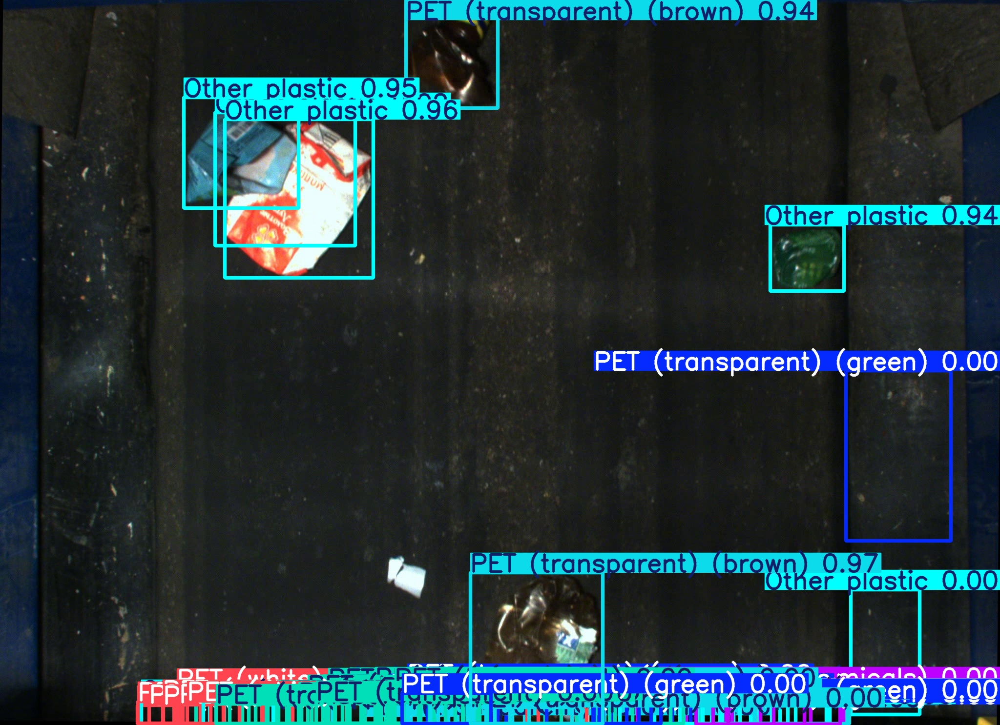

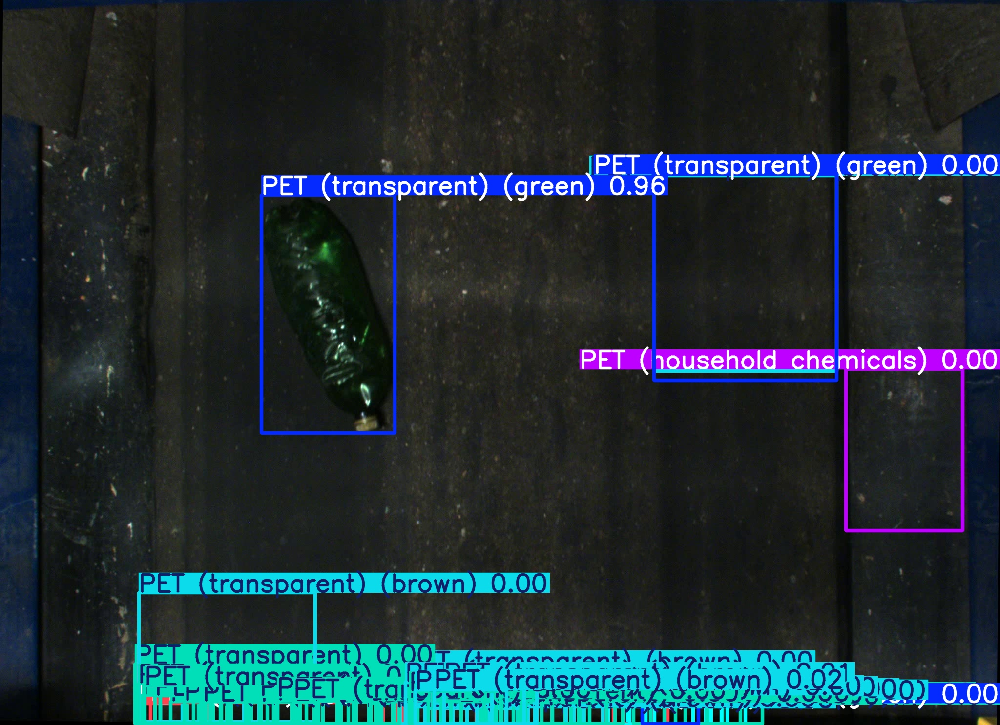

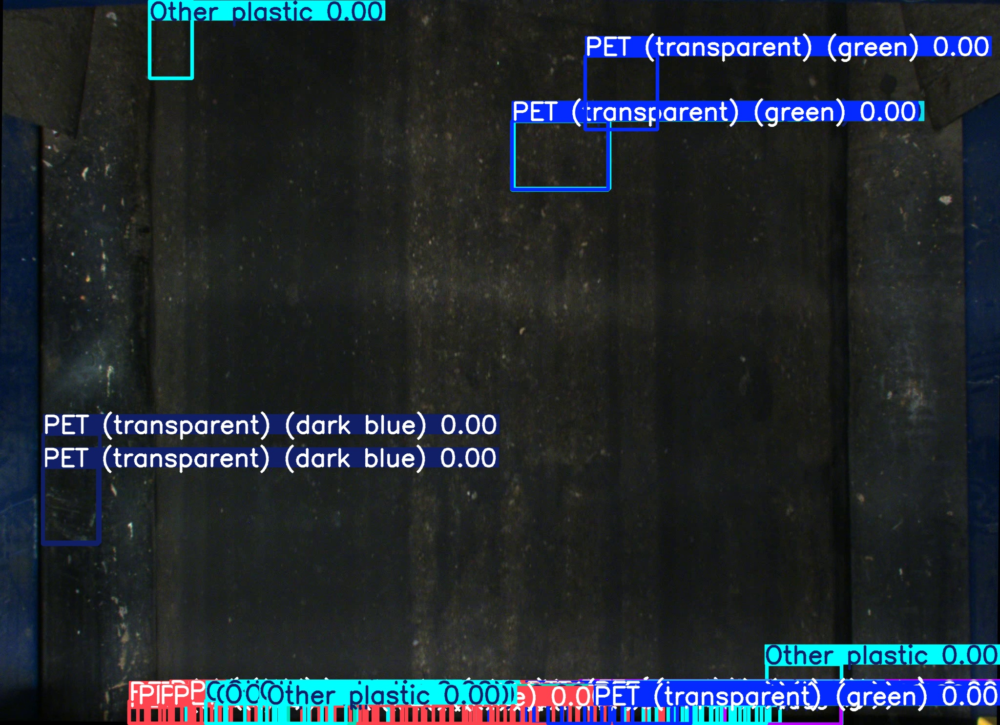

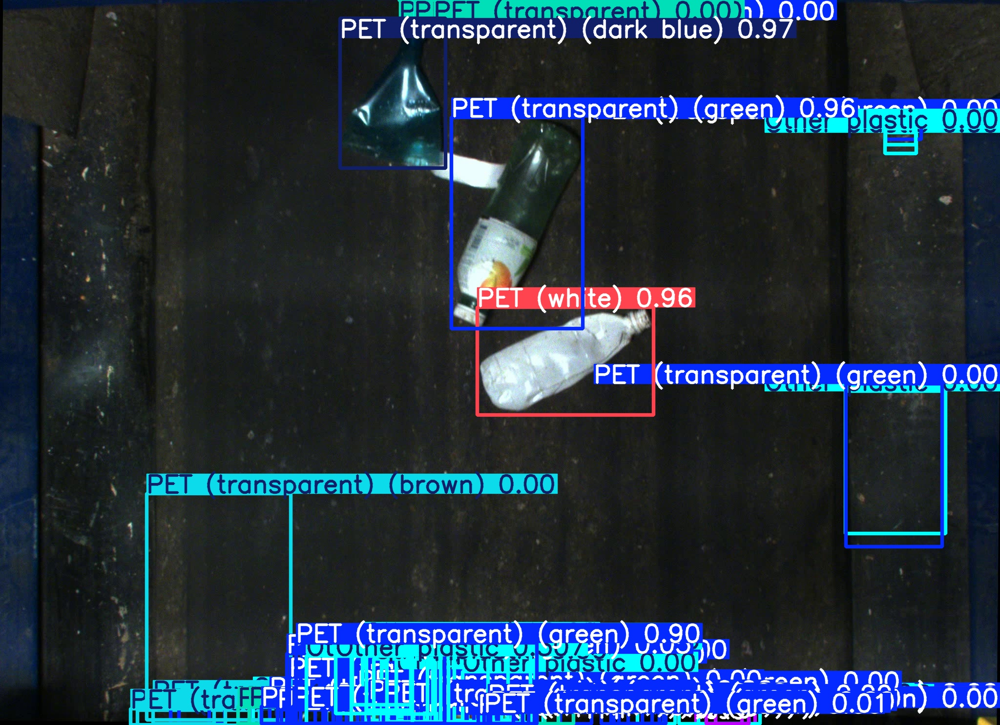

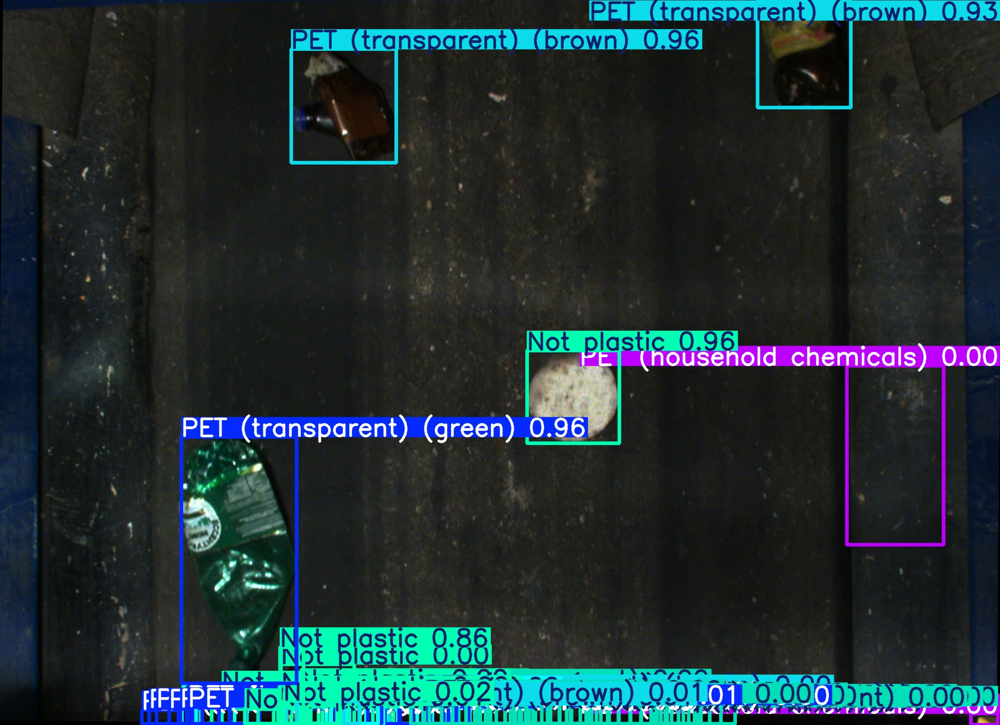

In [44]:
folder_path = '/content/runs/detect/predict2'

# Получаем список файлов с изображениями
image_files = [f for f in os.listdir(folder_path)
               if f.lower().endswith('.jpg')]

# Выбираем случайные 5 изображений
sample_images = random.sample(image_files, 5)

# Отображаем изображения с помощью display
for img_name in sample_images:
    img_path = os.path.join(folder_path, img_name)
    display(Image(filename=img_path))

## Общий вывод

В ходе проделанной работы была реализована модель детекции и классификации различных видов пластиковых отходов на конвейерной ленте мусороперерабатывающего завода. Для решения задачи был использован фреймворк YOLO, проведена предварительная обработка данных, подготовка датасета в требуемом формате, а также исследованы различные подходы к оптимизации качества модели.

Был применён подбор гиперпараметров (tune), учитывались разные варианты аугментаций, размеры батча и входного изображения. По итогам итераций были отобраны оптимальные настройки модели, позволившие достичь высоких значений метрик mAP.  Точность на валидационной выборке составил `mAP@0.5` 0.97, что говорит о том, что модель может с достаточной точносью и полнотой определять различные виды мусора.

Итоговые результаты в соревновии показали хорошие результаы (private: 0.87209, public: 0.87876). Работа заняла второе место.

Дальнейшие шаги по улучшению модели:
 * запустить подбор гиперпараметров на 300 итераций
 * попробовать применить raytune для поиска оптимальных гиперпараметров
 * использовать большую модель yolo11l